## Inpainting CGAN with CELEBA

Bài toán:
- Xây dựng mô hình tái tạo lại ảnh bị hư hỏng do thời gina hoặc tác động vật lý
Hướng tiếp cận:
- SỬ dung CelebA dataset
- Load 5000k ảnh
- Tiền xử lý,  tạo thêm mask và thêm mask vào ảnh gốcđể giả tạo ảnh bị hư hỏng
1. Load CelebA
2. tiền xử lý
3. xây dựng generator - discriminator
4. training:

In [ ]:
# Cài đặt các thư viện cần thiết
!pip install tensorflow numpy matplotlib gdown opencv-python


In [ ]:
# Tải bộ dữ liệu CelebA
import os
if not os.path.exists("img_align_celeba.zip"):
    !gdown "https://drive.google.com/uc?id=0B7EVK8r0v71pZjFTYXZWM3FlRnM" -O img_align_celeba.zip
    !unzip img_align_celeba.zip -d celebA

Streaming output truncated to the last 5000 lines.
 extracting: celebA/img_align_celeba/197600.jpg  
 extracting: celebA/img_align_celeba/197601.jpg  
 extracting: celebA/img_align_celeba/197602.jpg  
 extracting: celebA/img_align_celeba/197603.jpg  
 extracting: celebA/img_align_celeba/197604.jpg  
 extracting: celebA/img_align_celeba/197605.jpg  
 extracting: celebA/img_align_celeba/197606.jpg  
 extracting: celebA/img_align_celeba/197607.jpg  
 extracting: celebA/img_align_celeba/197608.jpg  
 extracting: celebA/img_align_celeba/197609.jpg  
 extracting: celebA/img_align_celeba/197610.jpg  
 extracting: celebA/img_align_celeba/197611.jpg  
 extracting: celebA/img_align_celeba/197612.jpg  
 extracting: celebA/img_align_celeba/197613.jpg  
 extracting: celebA/img_align_celeba/197614.jpg  
 extracting: celebA/img_align_celeba/197615.jpg  
 extracting: celebA/img_align_celeba/197616.jpg  
 extracting: celebA/img_align_celeba/197617.jpg  
 extracting: celebA/img_align_celeba/197618.jpg  

In [ ]:
import matplotlib.pyplot as plt

def display_sample_images(images, masks=None, grid_size=(4, 4)):
    """
    Hiển thị lưới ảnh mẫu từ dataset.
    Args:
        images (numpy array): Dataset ảnh (dạng batch: [batch_size, height, width, channels]).
        masks (numpy array): Mask tương ứng (nếu có). Default là None.
        grid_size (tuple): Kích thước lưới ảnh (rows, cols).
    """
    rows, cols = grid_size
    fig, axes = plt.subplots(rows, cols, figsize=(12, 12))
    fig.suptitle("Sample Images from Dataset", fontsize=16)

    for i in range(rows * cols):
        if i >= len(images):
            break
        ax = axes[i // cols, i % cols]
        ax.imshow(images[i])
        ax.axis("off")
        if masks is not None:
            ax.set_title("Masked" if masks[i].sum() > 0 else "Original", fontsize=10)

    plt.tight_layout()
    plt.show()

# Ví dụ sử dụng
# display_sample_images(masked_images[:16], masks=masks[:16], grid_size=(4, 4))


In [ ]:
import cv2
import numpy as np
from tensorflow.keras.utils import image_dataset_from_directory
import gc


def create_mask(image, mask_ratio=0.2):
    """Tạo mask ngẫu nhiên trên ảnh."""
    h, w, _ = image.shape
    mask = np.ones((h, w, 1), dtype=np.uint8)
    x = np.random.randint(0, w - int(mask_ratio * w))
    y = np.random.randint(0, h - int(mask_ratio * h))
    mask[y:y + int(mask_ratio * h), x:x + int(mask_ratio * w)] = 0
    return mask

def preprocess_image(image, mask_ratio=0.2):
    """Chuẩn bị ảnh input và mask."""
    image = cv2.resize(image, (128, 128)) / 255.0
    mask = create_mask(image, mask_ratio)
    masked_image = image * mask
    return masked_image, mask, image

# Tạo dataset
def load_dataset(data_dir, mask_ratio=0.2):
    images = []
    masks = []
    originals = []

    for filename in os.listdir(data_dir)[:5000]:  # Dùng 5k ảnh đầu tiên
        img = cv2.imread(os.path.join(data_dir, filename))
        if img is not None:
            masked_img, mask, original = preprocess_image(img, mask_ratio)
            images.append(masked_img)
            masks.append(mask)
            originals.append(original)

    return np.array(images), np.array(masks), np.array(originals)

masked_images, masks, originals = load_dataset("celebA/img_align_celeba")


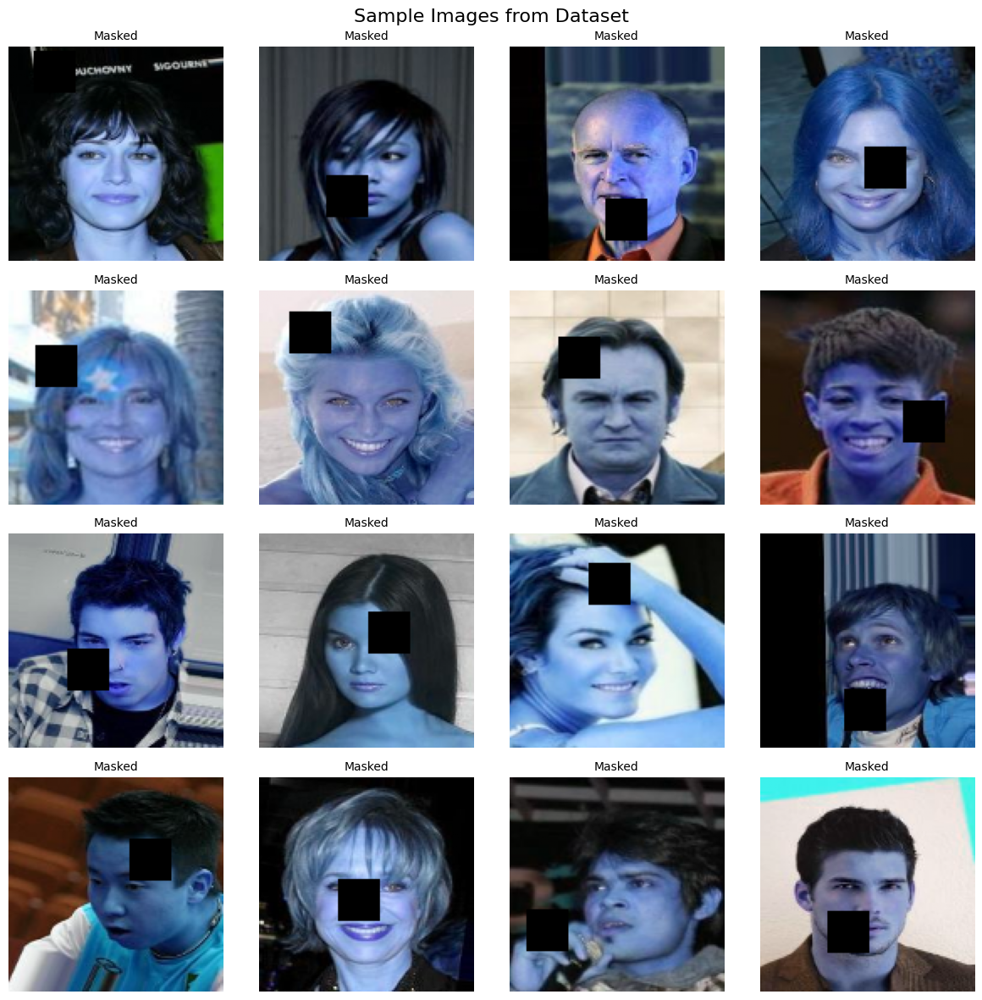

In [ ]:
#show image sample
display_sample_images(masked_images[:16], masks=masks[:16], grid_size=(4, 4))

In [ ]:
from tensorflow.keras import layers, Model

def build_unet_generator(input_shape=(128, 128, 4)):
    """
    U-Net Generator: Phục hồi ảnh từ input (ảnh bị hỏng + mask).
    """
    inputs = layers.Input(shape=input_shape)  # Input: Ảnh + mask

    # # Encoder
    e1 = layers.Conv2D(64, (4, 4), strides=2, padding="same", activation="relu")(inputs)
    e2 = layers.Conv2D(128, (4, 4), strides=2, padding="same", activation="relu")(e1)
    e3 = layers.Conv2D(256, (4, 4), strides=2, padding="same", activation="relu")(e2)
    e4 = layers.Conv2D(512, (4, 4), strides=2, padding="same", activation="relu")(e3)

    # Bottleneck
    b = layers.Conv2D(512, (4, 4), strides=2, padding="same", activation="relu")(e4)

    # Decoder with skip connections
    d4 = layers.Conv2DTranspose(512, (4, 4), strides=2, padding="same", activation="relu")(b)
    d4 = layers.Concatenate()([d4, e4])  # Skip connection
    d3 = layers.Conv2DTranspose(256, (4, 4), strides=2, padding="same", activation="relu")(d4)
    d3 = layers.Concatenate()([d3, e3])  # Skip connection
    d2 = layers.Conv2DTranspose(128, (4, 4), strides=2, padding="same", activation="relu")(d3)
    d2 = layers.Concatenate()([d2, e2])  # Skip connection
    d1 = layers.Conv2DTranspose(64, (4, 4), strides=2, padding="same", activation="relu")(d2)
    d1 = layers.Concatenate()([d1, e1])  # Skip connection

# Encoder (phần đi xuống)
    # e1 = layers.Conv2D(64, (3, 3), strides=1, padding="same", activation="relu")(inputs)
    # e2 = layers.Conv2D(128, (3, 3), strides=1, padding="same", activation="relu")(e1)
    # e3 = layers.Conv2D(256, (3, 3), strides=1, padding="same", activation="relu")(e2)
    # e4 = layers.Conv2D(512, (3, 3), strides=1, padding="same", activation="relu")(e3)
    # # Bottleneck (tầng giữa)
    # b = layers.Conv2D(512, (3, 3), strides=1, padding="same", activation="relu")(e4)

    # # Decoder (phần giải mã với skip connections)
    # d4 = layers.Conv2DTranspose(512, (3, 3), strides=1, padding="same", activation="relu")(b)
    # d4 = layers.Concatenate()([d4, e4])  # Skip connection với e4

    # d3 = layers.Conv2DTranspose(256, (3, 3), strides=1, padding="same", activation="relu")(d4)
    # d3 = layers.Concatenate()([d3, e3])  # Skip connection với e3

    # d2 = layers.Conv2DTranspose(128, (3, 3), strides=1, padding="same", activation="relu")(d3)
    # d2 = layers.Concatenate()([d2, e2])  # Skip connection với e2

    # d1 = layers.Conv2DTranspose(64, (3, 3), strides=1, padding="same", activation="relu")(d2)
    # d1 = layers.Concatenate()([d1, e1])  # Skip connection với e1
    # Output layer
    outputs = layers.Conv2D(3, (3, 3), padding="same", activation="sigmoid")(d1)  # Kích thước ảnh đầu ra
    outputs = layers.UpSampling2D(size=(2, 2))(outputs)  # Upsample to (128, 128, 3)
    # print(outputs.shape)
    return Model(inputs, outputs)


In [ ]:
def build_cgan_discriminator(input_shape=(128, 128, 3)):
    """
    Discriminator: Phân biệt ảnh thật và giả dựa trên điều kiện (ảnh bị hỏng + mask).
    """
    img_input = layers.Input(shape=input_shape)  # Ảnh đầu vào
    mask_input = layers.Input(shape=(128, 128, 1))  # Mask

    # Kết hợp ảnh và mask
    x = layers.Concatenate()([img_input, mask_input])
    x = layers.Conv2D(64, (4, 4), strides=2, padding="same", activation="relu")(x)
    x = layers.Conv2D(128, (4, 4), strides=2, padding="same", activation="relu")(x)
    x = layers.Conv2D(256, (4, 4), strides=2, padding="same", activation="relu")(x)
    x = layers.Flatten()(x)
    outputs = layers.Dense(1, activation="sigmoid")(x)  # Phân biệt thật/giả

    return Model([img_input, mask_input], outputs)


In [ ]:
import tensorflow as tf

generator = build_unet_generator(input_shape=(128, 128, 4))  # Ảnh + mask
discriminator = build_cgan_discriminator()

# Loss functions
adversarial_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
reconstruction_loss = tf.keras.losses.MeanAbsoluteError()

# Optimizer
gen_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
disc_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)


In [ ]:
@tf.function
def train_step(masked_images, masks, real_images):
    # Tạo ảnh giả
    masks = tf.cast(masks, tf.float64)
    combined_inputs = tf.concat([masked_images, masks], axis=-1)
    generated_images = generator(combined_inputs)

    # Discriminator training
    with tf.GradientTape() as disc_tape:
        real_output = discriminator([real_images, masks])
        fake_output = discriminator([generated_images, masks])
        disc_loss = adversarial_loss(tf.ones_like(real_output), real_output) + \
                    adversarial_loss(tf.zeros_like(fake_output), fake_output)

    disc_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    print("Discriminator gradients:", disc_gradients)
    print("Discriminator trainable variables:", discriminator.trainable_variables)
    print("Disc loss:", disc_loss)
    print("Real output:", real_output)
    print("Fake output:", fake_output)

    disc_optimizer.apply_gradients(zip(disc_gradients, discriminator.trainable_variables))

    # Generator training
    with tf.GradientTape() as gen_tape:
        fake_output = discriminator([generated_images, masks])
        adv_loss = adversarial_loss(tf.ones_like(fake_output), fake_output)
        # rec_loss = reconstruction_loss(real_images, generated_images)
        # gen_loss = adv_loss + 100 * rec_loss  # Weighted sum of adversarial and reconstruction loss

    gen_gradients = gen_tape.gradient(adv_loss, generator.trainable_variables)
    print("Generator gradients:", gen_gradients)
    print("Generator trainable variables:", generator.trainable_variables)
    print("Gen optimizer:", adv_loss)
    print("Gen fake_output:", fake_output)
    gen_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))


    return disc_loss, adv_loss


In [ ]:
# Huấn luyện trong nhiều epoch
EPOCHS = 50
for epoch in range(EPOCHS):
    for i in range(len(masked_images) // 64):  # Batch size = 64
        batch_masked = masked_images[i*64:(i+1)*64]
        batch_masks = masks[i*64:(i+1)*64]
        batch_real = originals[i*64:(i+1)*64]

        d_loss, g_loss = train_step(batch_masked, batch_masks, batch_real)

    print(f"Epoch {epoch+1}/{EPOCHS}, Disc Loss: {d_loss.numpy()}, Gen Loss: {g_loss.numpy()}")

Discriminator gradients: [<tf.Tensor 'AddN_2:0' shape=(4, 4, 4, 64) dtype=float32>, <tf.Tensor 'AddN_3:0' shape=(64,) dtype=float32>, <tf.Tensor 'AddN_4:0' shape=(4, 4, 64, 128) dtype=float32>, <tf.Tensor 'AddN_5:0' shape=(128,) dtype=float32>, <tf.Tensor 'AddN_6:0' shape=(4, 4, 128, 256) dtype=float32>, <tf.Tensor 'AddN_7:0' shape=(256,) dtype=float32>, <tf.Tensor 'AddN_8:0' shape=(65536, 1) dtype=float32>, <tf.Tensor 'AddN_9:0' shape=(1,) dtype=float32>]
Discriminator trainable variables: [<KerasVariable shape=(4, 4, 4, 64), dtype=float32, path=conv2d_33/kernel>, <KerasVariable shape=(64,), dtype=float32, path=conv2d_33/bias>, <KerasVariable shape=(4, 4, 64, 128), dtype=float32, path=conv2d_34/kernel>, <KerasVariable shape=(128,), dtype=float32, path=conv2d_34/bias>, <KerasVariable shape=(4, 4, 128, 256), dtype=float32, path=conv2d_35/kernel>, <KerasVariable shape=(256,), dtype=float32, path=conv2d_35/bias>, <KerasVariable shape=(65536, 1), dtype=float32, path=dense_3/kernel>, <Keras

ValueError: in user code:

    File "<ipython-input-32-c004fadcd0fc>", line 35, in train_step  *
        gen_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))
    File "/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/base_optimizer.py", line 291, in apply_gradients  **
        self.apply(grads, trainable_variables)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/base_optimizer.py", line 344, in apply
        grads, trainable_variables = self._filter_empty_gradients(
    File "/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/base_optimizer.py", line 676, in _filter_empty_gradients
        raise ValueError("No gradients provided for any variable.")

    ValueError: No gradients provided for any variable.


In [ ]:
for i in range(len(masked_images) // 64):  # Batch size = 64
    batch_masked = masked_images[i*64:(i+1)*64]
    batch_masks = masks[i*64:(i+1)*64]
    batch_real = originals[i*64:(i+1)*64]

    print("masked: ", batch_masked.shape)
    print("mask: ", batch_masks.shape)
    print("real: ", batch_real.shape)

    pixel_masked_image = masked_images[0, 50, 50]  # Lấy 1 pixel từ masked_images
    pixel_mask = masks[0, 50, 50]                  # Lấy 1 pixel từ masks

    print("Masked Image Pixel:")
    print("Value:", pixel_masked_image)  # Giá trị của pixel
    print("Dtype:", pixel_masked_image.dtype)    # Kiểu dữ liệu

    print("\nMask Pixel:")
    print("Value:", pixel_mask)          # Giá trị của pixel
    print("Dtype:", pixel_mask.dtype)
    break

masked:  (64, 128, 128, 3)
mask:  (64, 128, 128, 1)
real:  (64, 128, 128, 3)
Masked Image Pixel:
Value: [0.57254902 0.58823529 0.8       ]
Dtype: float64

Mask Pixel:
Value: [1]
Dtype: uint8


100%|██████████| 26.4M/26.4M [00:02<00:00, 11.9MB/s]


Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 29.5k/29.5k [00:00<00:00, 202kB/s]


Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 4.42M/4.42M [00:01<00:00, 3.70MB/s]


Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 5.15k/5.15k [00:00<00:00, 6.18MB/s]


Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw

Epoch [1/50], Batch [100/938], D Loss: 0.2256, G Loss: 1.7072
Epoch [1/50], Batch [200/938], D Loss: 0.3433, G Loss: 1.2038
Epoch [1/50], Batch [300/938], D Loss: 0.3498, G Loss: 1.4267
Epoch [1/50], Batch [400/938], D Loss: 0.5913, G Loss: 0.5601
Epoch [1/50], Batch [500/938], D Loss: 0.4668, G Loss: 1.0250
Epoch [1/50], Batch [600/938], D Loss: 0.3168, G Loss: 1.8372
Epoch [1/50], Batch [700/938], D Loss: 0.6517, G Loss: 2.1404
Epoch [1/50], Batch [800/938], D Loss: 0.6289, G Loss: 2.2926
Epoch [1/50], Batch [900/938], D Loss: 0.4119, G Loss: 0.9940


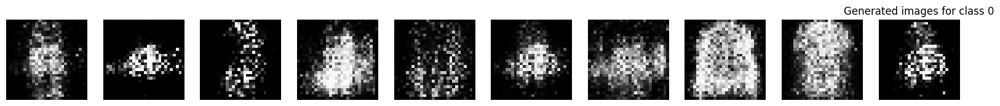

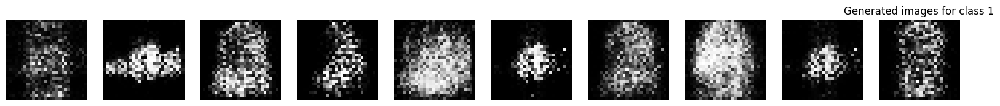

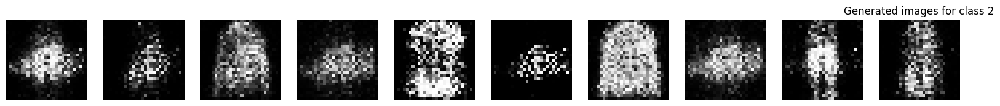

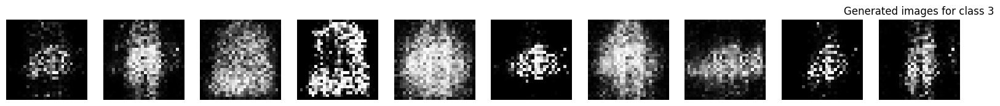

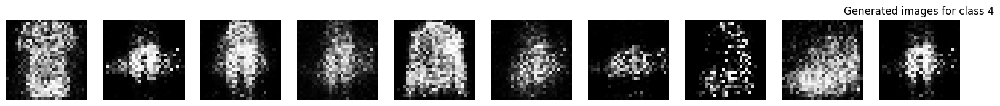

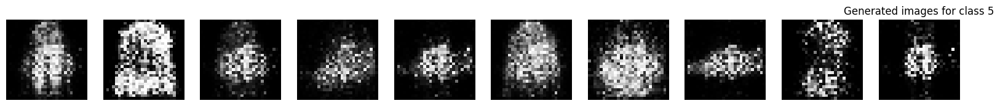

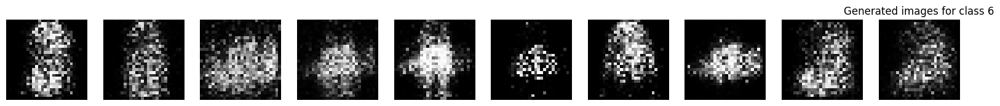

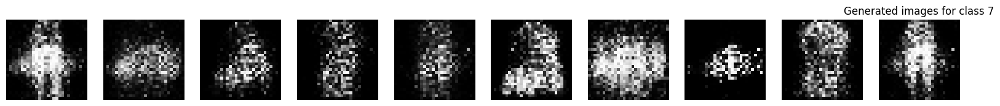

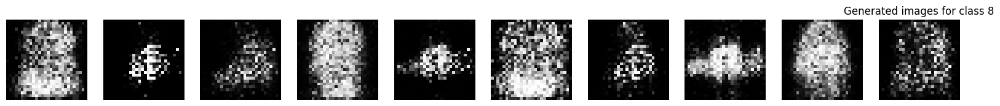

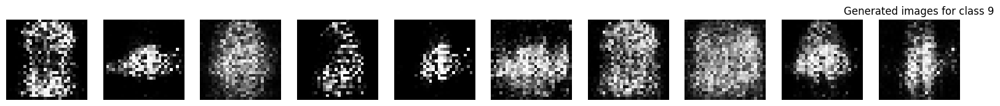

Epoch [2/50], Batch [100/938], D Loss: 0.4943, G Loss: 1.5207
Epoch [2/50], Batch [200/938], D Loss: 0.4183, G Loss: 1.2698
Epoch [2/50], Batch [300/938], D Loss: 0.4507, G Loss: 1.1794
Epoch [2/50], Batch [400/938], D Loss: 0.3880, G Loss: 2.2611
Epoch [2/50], Batch [500/938], D Loss: 0.5954, G Loss: 0.7546
Epoch [2/50], Batch [600/938], D Loss: 0.5648, G Loss: 1.7904
Epoch [2/50], Batch [700/938], D Loss: 0.4226, G Loss: 1.1651
Epoch [2/50], Batch [800/938], D Loss: 0.4750, G Loss: 1.2277
Epoch [2/50], Batch [900/938], D Loss: 0.5225, G Loss: 1.1646


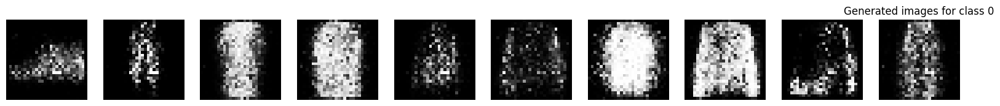

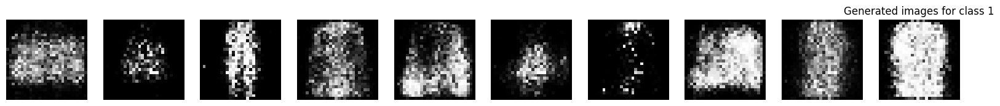

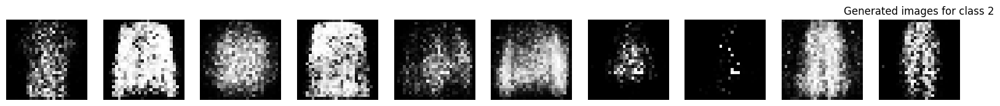

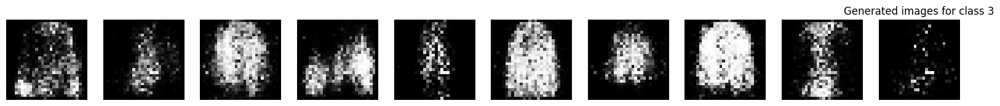

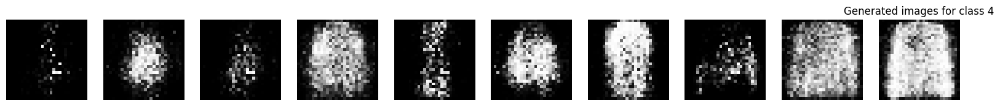

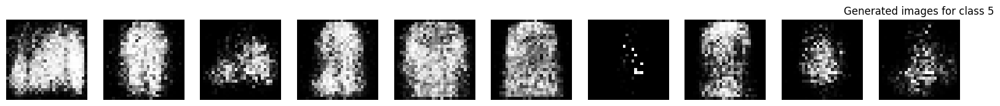

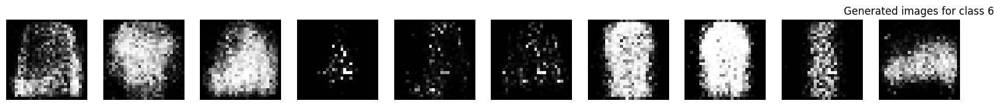

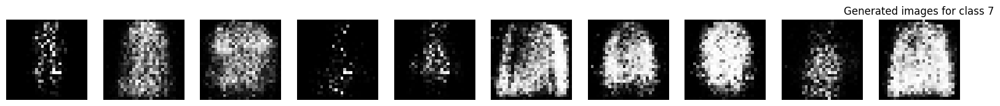

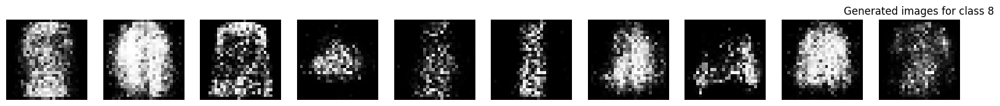

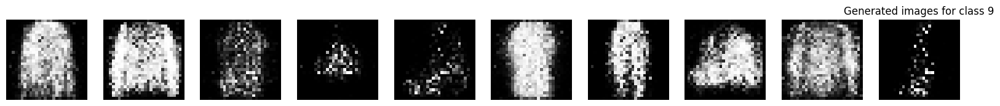

Epoch [3/50], Batch [100/938], D Loss: 0.4772, G Loss: 1.2970
Epoch [3/50], Batch [200/938], D Loss: 0.6170, G Loss: 1.5904
Epoch [3/50], Batch [300/938], D Loss: 0.5548, G Loss: 1.6679
Epoch [3/50], Batch [400/938], D Loss: 0.3932, G Loss: 1.3055
Epoch [3/50], Batch [500/938], D Loss: 0.4342, G Loss: 1.1943
Epoch [3/50], Batch [600/938], D Loss: 0.4039, G Loss: 1.7355
Epoch [3/50], Batch [700/938], D Loss: 0.4861, G Loss: 0.9212
Epoch [3/50], Batch [800/938], D Loss: 0.6191, G Loss: 1.6508
Epoch [3/50], Batch [900/938], D Loss: 0.5739, G Loss: 2.0884


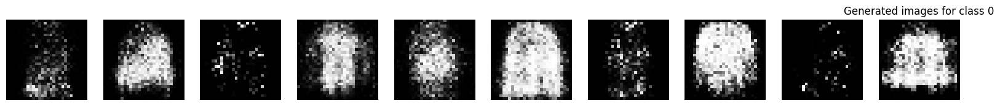

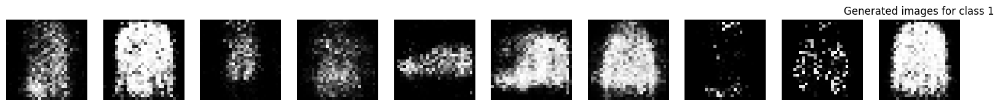

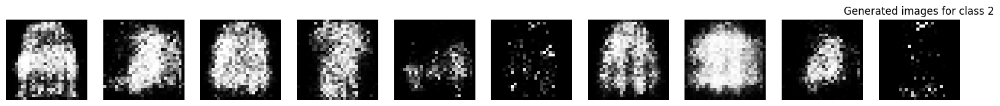

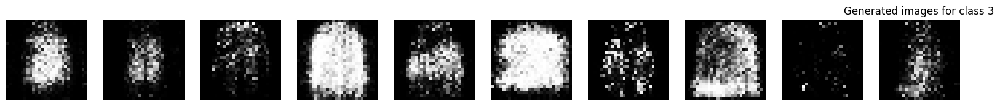

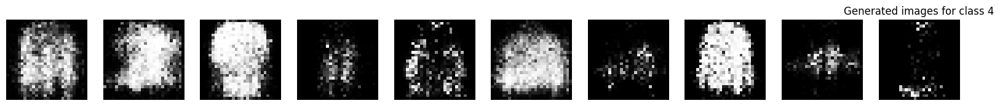

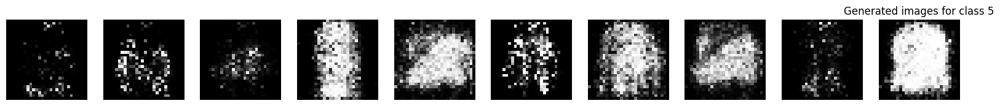

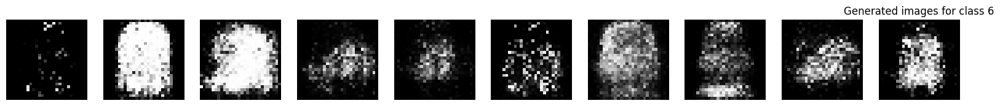

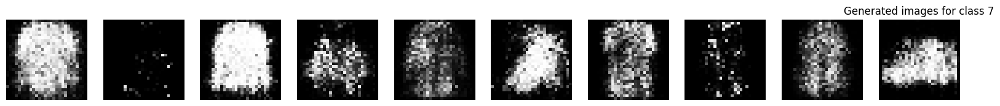

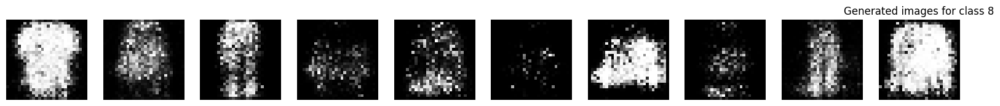

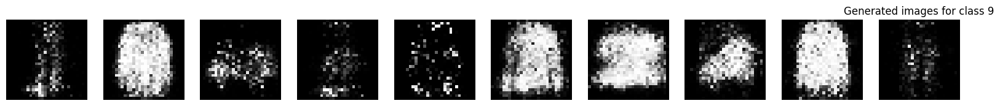

Epoch [4/50], Batch [100/938], D Loss: 0.4719, G Loss: 1.6199
Epoch [4/50], Batch [200/938], D Loss: 0.4265, G Loss: 1.6070
Epoch [4/50], Batch [300/938], D Loss: 0.4974, G Loss: 1.1688
Epoch [4/50], Batch [400/938], D Loss: 0.5448, G Loss: 1.0902
Epoch [4/50], Batch [500/938], D Loss: 0.5332, G Loss: 1.3837
Epoch [4/50], Batch [600/938], D Loss: 0.4476, G Loss: 1.3793
Epoch [4/50], Batch [700/938], D Loss: 0.4792, G Loss: 1.1261
Epoch [4/50], Batch [800/938], D Loss: 0.4623, G Loss: 1.6625
Epoch [4/50], Batch [900/938], D Loss: 0.4449, G Loss: 1.5845


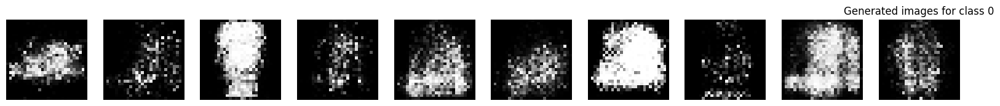

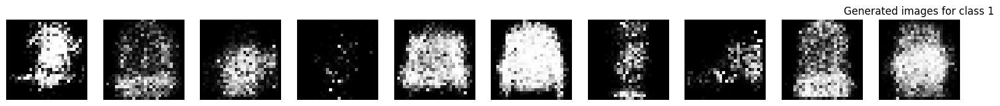

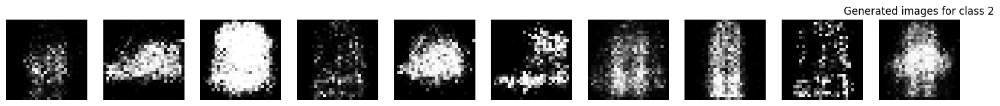

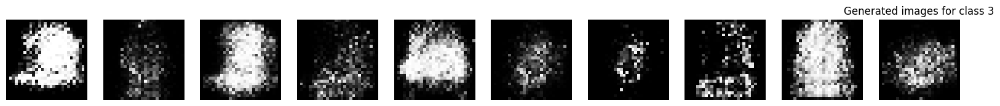

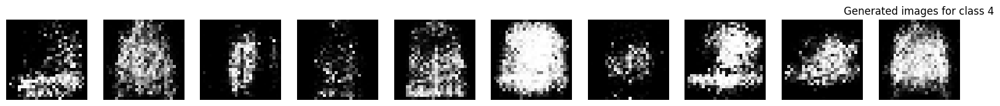

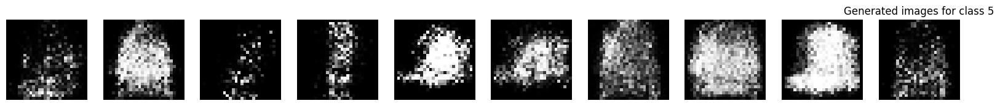

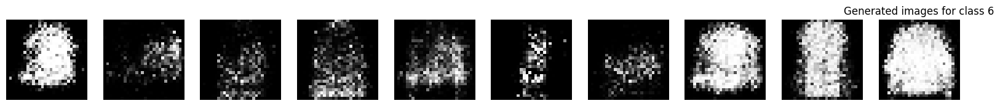

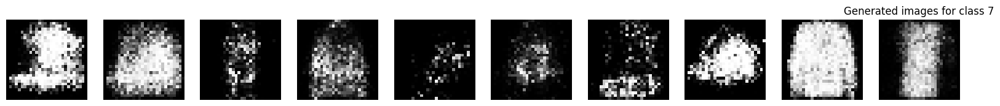

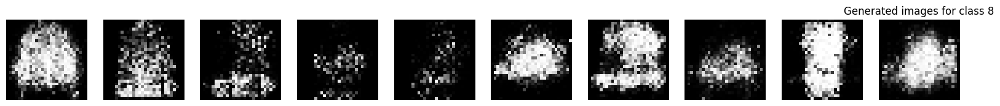

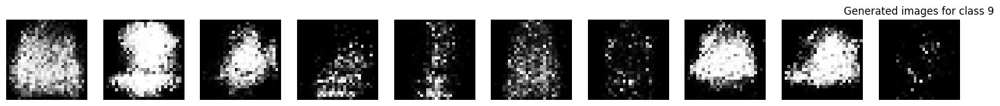

Epoch [5/50], Batch [100/938], D Loss: 0.4110, G Loss: 1.3260
Epoch [5/50], Batch [200/938], D Loss: 0.5297, G Loss: 0.9889
Epoch [5/50], Batch [300/938], D Loss: 0.4792, G Loss: 0.8597
Epoch [5/50], Batch [400/938], D Loss: 0.4201, G Loss: 1.5169
Epoch [5/50], Batch [500/938], D Loss: 0.4573, G Loss: 1.8933
Epoch [5/50], Batch [600/938], D Loss: 0.5483, G Loss: 1.7446
Epoch [5/50], Batch [700/938], D Loss: 0.5358, G Loss: 1.7126
Epoch [5/50], Batch [800/938], D Loss: 0.3831, G Loss: 1.3315
Epoch [5/50], Batch [900/938], D Loss: 0.5208, G Loss: 0.9500


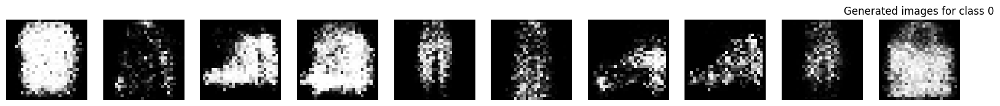

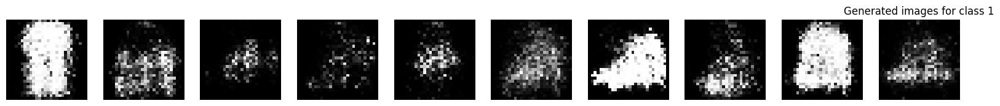

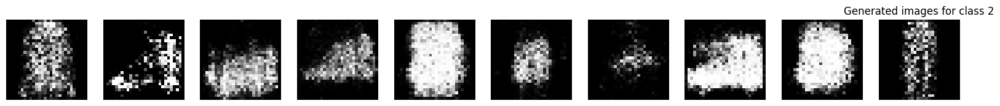

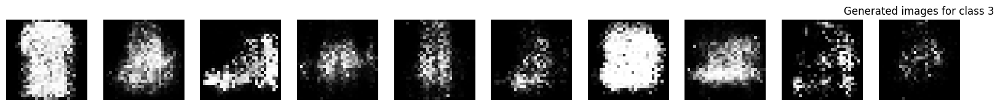

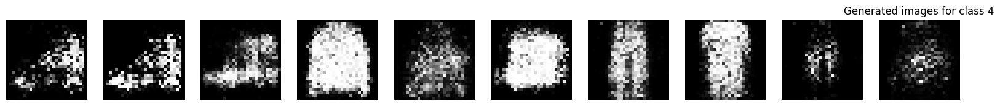

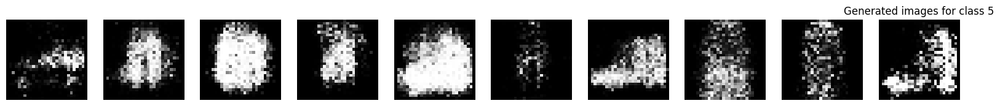

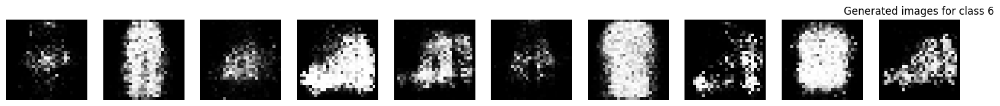

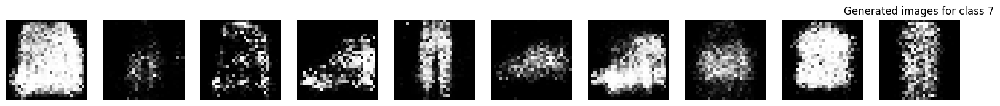

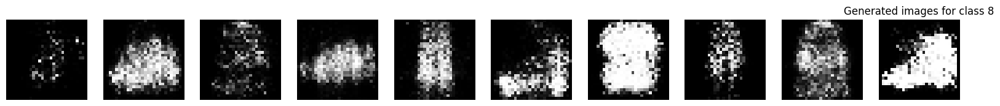

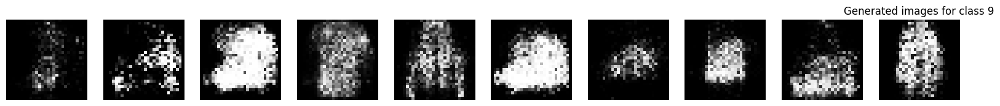

Epoch [6/50], Batch [100/938], D Loss: 0.5717, G Loss: 1.7172
Epoch [6/50], Batch [200/938], D Loss: 0.6060, G Loss: 1.0588
Epoch [6/50], Batch [300/938], D Loss: 0.4346, G Loss: 1.4826
Epoch [6/50], Batch [400/938], D Loss: 0.4681, G Loss: 1.1882
Epoch [6/50], Batch [500/938], D Loss: 0.5400, G Loss: 0.6915
Epoch [6/50], Batch [600/938], D Loss: 0.4572, G Loss: 1.6178
Epoch [6/50], Batch [700/938], D Loss: 0.4061, G Loss: 1.4035
Epoch [6/50], Batch [800/938], D Loss: 0.4584, G Loss: 2.5886
Epoch [6/50], Batch [900/938], D Loss: 0.5619, G Loss: 0.9939


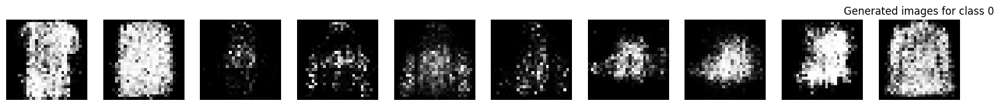

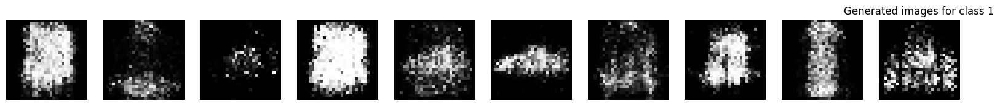

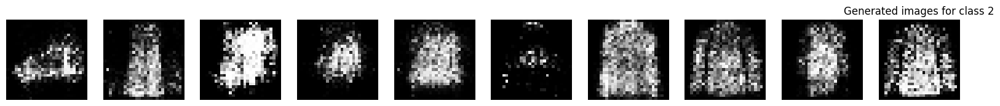

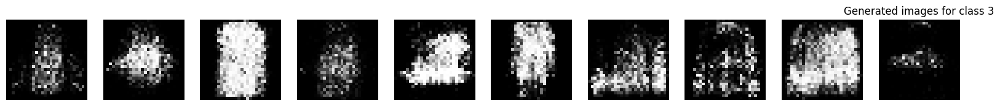

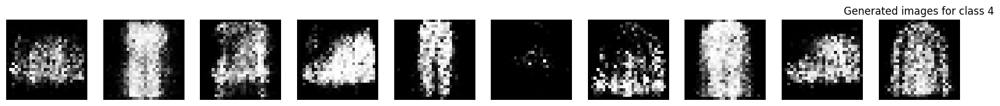

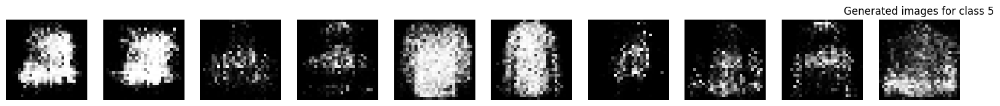

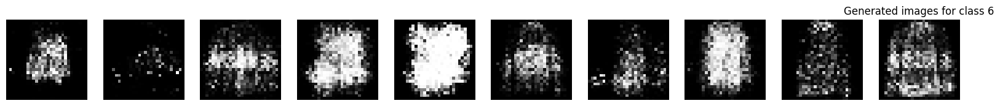

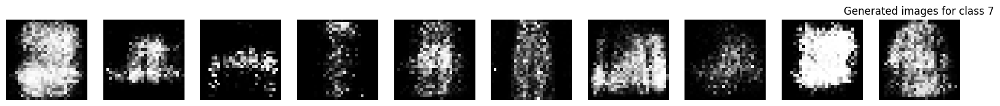

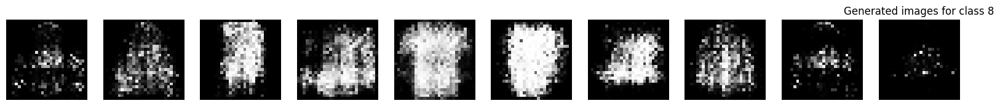

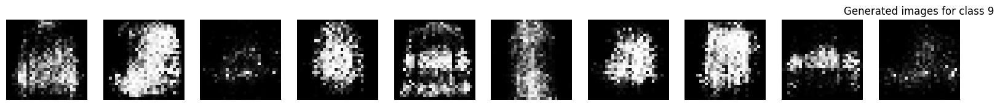

Epoch [7/50], Batch [100/938], D Loss: 0.4627, G Loss: 1.4834
Epoch [7/50], Batch [200/938], D Loss: 0.5031, G Loss: 1.1435
Epoch [7/50], Batch [300/938], D Loss: 0.3905, G Loss: 1.6321
Epoch [7/50], Batch [400/938], D Loss: 0.3138, G Loss: 1.6783
Epoch [7/50], Batch [500/938], D Loss: 0.4327, G Loss: 1.6757
Epoch [7/50], Batch [600/938], D Loss: 0.3869, G Loss: 1.8476
Epoch [7/50], Batch [700/938], D Loss: 0.4457, G Loss: 1.7174
Epoch [7/50], Batch [800/938], D Loss: 0.5151, G Loss: 1.8368
Epoch [7/50], Batch [900/938], D Loss: 0.4866, G Loss: 1.1318


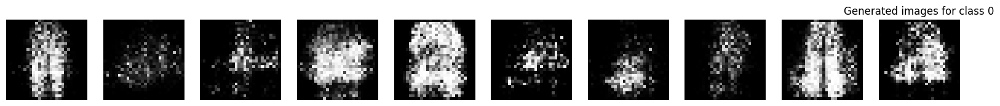

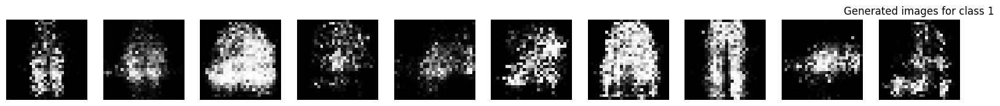

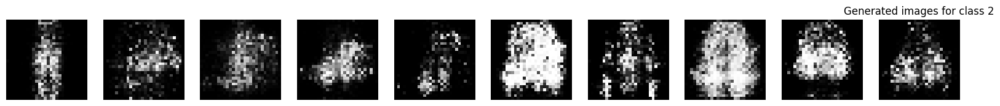

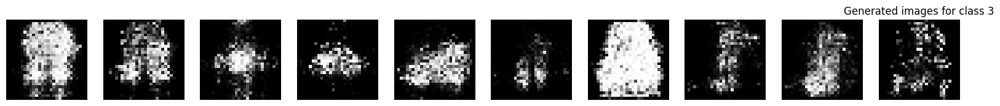

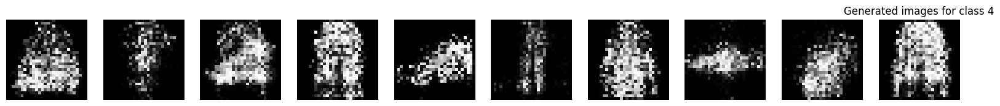

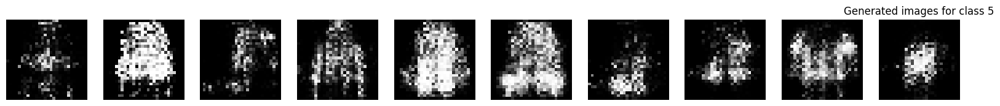

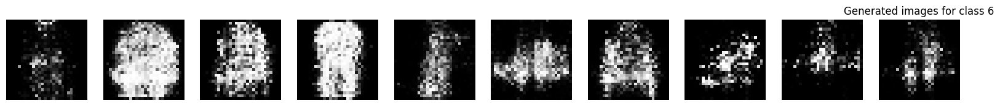

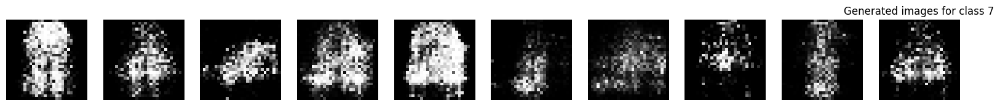

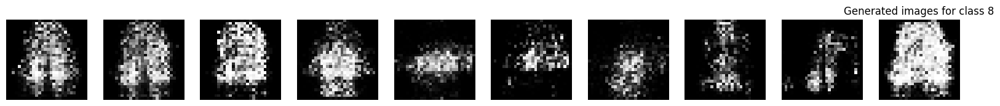

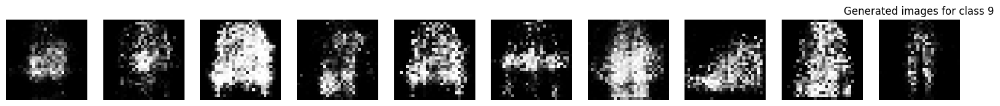

Epoch [8/50], Batch [100/938], D Loss: 0.4432, G Loss: 1.3676
Epoch [8/50], Batch [200/938], D Loss: 0.4667, G Loss: 1.1530
Epoch [8/50], Batch [300/938], D Loss: 0.4526, G Loss: 1.1317
Epoch [8/50], Batch [400/938], D Loss: 0.6402, G Loss: 0.6637
Epoch [8/50], Batch [500/938], D Loss: 0.5354, G Loss: 0.8993
Epoch [8/50], Batch [600/938], D Loss: 0.4314, G Loss: 1.1789
Epoch [8/50], Batch [700/938], D Loss: 0.5380, G Loss: 1.0027
Epoch [8/50], Batch [800/938], D Loss: 0.4781, G Loss: 1.6052
Epoch [8/50], Batch [900/938], D Loss: 0.5679, G Loss: 1.3349


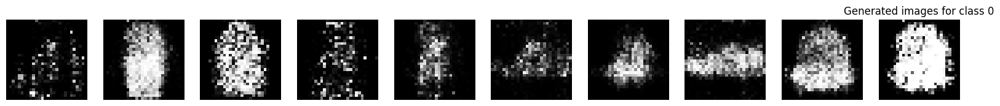

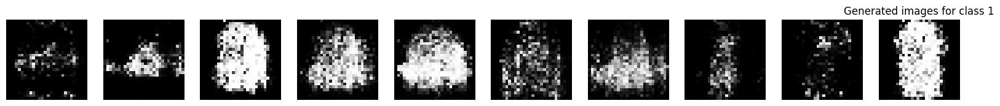

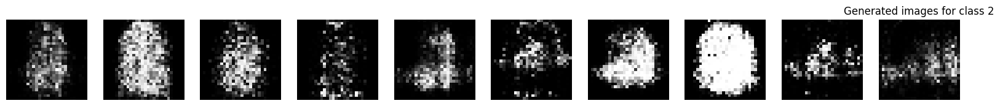

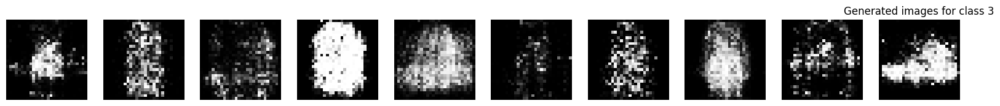

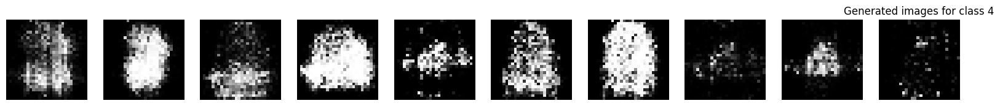

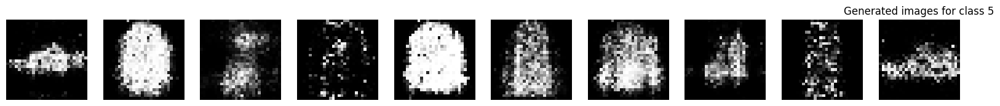

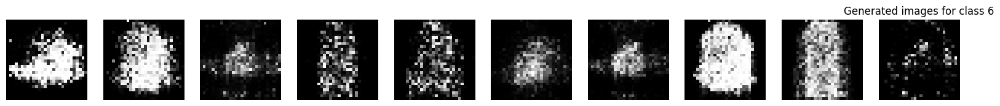

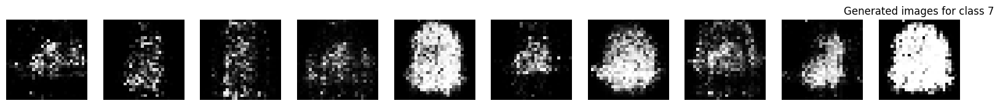

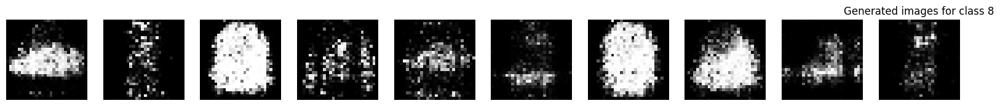

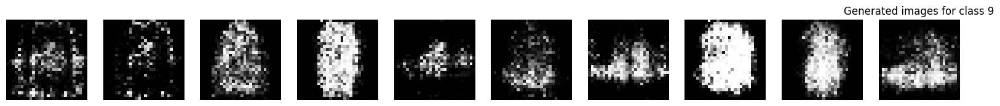

Epoch [9/50], Batch [100/938], D Loss: 0.5712, G Loss: 0.8345
Epoch [9/50], Batch [200/938], D Loss: 0.4322, G Loss: 1.1833
Epoch [9/50], Batch [300/938], D Loss: 0.5264, G Loss: 1.2782
Epoch [9/50], Batch [400/938], D Loss: 0.5860, G Loss: 1.3784
Epoch [9/50], Batch [500/938], D Loss: 0.4383, G Loss: 1.1733
Epoch [9/50], Batch [600/938], D Loss: 0.4338, G Loss: 0.9265
Epoch [9/50], Batch [700/938], D Loss: 0.5497, G Loss: 1.2866
Epoch [9/50], Batch [800/938], D Loss: 0.4661, G Loss: 1.0275
Epoch [9/50], Batch [900/938], D Loss: 0.4196, G Loss: 1.2035


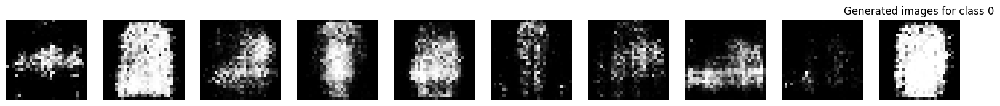

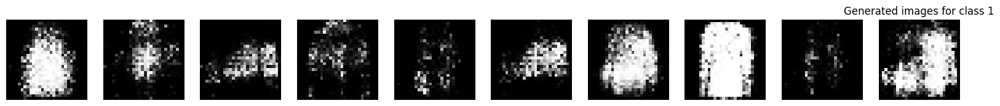

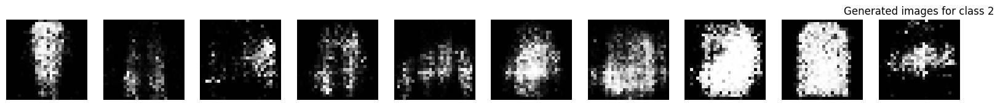

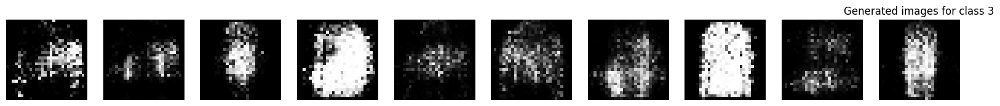

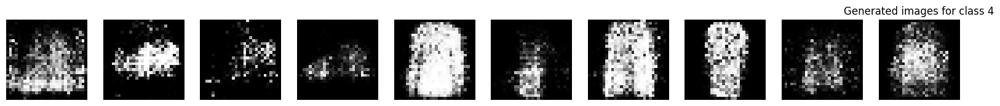

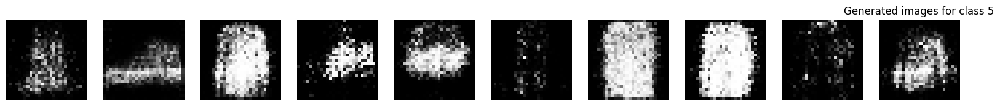

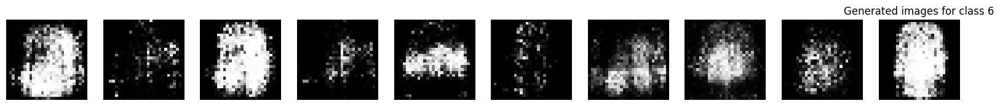

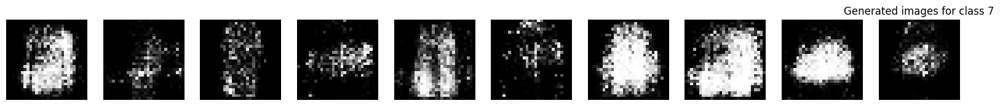

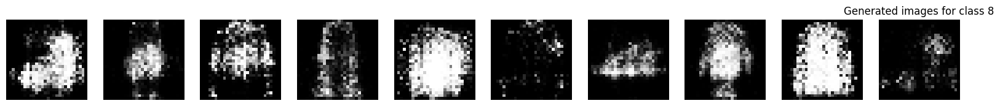

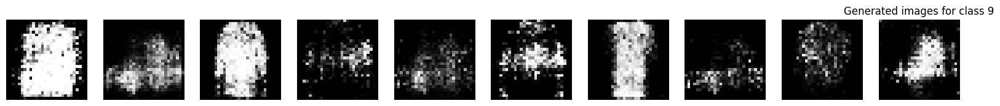

Epoch [10/50], Batch [100/938], D Loss: 0.4797, G Loss: 1.6968
Epoch [10/50], Batch [200/938], D Loss: 0.4810, G Loss: 1.0822
Epoch [10/50], Batch [300/938], D Loss: 0.6031, G Loss: 0.7595
Epoch [10/50], Batch [400/938], D Loss: 0.4830, G Loss: 0.9303
Epoch [10/50], Batch [500/938], D Loss: 0.4903, G Loss: 1.0322
Epoch [10/50], Batch [600/938], D Loss: 0.5364, G Loss: 1.0282
Epoch [10/50], Batch [700/938], D Loss: 0.5647, G Loss: 1.0950
Epoch [10/50], Batch [800/938], D Loss: 0.6592, G Loss: 1.9766
Epoch [10/50], Batch [900/938], D Loss: 0.5006, G Loss: 0.8010


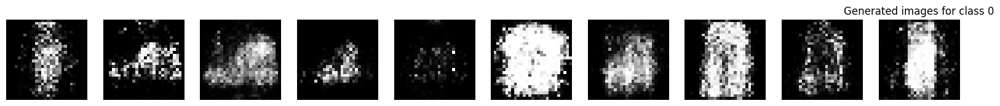

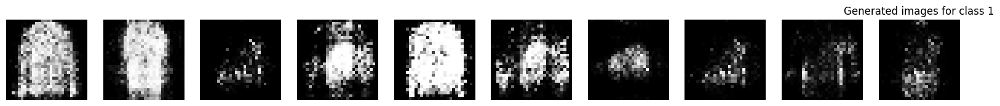

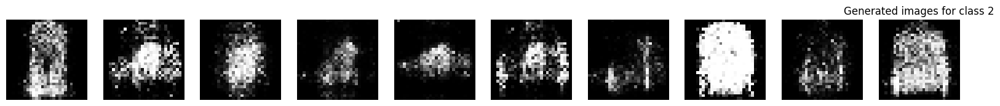

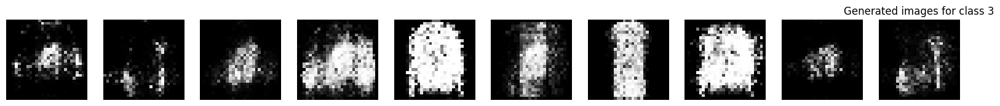

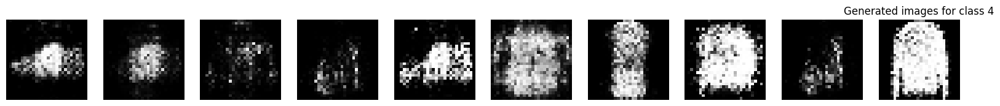

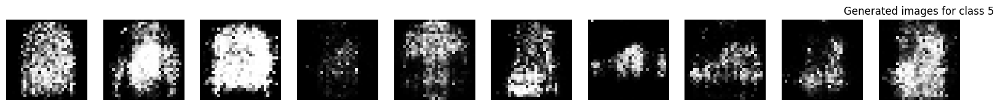

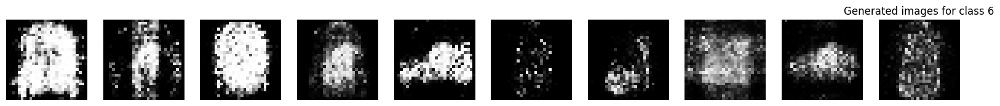

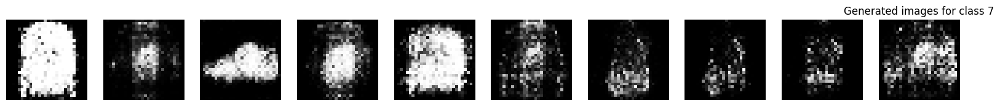

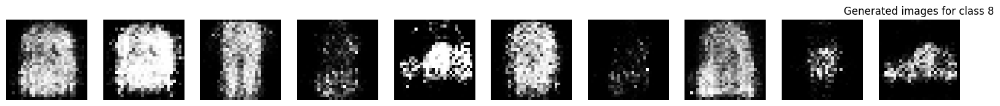

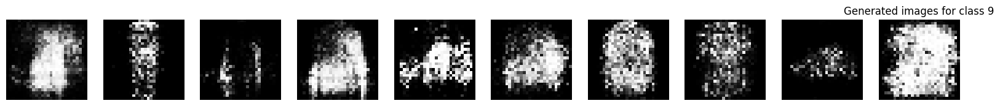

Epoch [11/50], Batch [100/938], D Loss: 0.5823, G Loss: 0.6553
Epoch [11/50], Batch [200/938], D Loss: 0.5311, G Loss: 1.9484
Epoch [11/50], Batch [300/938], D Loss: 0.5085, G Loss: 0.8602
Epoch [11/50], Batch [400/938], D Loss: 0.6142, G Loss: 0.9097
Epoch [11/50], Batch [500/938], D Loss: 0.4464, G Loss: 1.2813
Epoch [11/50], Batch [600/938], D Loss: 0.5290, G Loss: 0.8383
Epoch [11/50], Batch [700/938], D Loss: 0.5297, G Loss: 1.6025
Epoch [11/50], Batch [800/938], D Loss: 0.5917, G Loss: 0.6681
Epoch [11/50], Batch [900/938], D Loss: 0.5142, G Loss: 1.0892


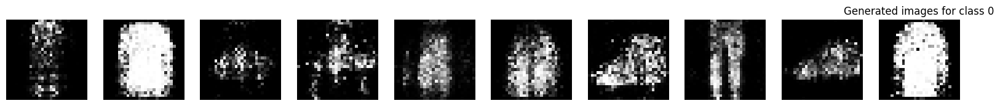

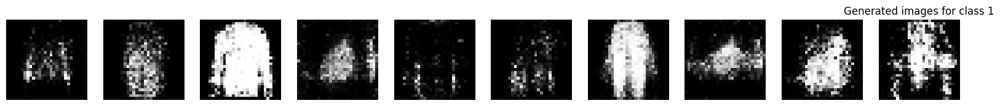

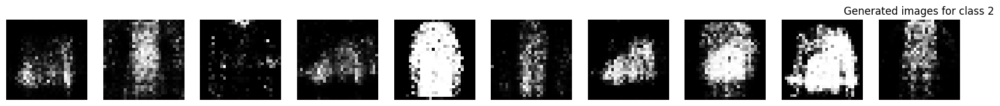

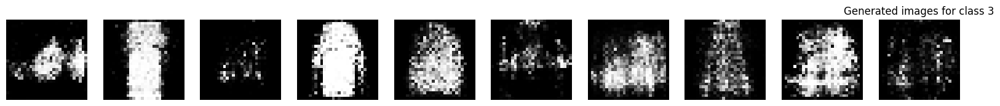

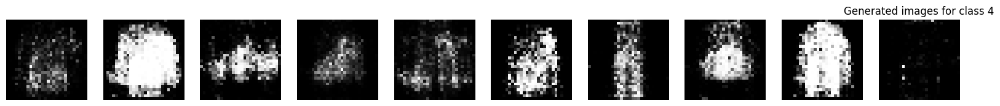

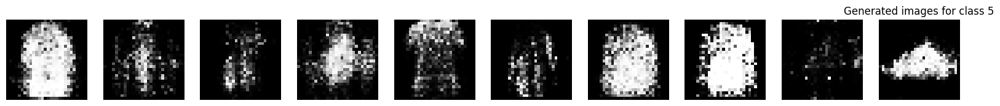

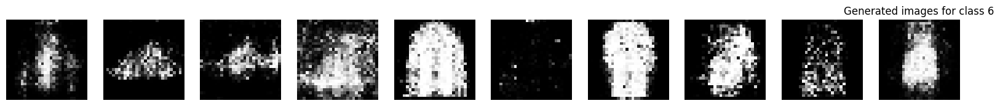

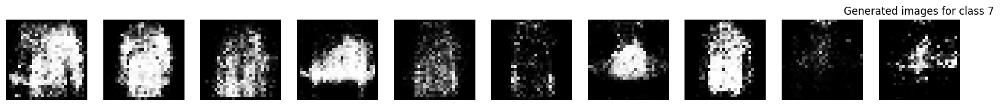

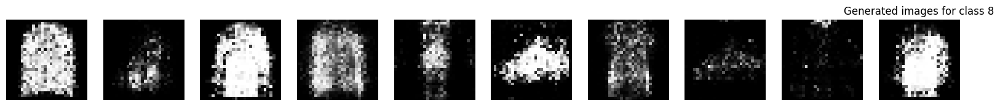

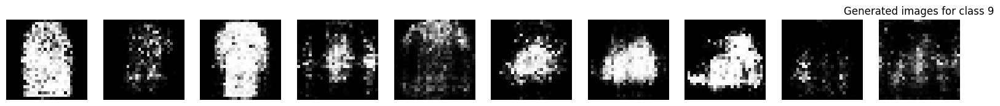

Epoch [12/50], Batch [100/938], D Loss: 0.5806, G Loss: 0.9268
Epoch [12/50], Batch [200/938], D Loss: 0.5193, G Loss: 1.2802
Epoch [12/50], Batch [300/938], D Loss: 0.5929, G Loss: 1.0862
Epoch [12/50], Batch [400/938], D Loss: 0.5480, G Loss: 1.2831
Epoch [12/50], Batch [500/938], D Loss: 0.4609, G Loss: 0.9148
Epoch [12/50], Batch [600/938], D Loss: 0.5308, G Loss: 1.3534
Epoch [12/50], Batch [700/938], D Loss: 0.5271, G Loss: 1.1710
Epoch [12/50], Batch [800/938], D Loss: 0.6130, G Loss: 0.7219
Epoch [12/50], Batch [900/938], D Loss: 0.5382, G Loss: 1.0322


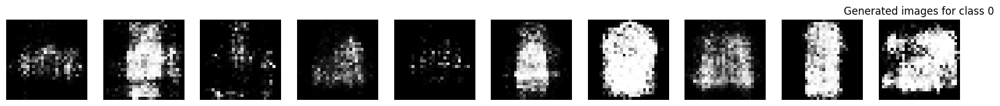

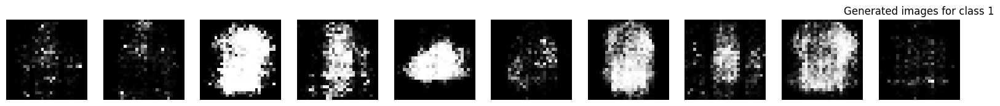

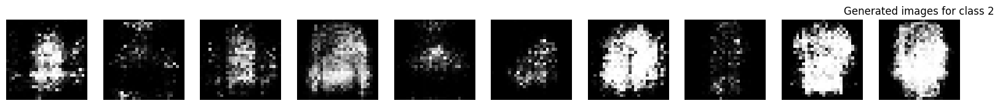

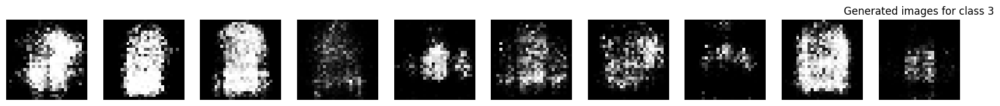

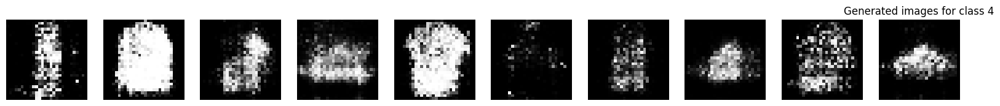

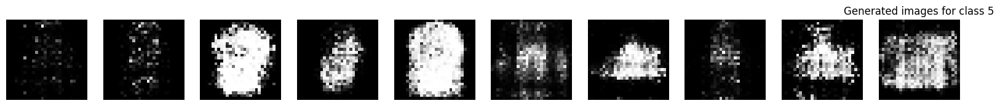

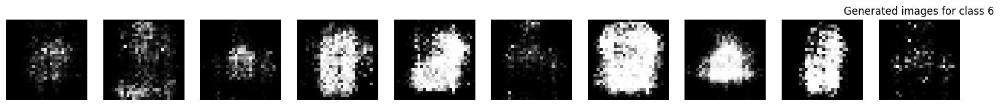

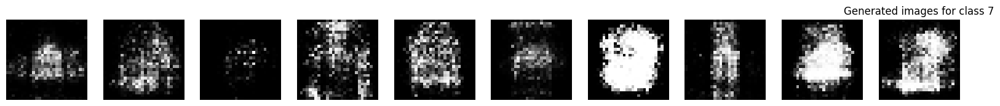

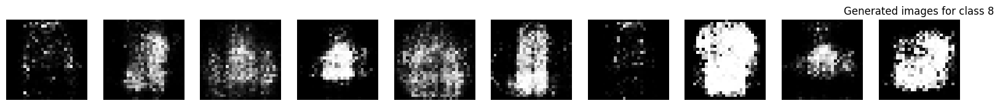

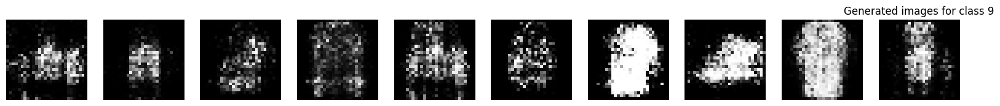

Epoch [13/50], Batch [100/938], D Loss: 0.5332, G Loss: 0.8177
Epoch [13/50], Batch [200/938], D Loss: 0.5177, G Loss: 0.8404
Epoch [13/50], Batch [300/938], D Loss: 0.4939, G Loss: 1.0808
Epoch [13/50], Batch [400/938], D Loss: 0.4263, G Loss: 1.7580
Epoch [13/50], Batch [500/938], D Loss: 0.4278, G Loss: 1.0041
Epoch [13/50], Batch [600/938], D Loss: 0.5784, G Loss: 1.1197
Epoch [13/50], Batch [700/938], D Loss: 0.5644, G Loss: 1.0148
Epoch [13/50], Batch [800/938], D Loss: 0.5429, G Loss: 1.0372
Epoch [13/50], Batch [900/938], D Loss: 0.5037, G Loss: 1.1013


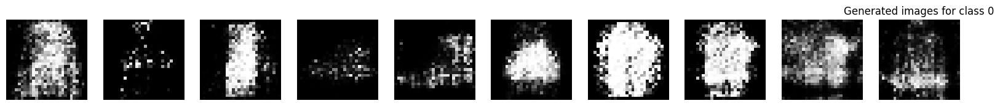

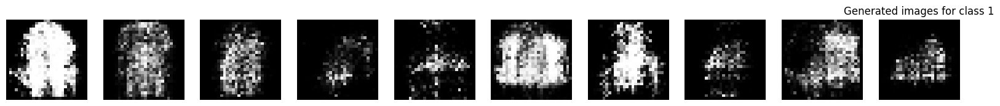

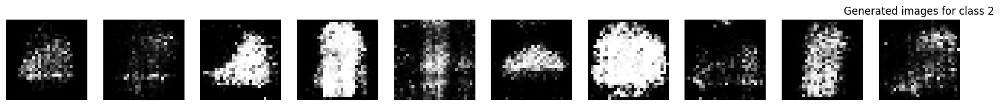

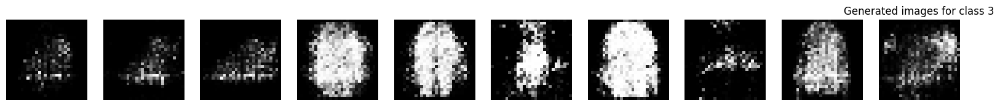

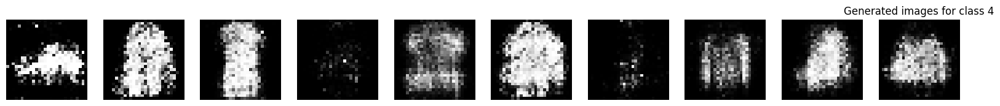

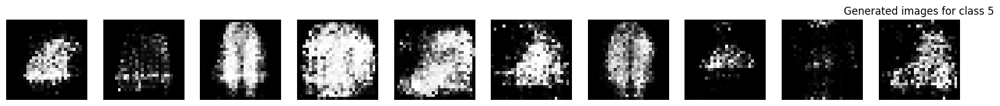

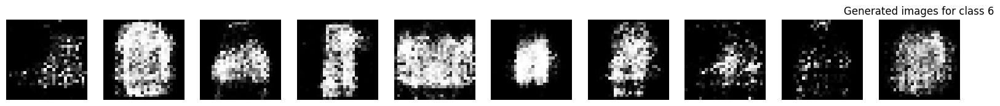

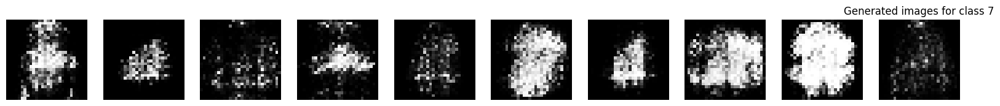

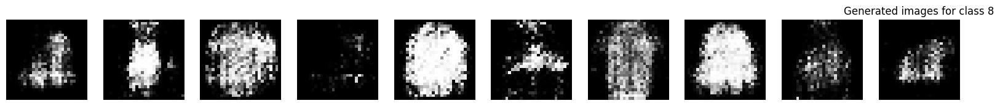

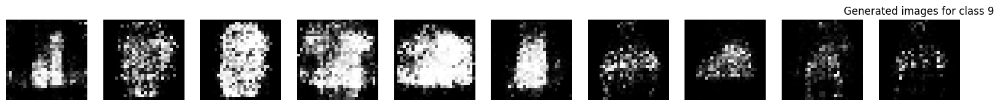

Epoch [14/50], Batch [100/938], D Loss: 0.4959, G Loss: 1.2636
Epoch [14/50], Batch [200/938], D Loss: 0.5543, G Loss: 1.4391
Epoch [14/50], Batch [300/938], D Loss: 0.5362, G Loss: 0.8197
Epoch [14/50], Batch [400/938], D Loss: 0.4797, G Loss: 0.8171
Epoch [14/50], Batch [500/938], D Loss: 0.5536, G Loss: 1.5233
Epoch [14/50], Batch [600/938], D Loss: 0.4412, G Loss: 2.0513
Epoch [14/50], Batch [700/938], D Loss: 0.4756, G Loss: 1.1143
Epoch [14/50], Batch [800/938], D Loss: 0.4614, G Loss: 1.3623
Epoch [14/50], Batch [900/938], D Loss: 0.5448, G Loss: 1.1617


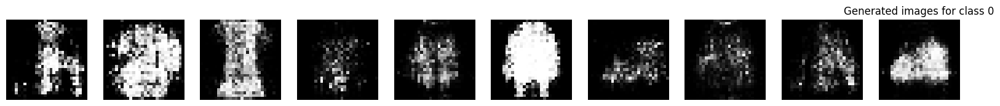

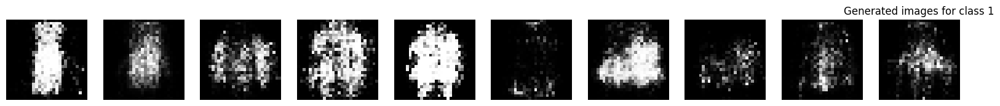

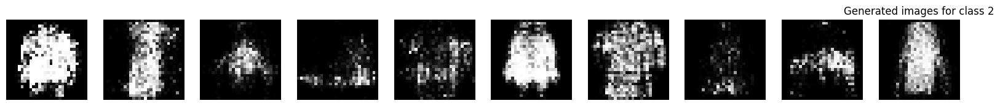

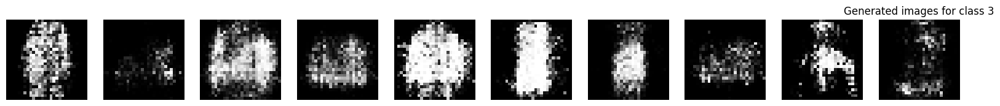

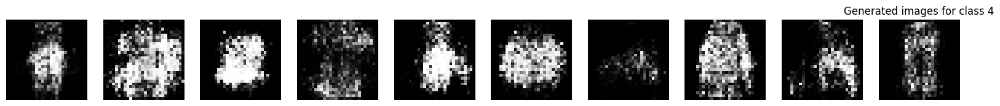

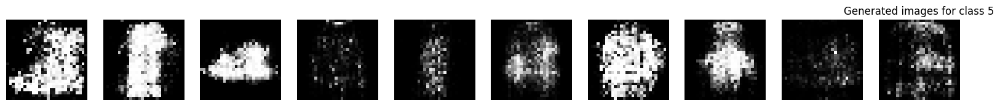

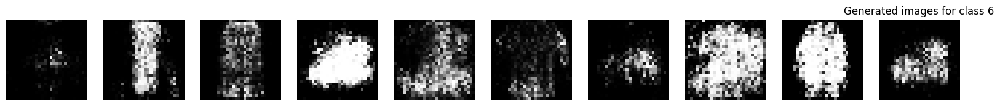

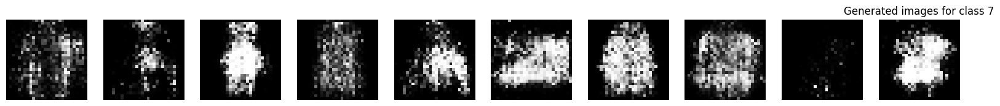

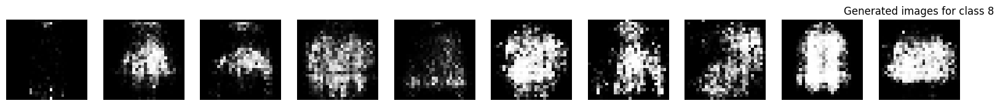

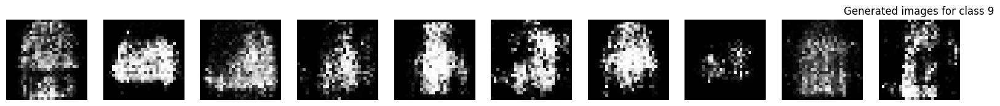

Epoch [15/50], Batch [100/938], D Loss: 0.5257, G Loss: 1.2781
Epoch [15/50], Batch [200/938], D Loss: 0.5130, G Loss: 1.0371
Epoch [15/50], Batch [300/938], D Loss: 0.6666, G Loss: 2.0985
Epoch [15/50], Batch [400/938], D Loss: 0.5480, G Loss: 1.2089
Epoch [15/50], Batch [500/938], D Loss: 0.5066, G Loss: 0.8648
Epoch [15/50], Batch [600/938], D Loss: 0.5485, G Loss: 1.3968
Epoch [15/50], Batch [700/938], D Loss: 0.5981, G Loss: 1.0604
Epoch [15/50], Batch [800/938], D Loss: 0.5863, G Loss: 0.6691
Epoch [15/50], Batch [900/938], D Loss: 0.5167, G Loss: 0.9447


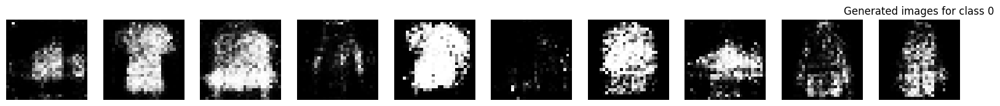

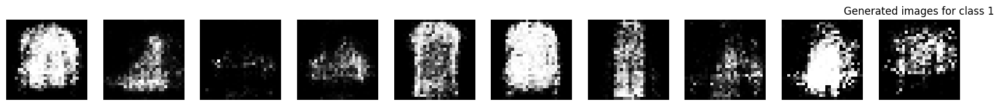

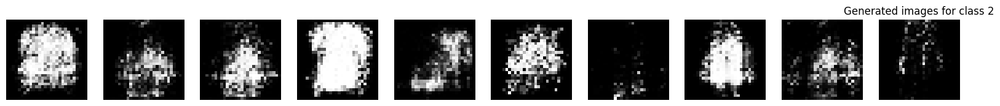

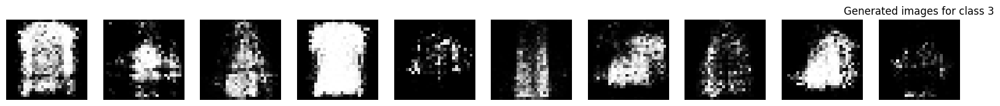

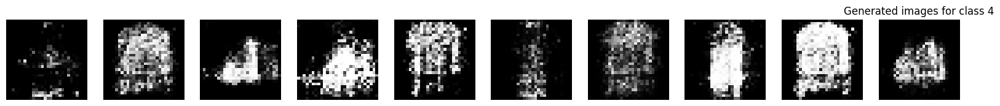

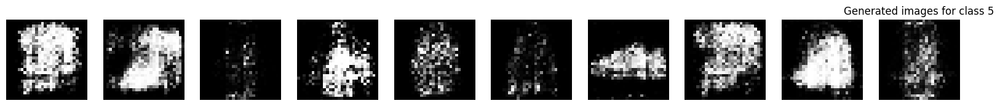

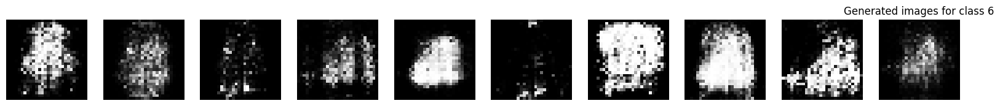

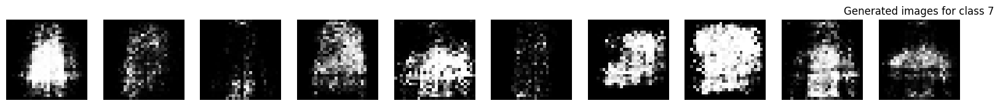

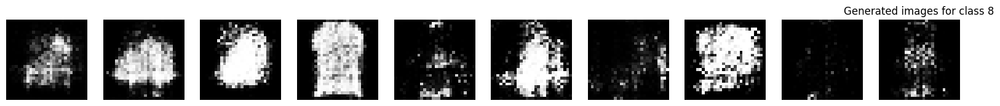

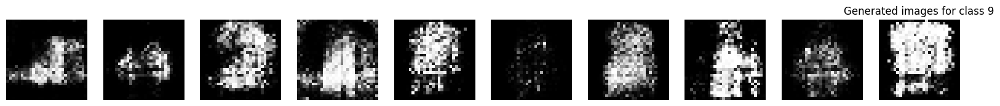

Epoch [16/50], Batch [100/938], D Loss: 0.4918, G Loss: 1.0152
Epoch [16/50], Batch [200/938], D Loss: 0.5345, G Loss: 1.0341
Epoch [16/50], Batch [300/938], D Loss: 0.5294, G Loss: 1.3361
Epoch [16/50], Batch [400/938], D Loss: 0.5089, G Loss: 1.5353
Epoch [16/50], Batch [500/938], D Loss: 0.5413, G Loss: 0.8797
Epoch [16/50], Batch [600/938], D Loss: 0.5215, G Loss: 1.2855
Epoch [16/50], Batch [700/938], D Loss: 0.4568, G Loss: 1.1695
Epoch [16/50], Batch [800/938], D Loss: 0.4442, G Loss: 0.9350
Epoch [16/50], Batch [900/938], D Loss: 0.5729, G Loss: 0.7114


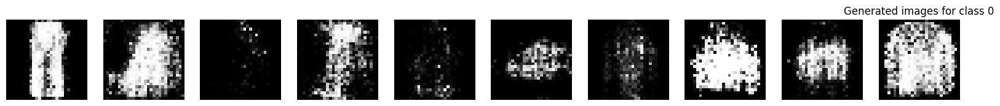

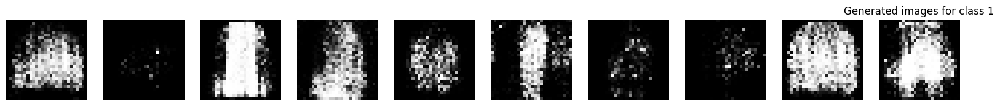

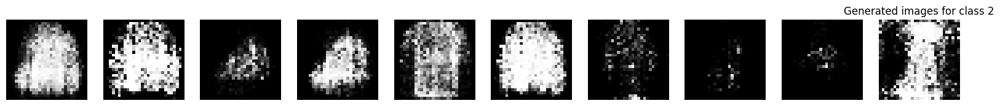

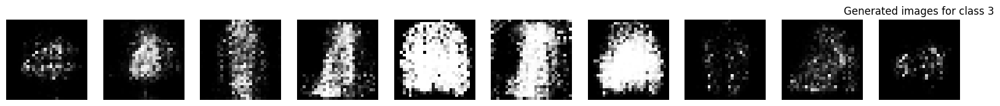

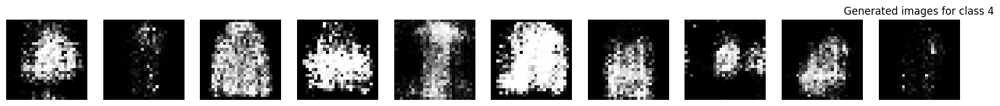

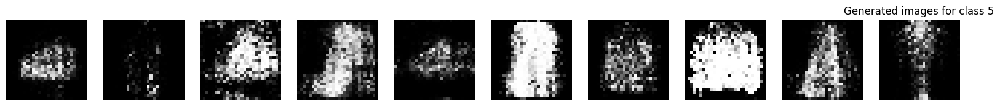

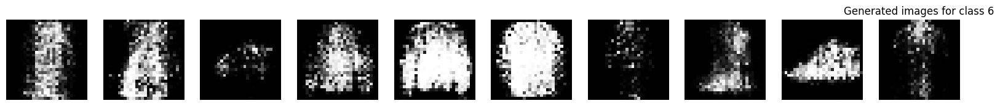

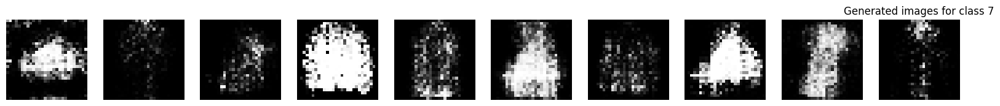

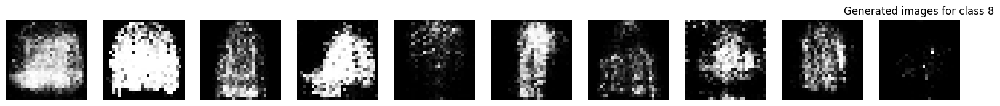

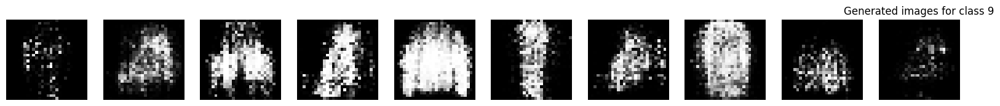

Epoch [17/50], Batch [100/938], D Loss: 0.4977, G Loss: 1.1830
Epoch [17/50], Batch [200/938], D Loss: 0.5082, G Loss: 0.9041
Epoch [17/50], Batch [300/938], D Loss: 0.4851, G Loss: 1.4361
Epoch [17/50], Batch [400/938], D Loss: 0.5862, G Loss: 0.7962
Epoch [17/50], Batch [500/938], D Loss: 0.5821, G Loss: 0.6477
Epoch [17/50], Batch [600/938], D Loss: 0.4991, G Loss: 0.8605
Epoch [17/50], Batch [700/938], D Loss: 0.6399, G Loss: 1.4298
Epoch [17/50], Batch [800/938], D Loss: 0.5481, G Loss: 1.3337
Epoch [17/50], Batch [900/938], D Loss: 0.5431, G Loss: 0.9028


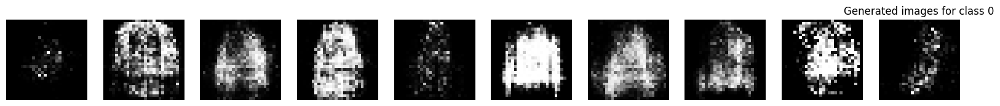

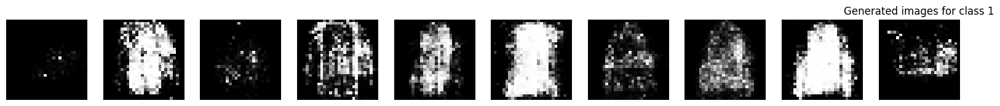

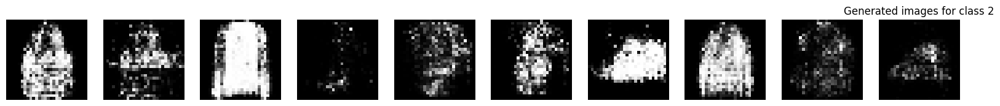

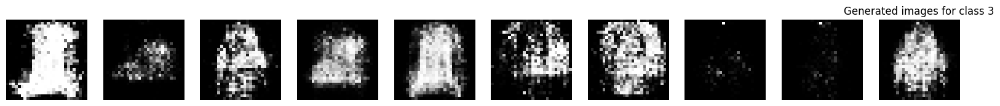

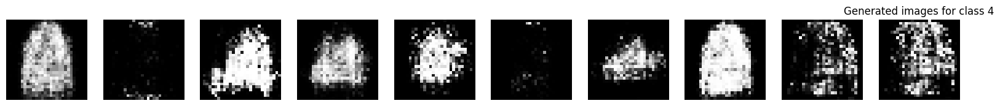

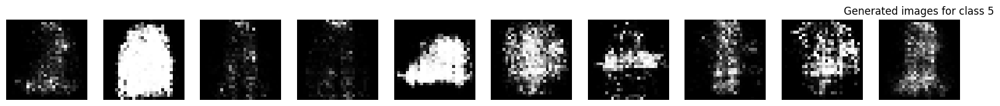

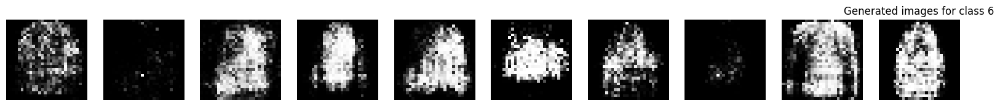

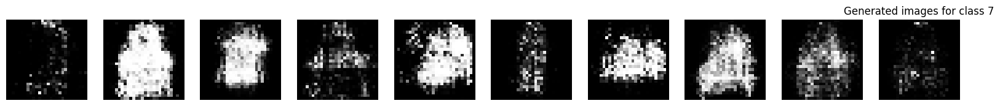

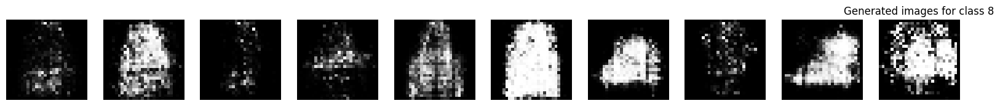

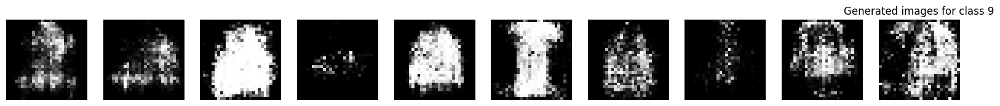

Epoch [18/50], Batch [100/938], D Loss: 0.4692, G Loss: 1.3422
Epoch [18/50], Batch [200/938], D Loss: 0.4618, G Loss: 1.2221
Epoch [18/50], Batch [300/938], D Loss: 0.4664, G Loss: 1.3226
Epoch [18/50], Batch [400/938], D Loss: 0.4999, G Loss: 1.1511
Epoch [18/50], Batch [500/938], D Loss: 0.5594, G Loss: 1.1748
Epoch [18/50], Batch [600/938], D Loss: 0.4914, G Loss: 0.9764
Epoch [18/50], Batch [700/938], D Loss: 0.6268, G Loss: 1.3770
Epoch [18/50], Batch [800/938], D Loss: 0.5434, G Loss: 0.9650
Epoch [18/50], Batch [900/938], D Loss: 0.5216, G Loss: 1.4027


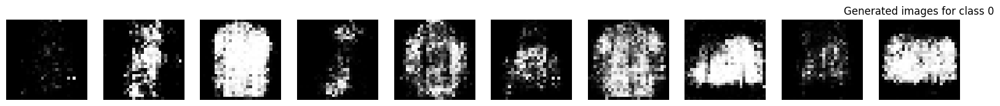

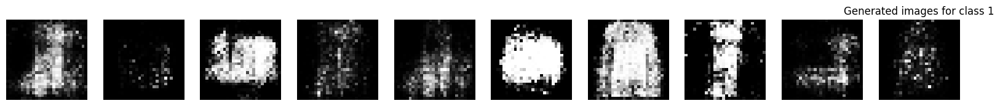

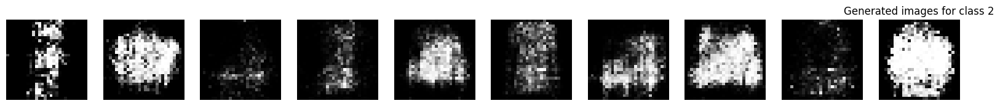

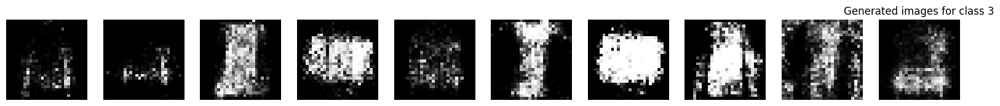

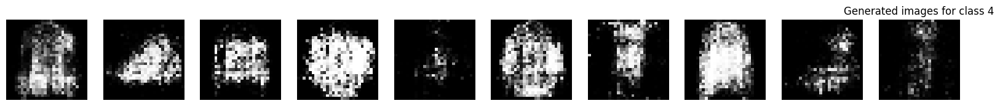

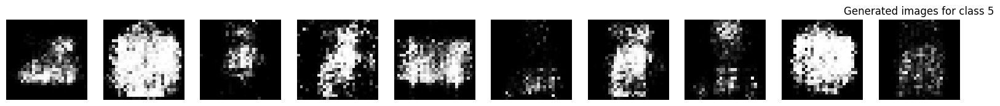

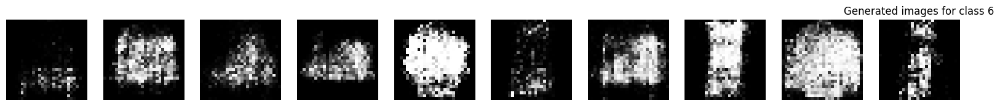

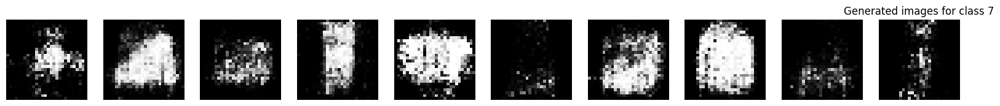

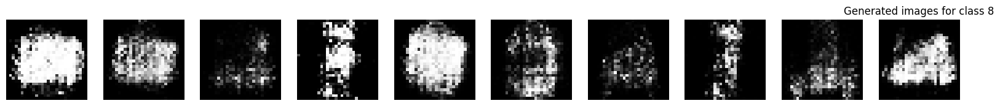

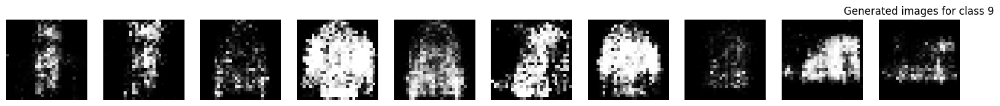

Epoch [19/50], Batch [100/938], D Loss: 0.5680, G Loss: 1.8051
Epoch [19/50], Batch [200/938], D Loss: 0.5275, G Loss: 1.2353
Epoch [19/50], Batch [300/938], D Loss: 0.5820, G Loss: 0.8080
Epoch [19/50], Batch [400/938], D Loss: 0.5132, G Loss: 1.7108
Epoch [19/50], Batch [500/938], D Loss: 0.5530, G Loss: 1.1956
Epoch [19/50], Batch [600/938], D Loss: 0.4468, G Loss: 1.4612
Epoch [19/50], Batch [700/938], D Loss: 0.5477, G Loss: 1.3821
Epoch [19/50], Batch [800/938], D Loss: 0.5693, G Loss: 1.0563
Epoch [19/50], Batch [900/938], D Loss: 0.4533, G Loss: 1.4434


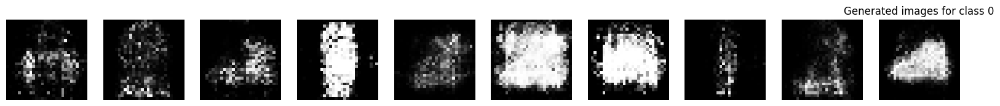

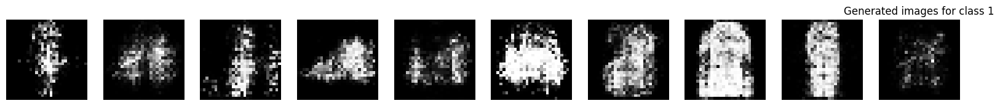

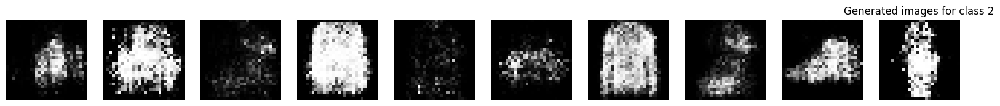

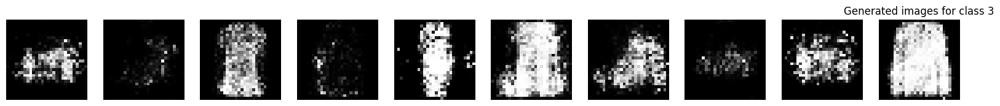

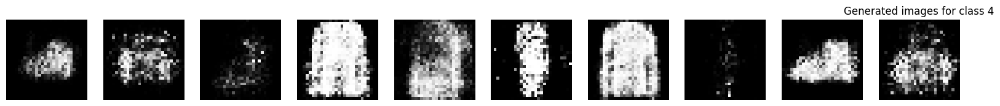

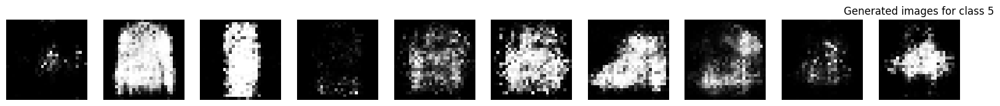

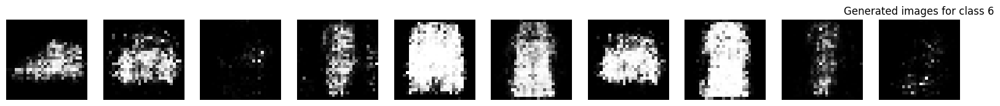

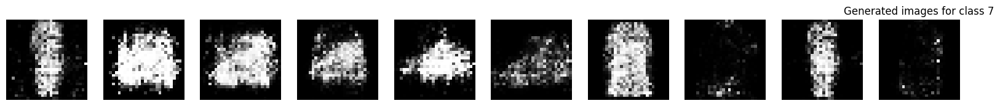

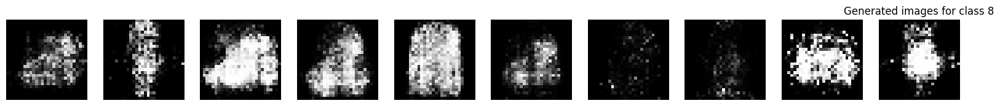

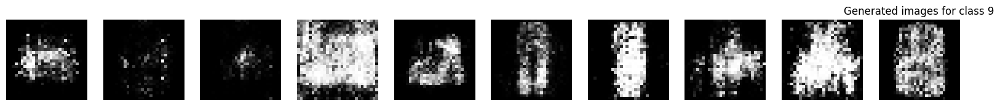

Epoch [20/50], Batch [100/938], D Loss: 0.4854, G Loss: 1.1613
Epoch [20/50], Batch [200/938], D Loss: 0.4416, G Loss: 1.3774
Epoch [20/50], Batch [300/938], D Loss: 0.3859, G Loss: 1.2987
Epoch [20/50], Batch [400/938], D Loss: 0.5413, G Loss: 1.1655
Epoch [20/50], Batch [500/938], D Loss: 0.5436, G Loss: 0.7509
Epoch [20/50], Batch [600/938], D Loss: 0.4769, G Loss: 1.3294
Epoch [20/50], Batch [700/938], D Loss: 0.5371, G Loss: 1.0610
Epoch [20/50], Batch [800/938], D Loss: 0.5225, G Loss: 0.9438
Epoch [20/50], Batch [900/938], D Loss: 0.5638, G Loss: 0.9044


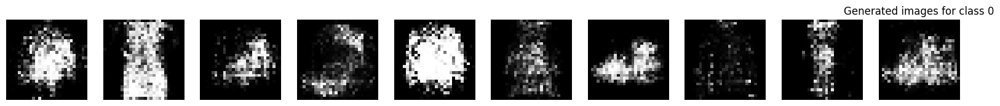

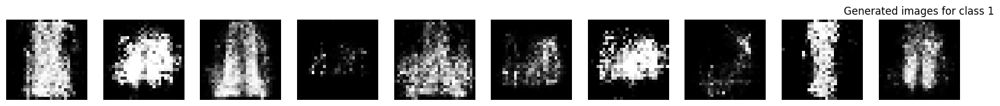

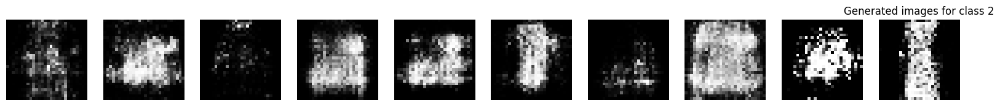

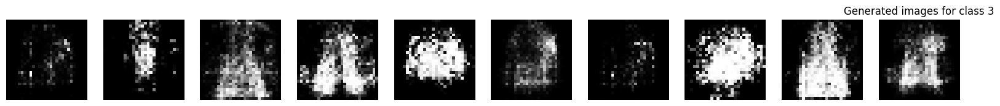

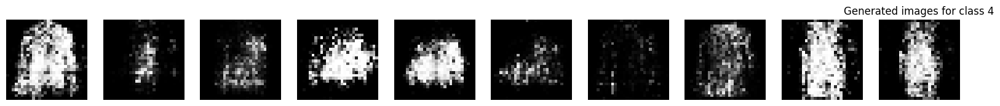

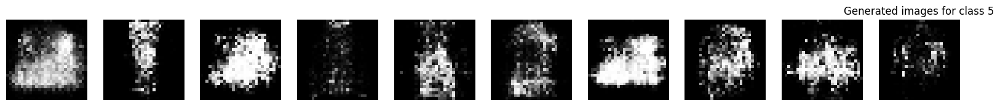

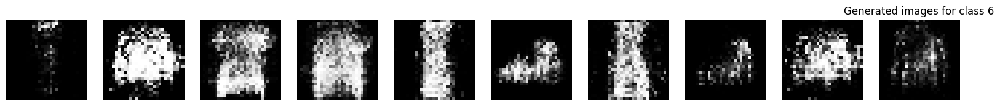

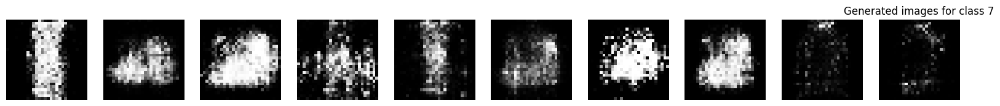

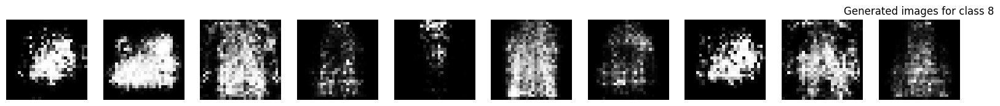

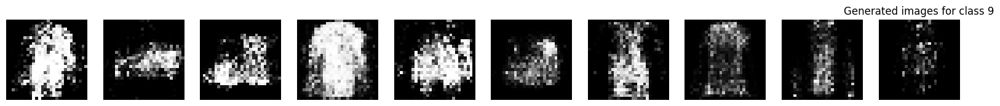

Epoch [21/50], Batch [100/938], D Loss: 0.5598, G Loss: 1.2588
Epoch [21/50], Batch [200/938], D Loss: 0.4788, G Loss: 1.3000
Epoch [21/50], Batch [300/938], D Loss: 0.6559, G Loss: 1.5666
Epoch [21/50], Batch [400/938], D Loss: 0.5056, G Loss: 1.4319
Epoch [21/50], Batch [500/938], D Loss: 0.4809, G Loss: 1.1408
Epoch [21/50], Batch [600/938], D Loss: 0.7088, G Loss: 0.4232
Epoch [21/50], Batch [700/938], D Loss: 0.5839, G Loss: 0.7328
Epoch [21/50], Batch [800/938], D Loss: 0.5237, G Loss: 1.1724
Epoch [21/50], Batch [900/938], D Loss: 0.5490, G Loss: 1.0195


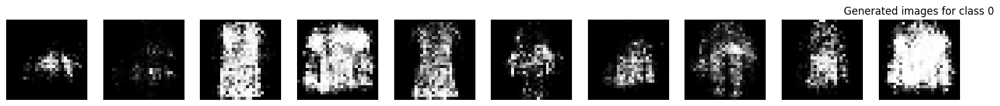

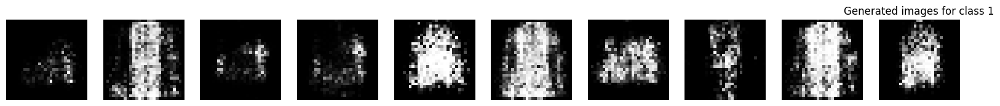

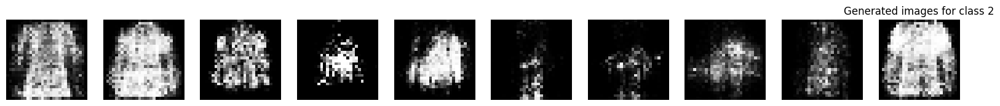

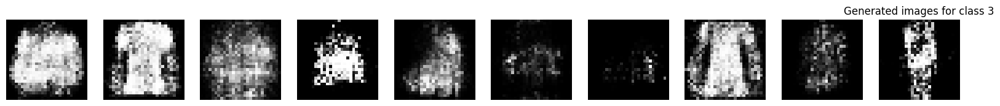

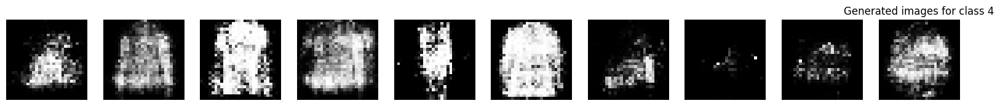

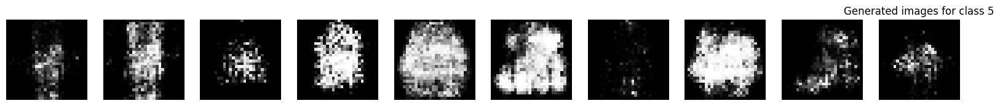

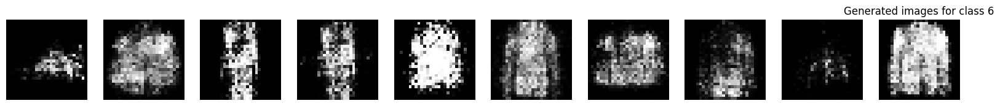

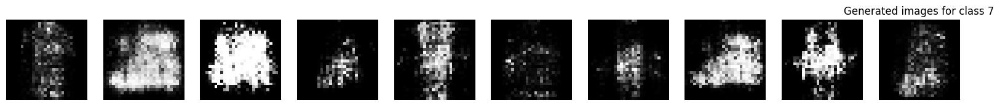

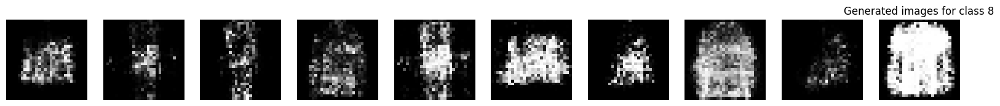

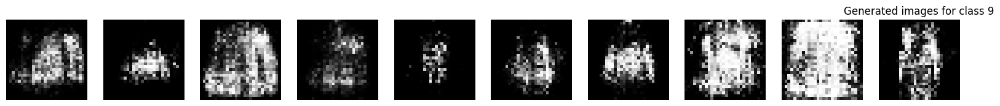

Epoch [22/50], Batch [100/938], D Loss: 0.5137, G Loss: 1.3525
Epoch [22/50], Batch [200/938], D Loss: 0.4905, G Loss: 1.1398
Epoch [22/50], Batch [300/938], D Loss: 0.5770, G Loss: 0.7458
Epoch [22/50], Batch [400/938], D Loss: 0.5545, G Loss: 1.2723
Epoch [22/50], Batch [500/938], D Loss: 0.6321, G Loss: 0.7148
Epoch [22/50], Batch [600/938], D Loss: 0.5766, G Loss: 0.7387
Epoch [22/50], Batch [700/938], D Loss: 0.5963, G Loss: 1.1329
Epoch [22/50], Batch [800/938], D Loss: 0.4908, G Loss: 1.4632
Epoch [22/50], Batch [900/938], D Loss: 0.5589, G Loss: 1.2950


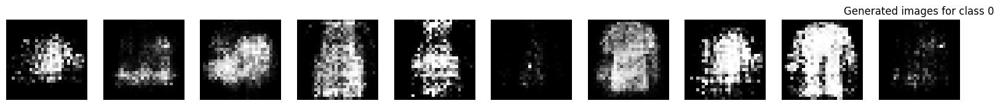

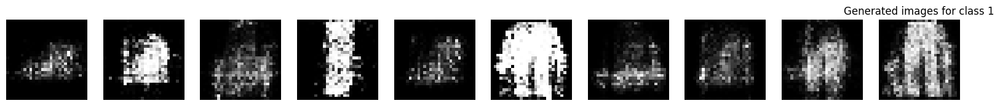

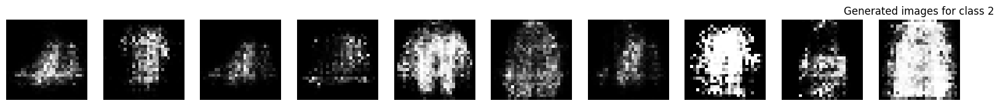

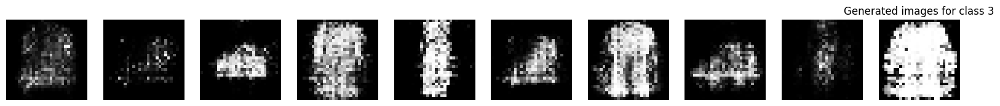

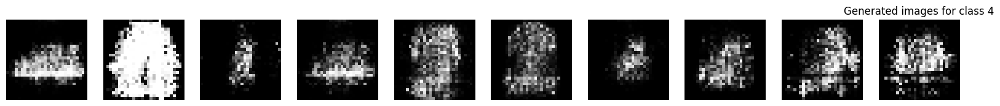

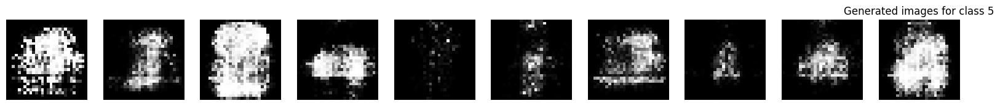

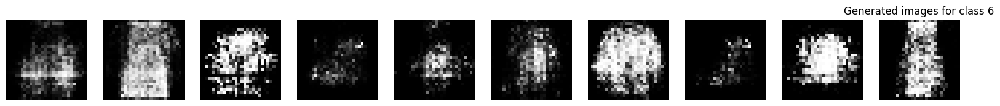

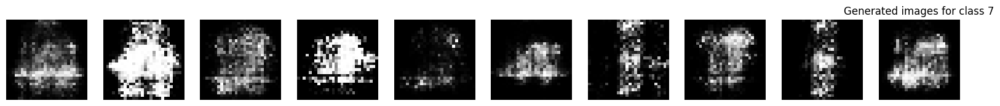

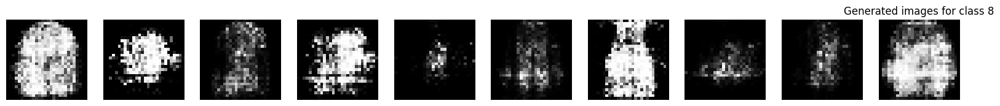

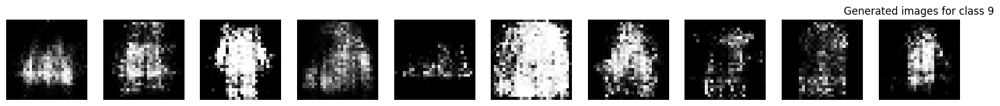

Epoch [23/50], Batch [100/938], D Loss: 0.5259, G Loss: 0.8682
Epoch [23/50], Batch [200/938], D Loss: 0.5700, G Loss: 0.9107
Epoch [23/50], Batch [300/938], D Loss: 0.5816, G Loss: 0.8305
Epoch [23/50], Batch [400/938], D Loss: 0.6086, G Loss: 1.6197
Epoch [23/50], Batch [500/938], D Loss: 0.5933, G Loss: 0.8008
Epoch [23/50], Batch [600/938], D Loss: 0.5299, G Loss: 1.1734
Epoch [23/50], Batch [700/938], D Loss: 0.6119, G Loss: 1.3298
Epoch [23/50], Batch [800/938], D Loss: 0.7384, G Loss: 0.5890
Epoch [23/50], Batch [900/938], D Loss: 0.5494, G Loss: 0.9316


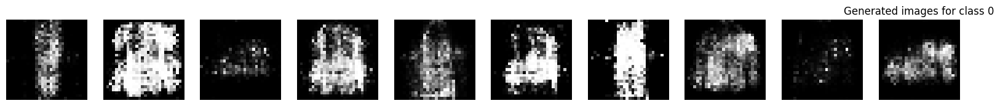

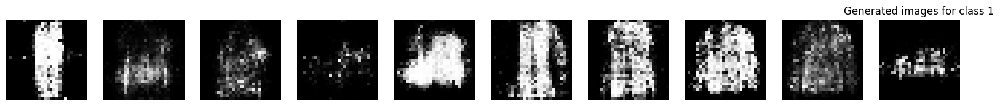

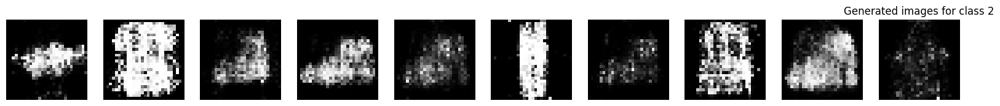

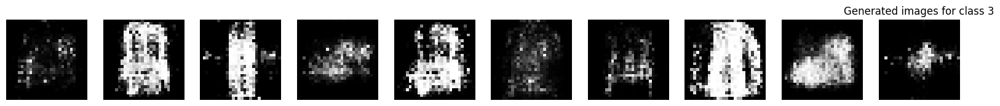

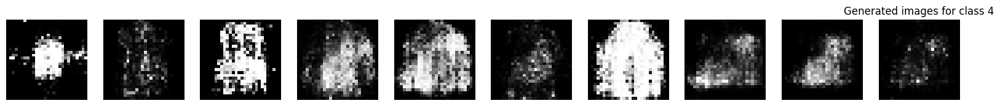

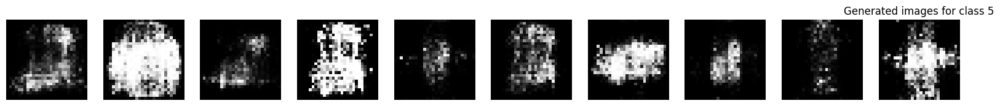

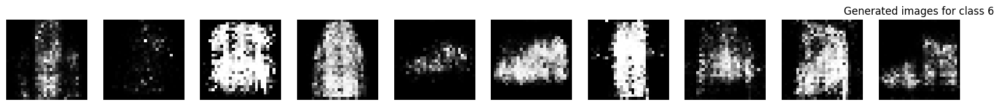

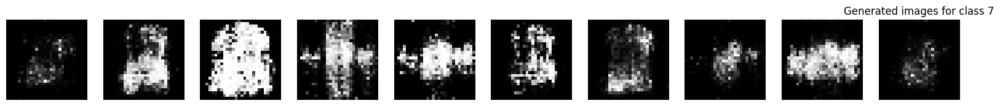

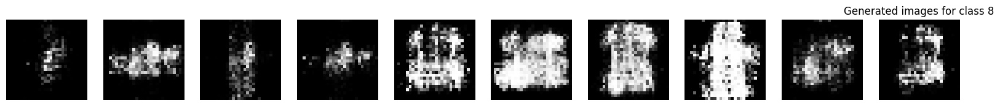

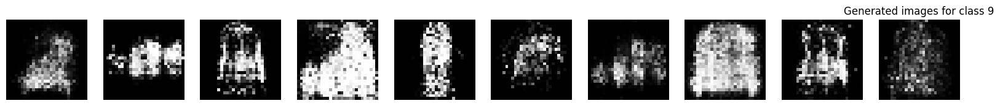

Epoch [24/50], Batch [100/938], D Loss: 0.5881, G Loss: 0.9766
Epoch [24/50], Batch [200/938], D Loss: 0.5476, G Loss: 0.9608
Epoch [24/50], Batch [300/938], D Loss: 0.5144, G Loss: 1.0724
Epoch [24/50], Batch [400/938], D Loss: 0.5711, G Loss: 1.2910
Epoch [24/50], Batch [500/938], D Loss: 0.5663, G Loss: 0.9401
Epoch [24/50], Batch [600/938], D Loss: 0.4882, G Loss: 1.2255
Epoch [24/50], Batch [700/938], D Loss: 0.5890, G Loss: 0.9912
Epoch [24/50], Batch [800/938], D Loss: 0.5449, G Loss: 1.6893
Epoch [24/50], Batch [900/938], D Loss: 0.5339, G Loss: 1.0352


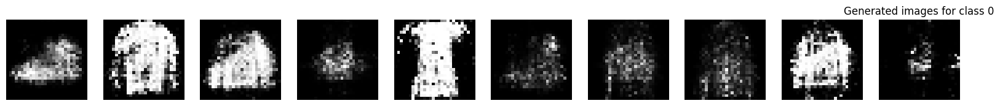

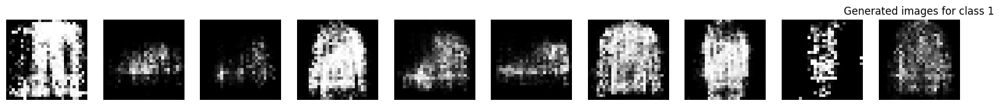

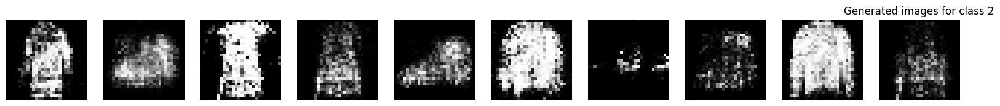

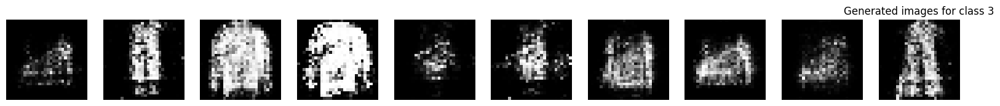

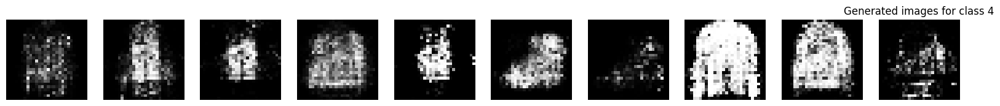

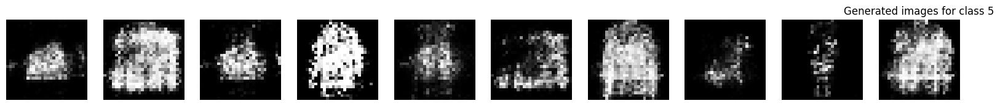

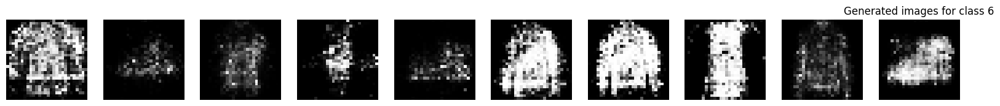

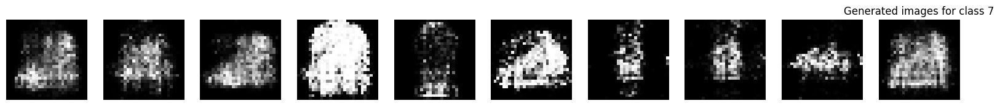

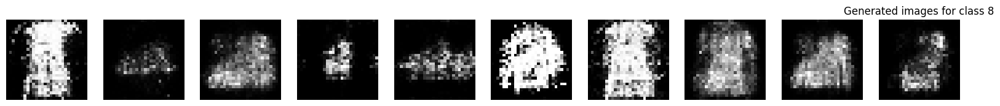

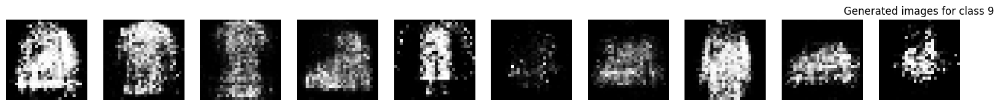

Epoch [25/50], Batch [100/938], D Loss: 0.5388, G Loss: 0.8438
Epoch [25/50], Batch [200/938], D Loss: 0.4963, G Loss: 1.0614
Epoch [25/50], Batch [300/938], D Loss: 0.5607, G Loss: 0.8188
Epoch [25/50], Batch [400/938], D Loss: 0.5455, G Loss: 0.8936
Epoch [25/50], Batch [500/938], D Loss: 0.5899, G Loss: 0.6951
Epoch [25/50], Batch [600/938], D Loss: 0.6053, G Loss: 0.9103
Epoch [25/50], Batch [700/938], D Loss: 0.5249, G Loss: 1.1738
Epoch [25/50], Batch [800/938], D Loss: 0.5744, G Loss: 1.0188
Epoch [25/50], Batch [900/938], D Loss: 0.5196, G Loss: 1.2231


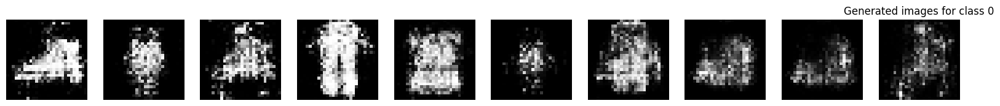

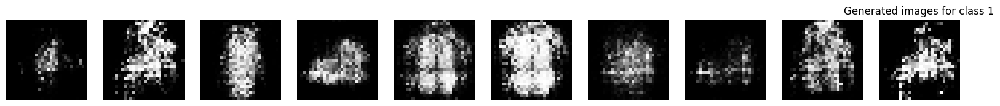

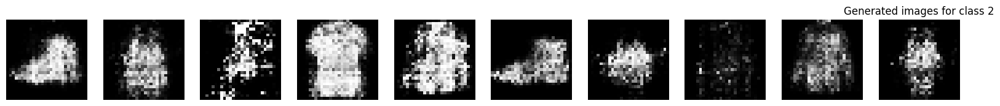

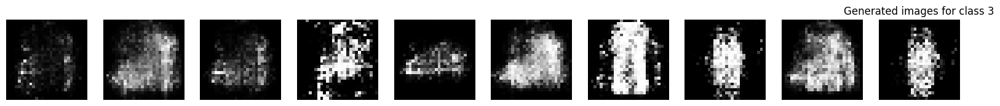

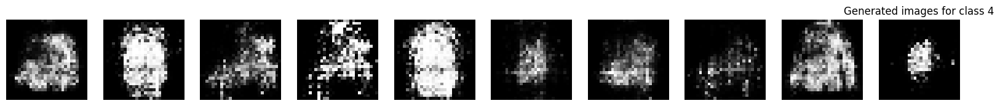

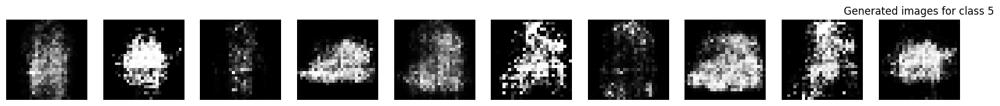

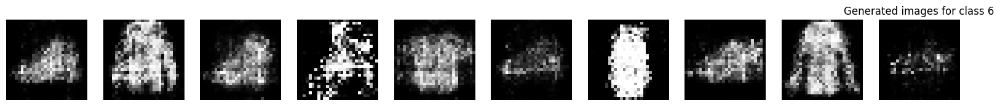

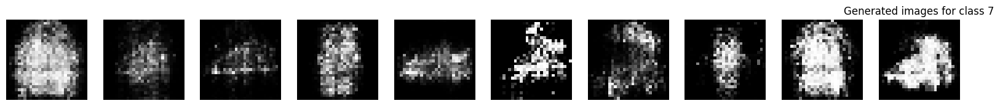

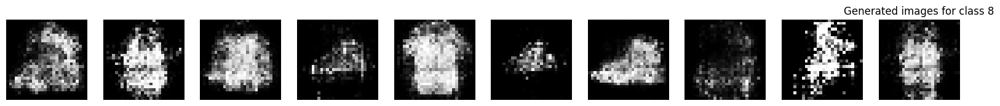

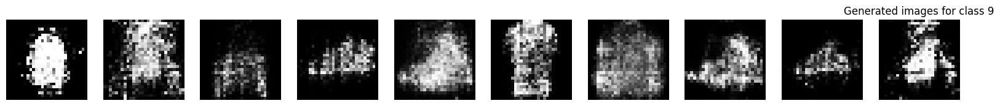

Epoch [26/50], Batch [100/938], D Loss: 0.4766, G Loss: 0.9705
Epoch [26/50], Batch [200/938], D Loss: 0.5381, G Loss: 1.2961
Epoch [26/50], Batch [300/938], D Loss: 0.5159, G Loss: 1.1602
Epoch [26/50], Batch [400/938], D Loss: 0.5988, G Loss: 0.9158
Epoch [26/50], Batch [500/938], D Loss: 0.6135, G Loss: 0.6929
Epoch [26/50], Batch [600/938], D Loss: 0.5219, G Loss: 1.3819
Epoch [26/50], Batch [700/938], D Loss: 0.5763, G Loss: 0.9726
Epoch [26/50], Batch [800/938], D Loss: 0.5192, G Loss: 1.1045
Epoch [26/50], Batch [900/938], D Loss: 0.5523, G Loss: 1.0191


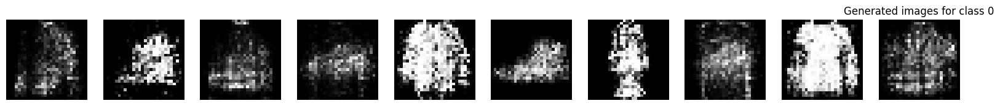

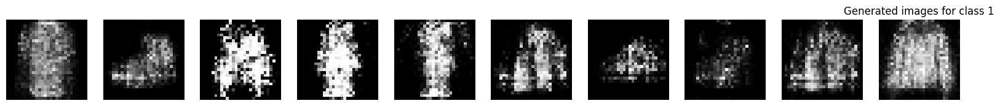

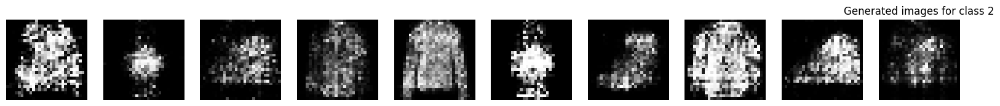

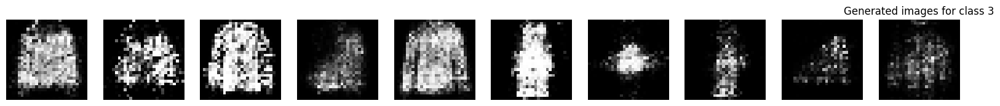

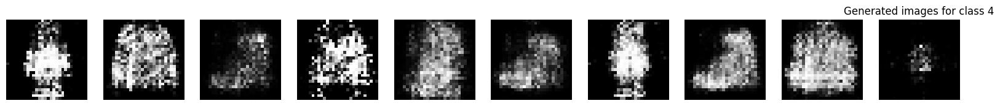

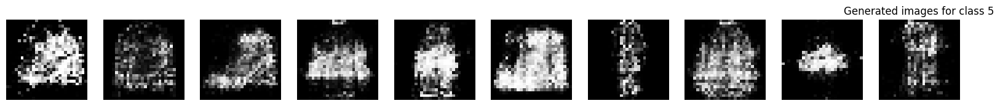

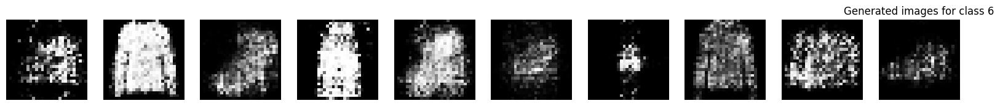

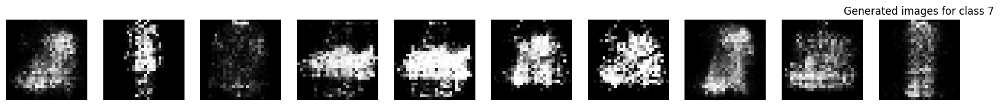

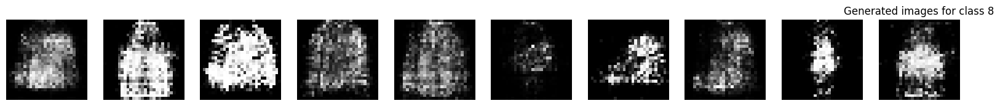

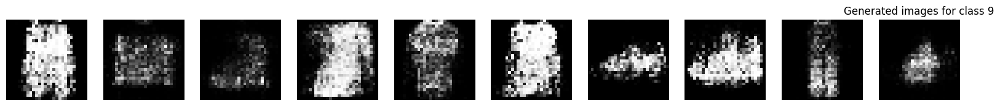

Epoch [27/50], Batch [100/938], D Loss: 0.7019, G Loss: 1.4015
Epoch [27/50], Batch [200/938], D Loss: 0.6449, G Loss: 1.2559
Epoch [27/50], Batch [300/938], D Loss: 0.6848, G Loss: 0.5246
Epoch [27/50], Batch [400/938], D Loss: 0.6254, G Loss: 1.1736
Epoch [27/50], Batch [500/938], D Loss: 0.5791, G Loss: 0.8656
Epoch [27/50], Batch [600/938], D Loss: 0.6084, G Loss: 1.5081
Epoch [27/50], Batch [700/938], D Loss: 0.5640, G Loss: 1.0101
Epoch [27/50], Batch [800/938], D Loss: 0.5613, G Loss: 0.7373
Epoch [27/50], Batch [900/938], D Loss: 0.5589, G Loss: 1.1787


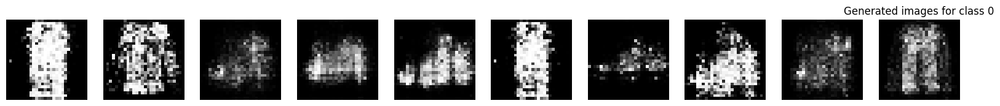

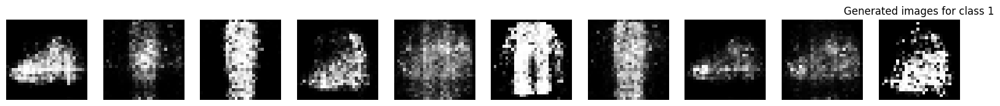

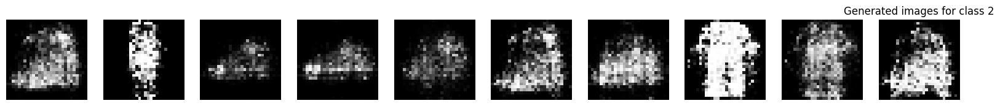

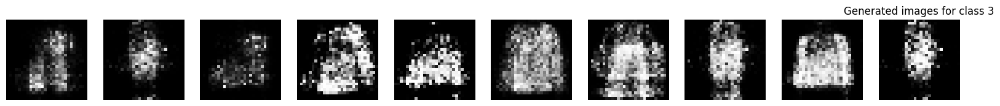

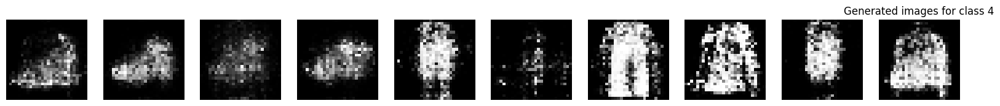

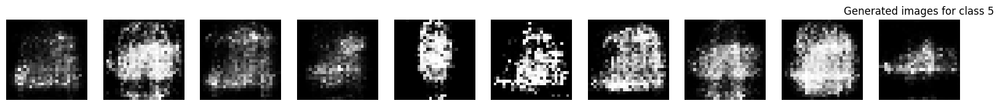

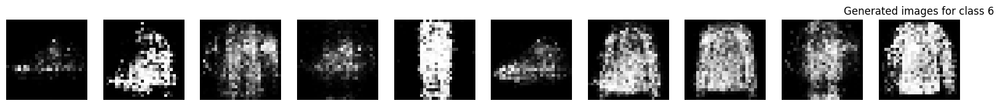

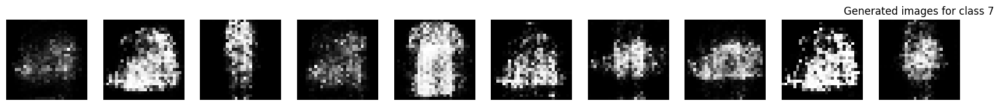

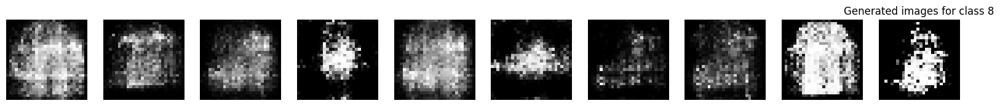

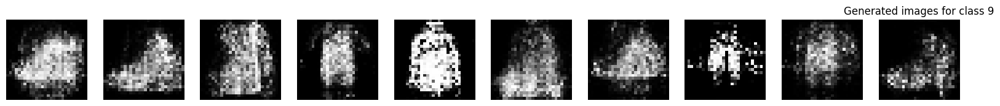

Epoch [28/50], Batch [100/938], D Loss: 0.5983, G Loss: 1.2690
Epoch [28/50], Batch [200/938], D Loss: 0.5561, G Loss: 1.4626
Epoch [28/50], Batch [300/938], D Loss: 0.6129, G Loss: 0.8600
Epoch [28/50], Batch [400/938], D Loss: 0.5352, G Loss: 0.9383
Epoch [28/50], Batch [500/938], D Loss: 0.6301, G Loss: 1.3647
Epoch [28/50], Batch [600/938], D Loss: 0.5444, G Loss: 0.8413
Epoch [28/50], Batch [700/938], D Loss: 0.5773, G Loss: 1.1022
Epoch [28/50], Batch [800/938], D Loss: 0.6080, G Loss: 0.9525
Epoch [28/50], Batch [900/938], D Loss: 0.5451, G Loss: 0.8790


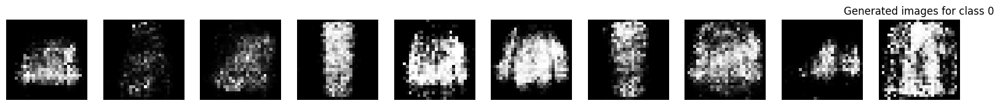

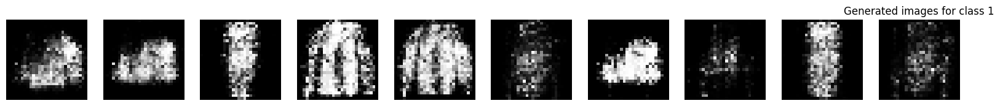

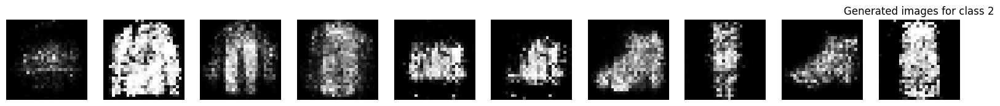

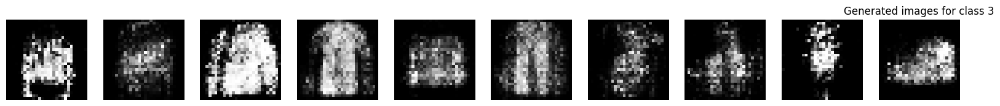

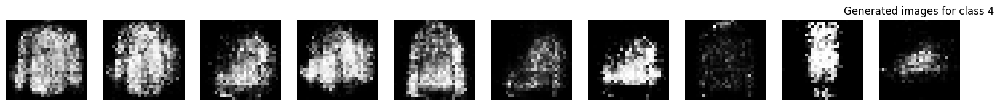

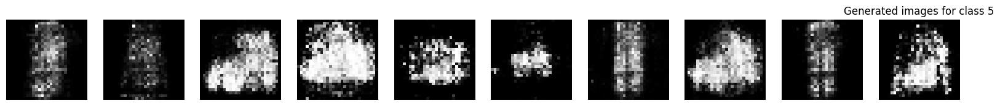

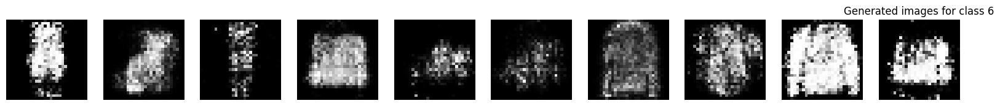

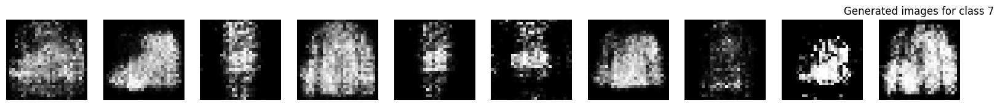

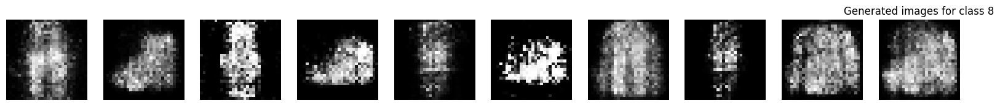

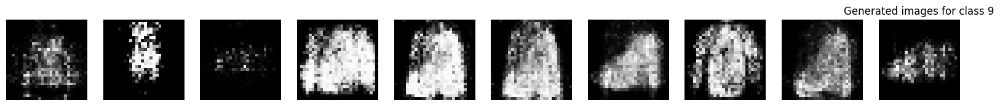

Epoch [29/50], Batch [100/938], D Loss: 0.5186, G Loss: 0.9717
Epoch [29/50], Batch [200/938], D Loss: 0.5238, G Loss: 0.9553
Epoch [29/50], Batch [300/938], D Loss: 0.5565, G Loss: 1.0033
Epoch [29/50], Batch [400/938], D Loss: 0.5835, G Loss: 0.8487
Epoch [29/50], Batch [500/938], D Loss: 0.6257, G Loss: 0.7739
Epoch [29/50], Batch [600/938], D Loss: 0.5799, G Loss: 0.8409
Epoch [29/50], Batch [700/938], D Loss: 0.6346, G Loss: 0.7590
Epoch [29/50], Batch [800/938], D Loss: 0.6204, G Loss: 0.6939
Epoch [29/50], Batch [900/938], D Loss: 0.5765, G Loss: 0.8348


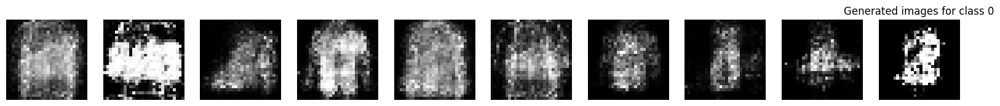

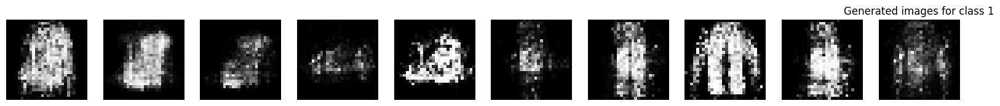

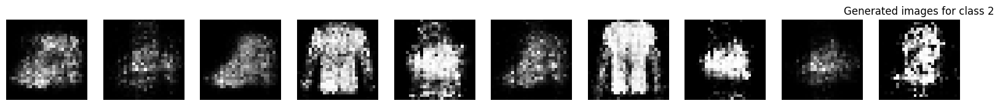

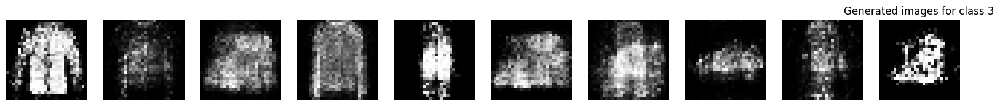

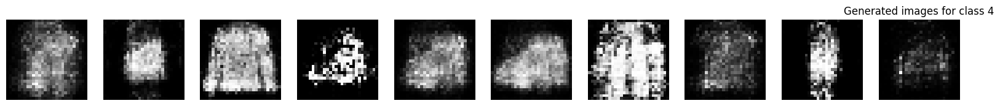

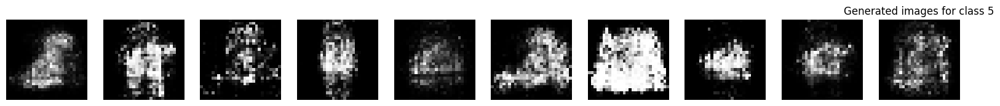

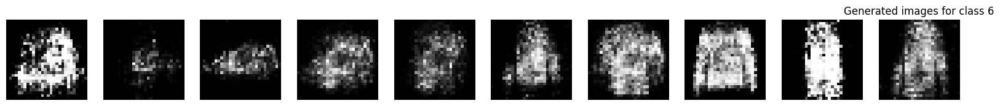

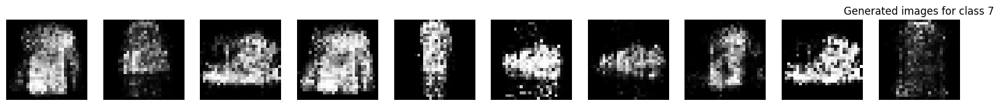

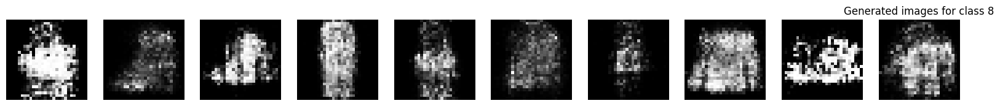

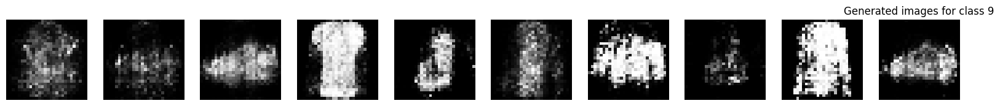

Epoch [30/50], Batch [100/938], D Loss: 0.6416, G Loss: 0.7831
Epoch [30/50], Batch [200/938], D Loss: 0.5644, G Loss: 1.0993
Epoch [30/50], Batch [300/938], D Loss: 0.6377, G Loss: 1.1930
Epoch [30/50], Batch [400/938], D Loss: 0.7336, G Loss: 0.8939
Epoch [30/50], Batch [500/938], D Loss: 0.6203, G Loss: 1.1395
Epoch [30/50], Batch [600/938], D Loss: 0.6879, G Loss: 0.9991
Epoch [30/50], Batch [700/938], D Loss: 0.5429, G Loss: 1.0886
Epoch [30/50], Batch [800/938], D Loss: 0.6094, G Loss: 0.9428
Epoch [30/50], Batch [900/938], D Loss: 0.5773, G Loss: 1.2074


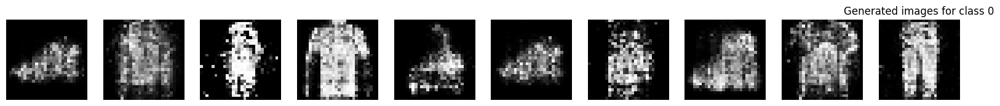

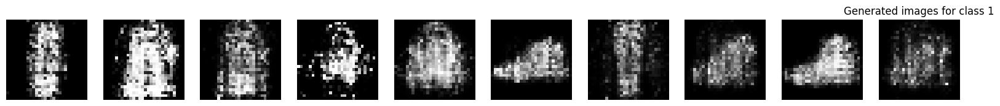

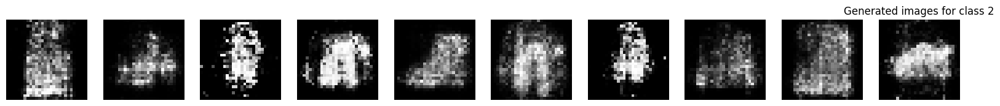

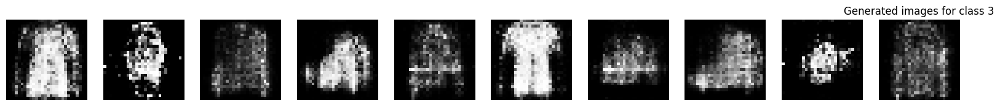

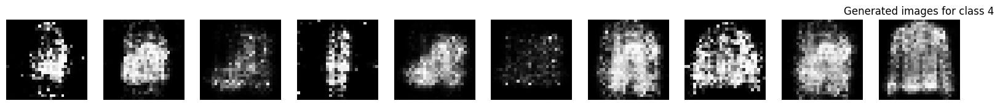

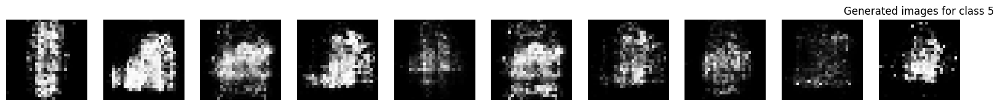

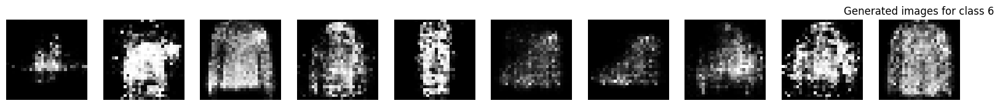

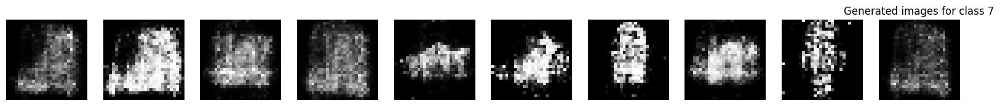

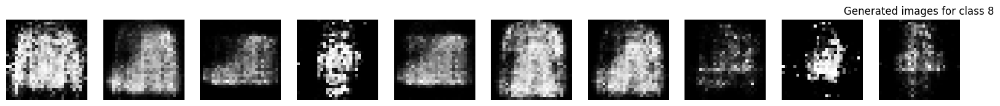

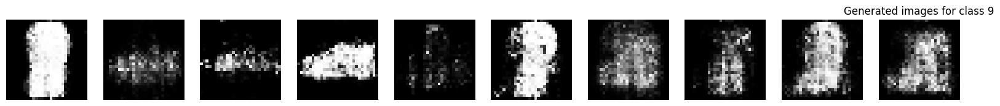

Epoch [31/50], Batch [100/938], D Loss: 0.7354, G Loss: 0.9468
Epoch [31/50], Batch [200/938], D Loss: 0.6114, G Loss: 1.0647
Epoch [31/50], Batch [300/938], D Loss: 0.5819, G Loss: 1.0958
Epoch [31/50], Batch [400/938], D Loss: 0.6446, G Loss: 1.1390
Epoch [31/50], Batch [500/938], D Loss: 0.6496, G Loss: 0.7284
Epoch [31/50], Batch [600/938], D Loss: 0.6655, G Loss: 0.9077
Epoch [31/50], Batch [700/938], D Loss: 0.5609, G Loss: 0.8478
Epoch [31/50], Batch [800/938], D Loss: 0.6827, G Loss: 1.1802
Epoch [31/50], Batch [900/938], D Loss: 0.6744, G Loss: 1.2069


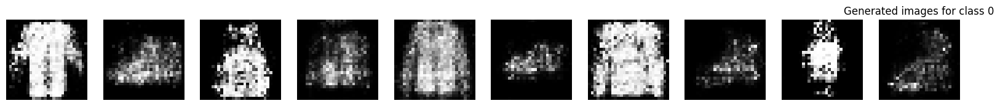

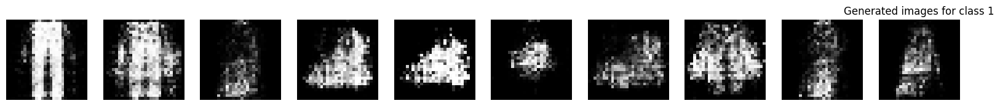

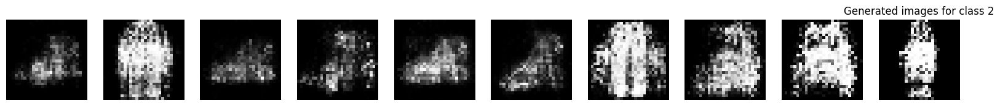

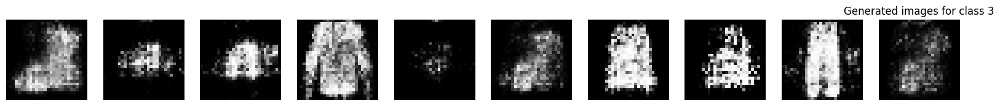

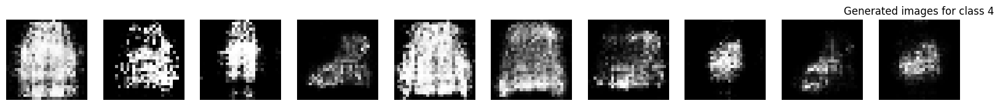

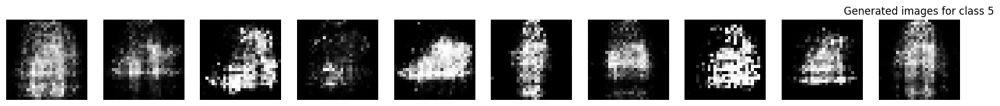

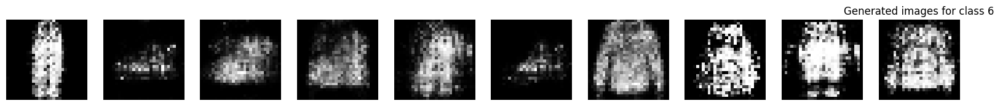

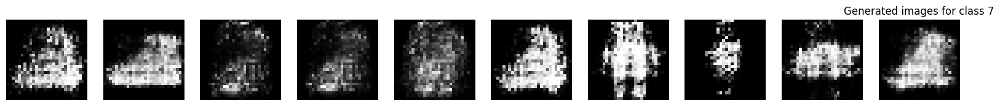

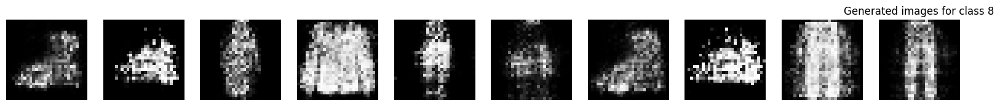

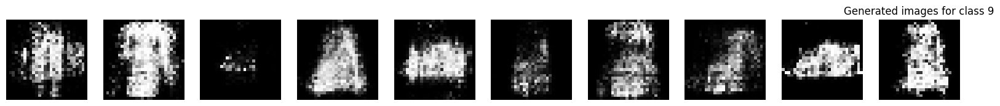

Epoch [32/50], Batch [100/938], D Loss: 0.5951, G Loss: 0.8591
Epoch [32/50], Batch [200/938], D Loss: 0.6006, G Loss: 0.9111
Epoch [32/50], Batch [300/938], D Loss: 0.5886, G Loss: 0.7585
Epoch [32/50], Batch [400/938], D Loss: 0.6696, G Loss: 0.7175
Epoch [32/50], Batch [500/938], D Loss: 0.5869, G Loss: 0.8801
Epoch [32/50], Batch [600/938], D Loss: 0.6933, G Loss: 0.6988
Epoch [32/50], Batch [700/938], D Loss: 0.5817, G Loss: 0.8279
Epoch [32/50], Batch [800/938], D Loss: 0.5977, G Loss: 0.9939
Epoch [32/50], Batch [900/938], D Loss: 0.6757, G Loss: 0.8781


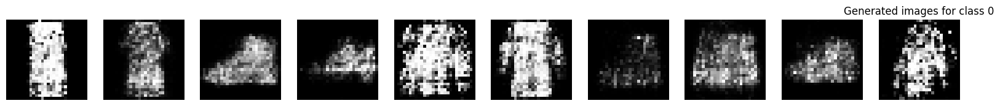

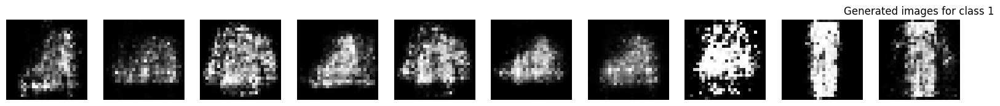

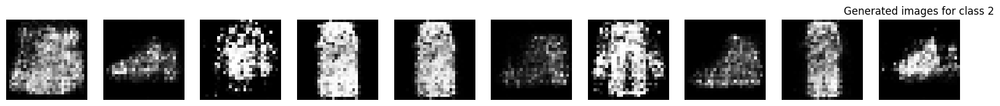

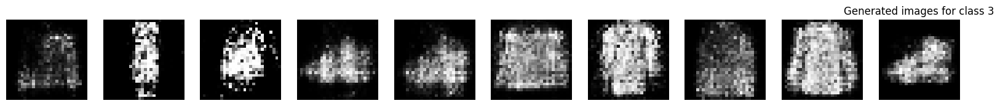

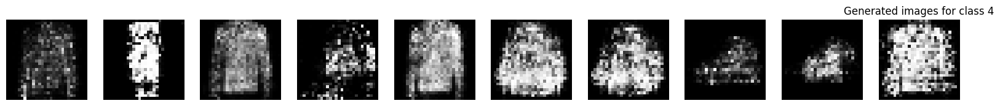

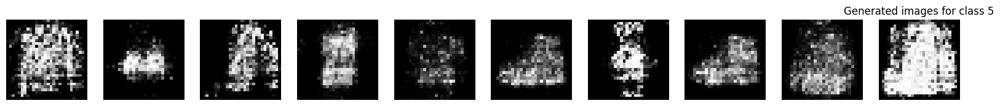

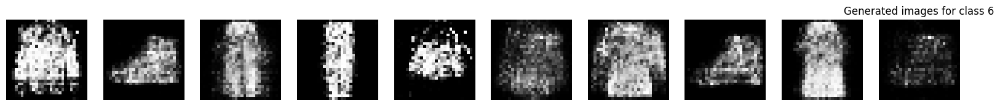

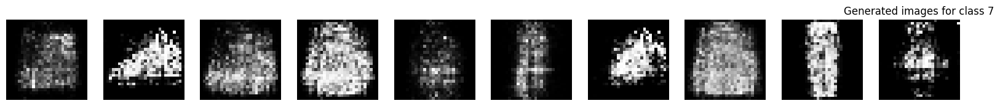

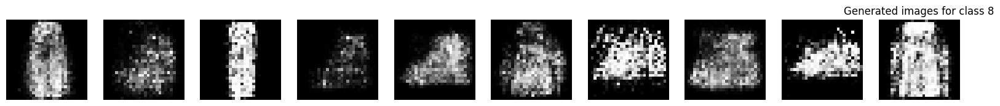

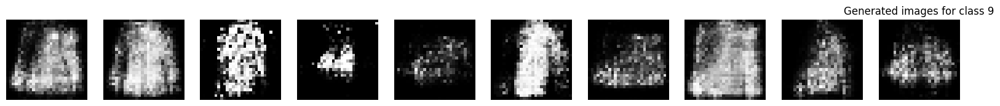

Epoch [33/50], Batch [100/938], D Loss: 0.6548, G Loss: 0.7949
Epoch [33/50], Batch [200/938], D Loss: 0.5836, G Loss: 0.8378
Epoch [33/50], Batch [300/938], D Loss: 0.6169, G Loss: 0.6982
Epoch [33/50], Batch [400/938], D Loss: 0.6137, G Loss: 0.7355
Epoch [33/50], Batch [500/938], D Loss: 0.5940, G Loss: 0.8297
Epoch [33/50], Batch [600/938], D Loss: 0.6309, G Loss: 0.8375
Epoch [33/50], Batch [700/938], D Loss: 0.6417, G Loss: 0.8295
Epoch [33/50], Batch [800/938], D Loss: 0.5834, G Loss: 1.1394
Epoch [33/50], Batch [900/938], D Loss: 0.5971, G Loss: 0.9646


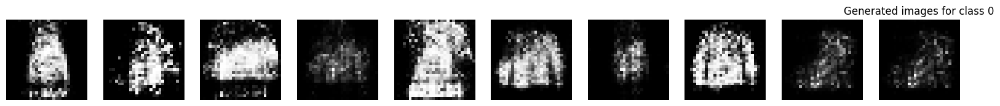

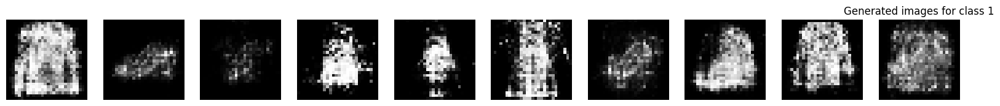

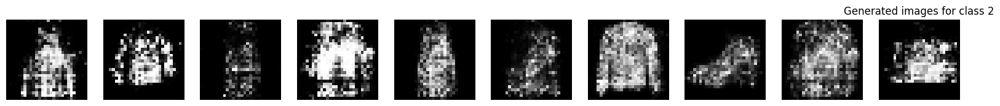

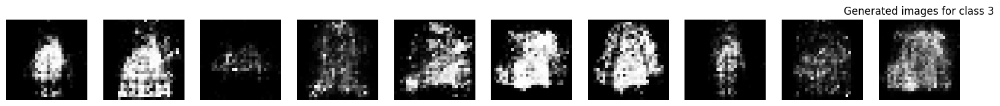

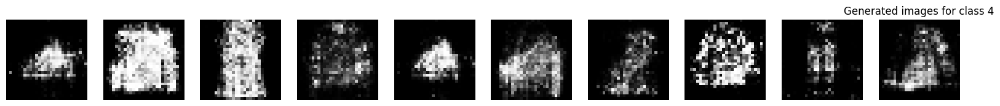

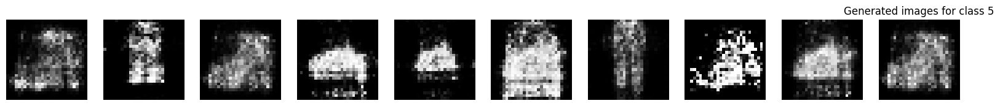

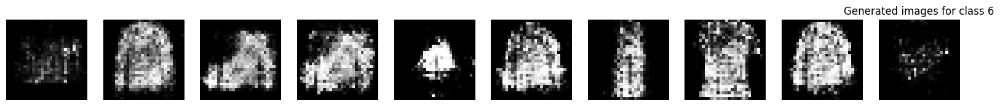

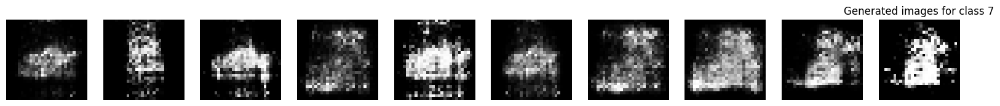

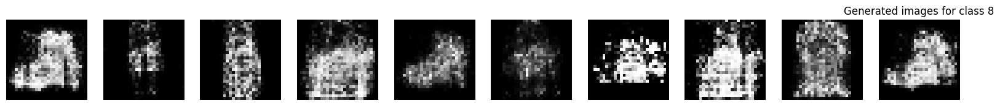

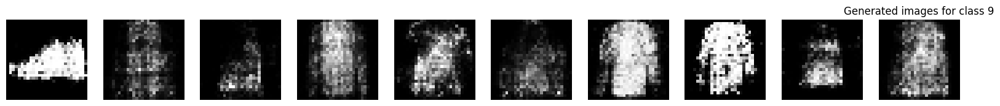

Epoch [34/50], Batch [100/938], D Loss: 0.5972, G Loss: 0.9278
Epoch [34/50], Batch [200/938], D Loss: 0.6002, G Loss: 0.9112
Epoch [34/50], Batch [300/938], D Loss: 0.6183, G Loss: 0.8402
Epoch [34/50], Batch [400/938], D Loss: 0.6154, G Loss: 0.7709
Epoch [34/50], Batch [500/938], D Loss: 0.6264, G Loss: 0.9338
Epoch [34/50], Batch [600/938], D Loss: 0.6625, G Loss: 0.7298
Epoch [34/50], Batch [700/938], D Loss: 0.6007, G Loss: 0.9534
Epoch [34/50], Batch [800/938], D Loss: 0.6061, G Loss: 0.8503
Epoch [34/50], Batch [900/938], D Loss: 0.6538, G Loss: 0.9020


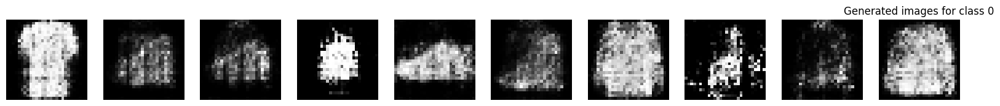

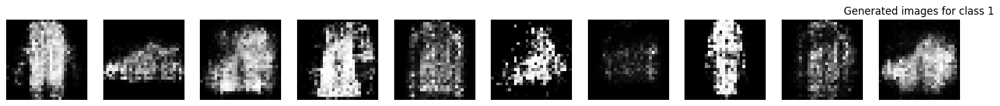

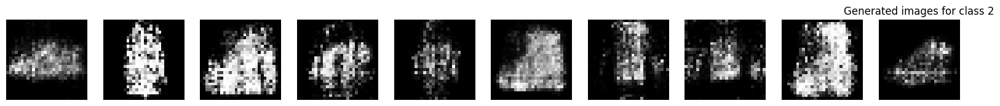

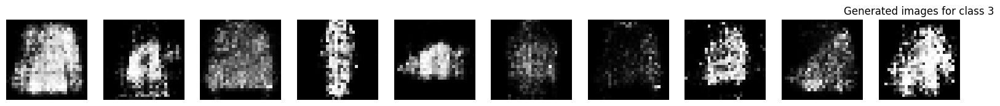

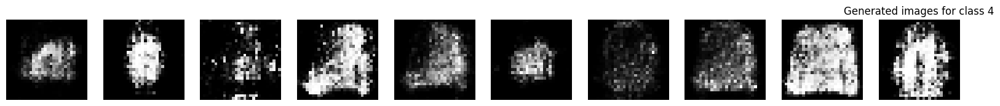

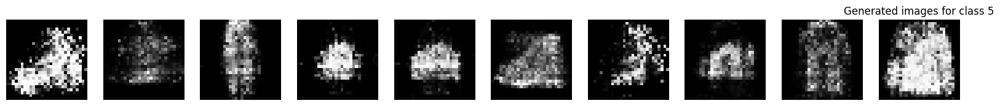

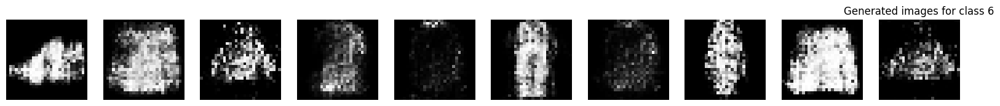

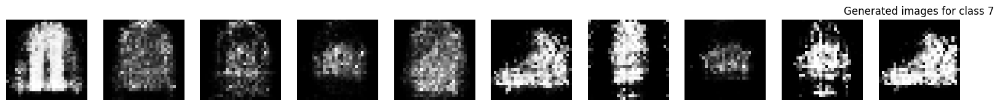

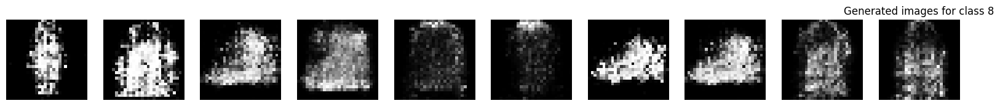

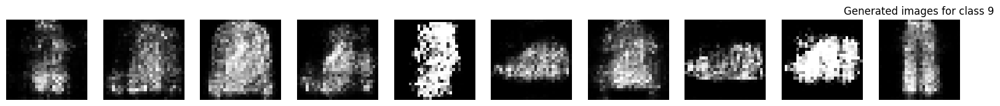

Epoch [35/50], Batch [100/938], D Loss: 0.7032, G Loss: 0.6375
Epoch [35/50], Batch [200/938], D Loss: 0.6515, G Loss: 0.8387
Epoch [35/50], Batch [300/938], D Loss: 0.6383, G Loss: 0.9164
Epoch [35/50], Batch [400/938], D Loss: 0.5945, G Loss: 1.2619
Epoch [35/50], Batch [500/938], D Loss: 0.6087, G Loss: 0.9462
Epoch [35/50], Batch [600/938], D Loss: 0.6578, G Loss: 0.7709
Epoch [35/50], Batch [700/938], D Loss: 0.6066, G Loss: 0.8069
Epoch [35/50], Batch [800/938], D Loss: 0.6451, G Loss: 0.9667
Epoch [35/50], Batch [900/938], D Loss: 0.6797, G Loss: 0.9183


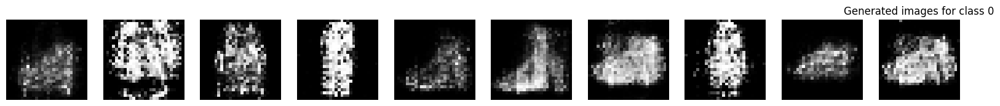

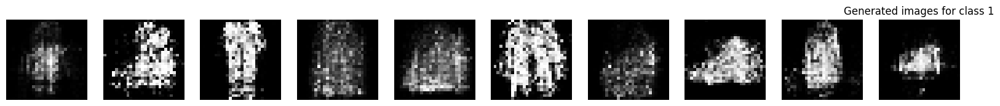

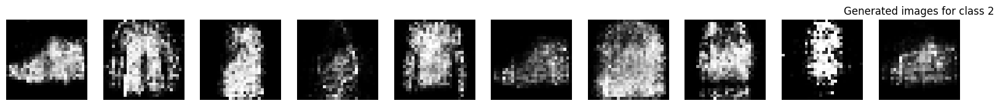

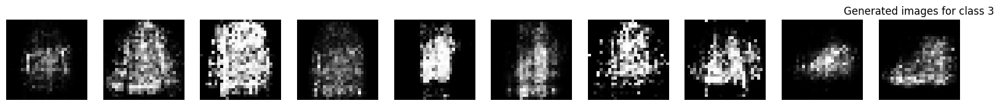

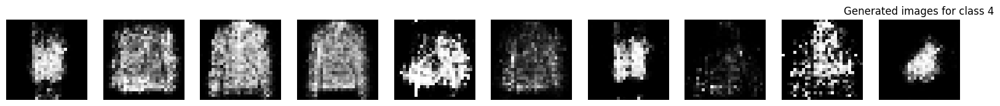

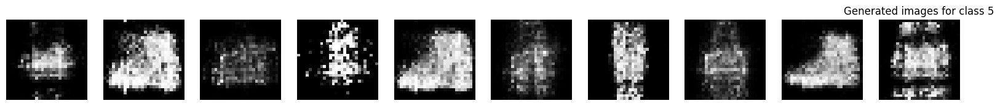

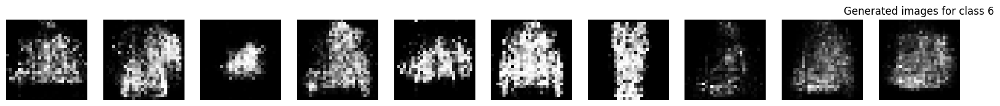

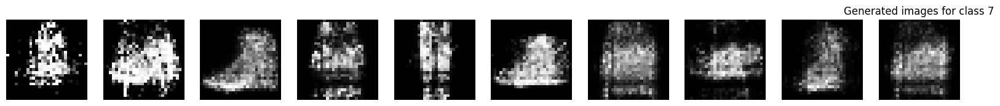

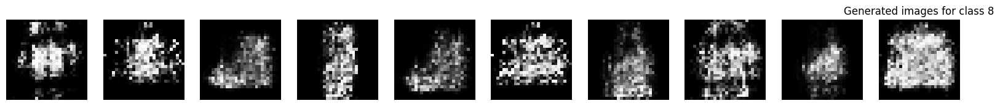

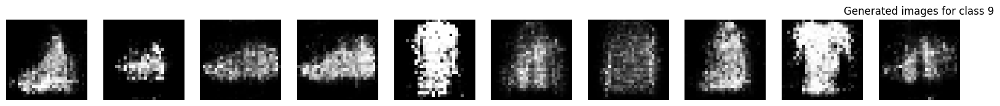

Epoch [36/50], Batch [100/938], D Loss: 0.6539, G Loss: 0.9797
Epoch [36/50], Batch [200/938], D Loss: 0.6815, G Loss: 0.9420
Epoch [36/50], Batch [300/938], D Loss: 0.6150, G Loss: 1.0245
Epoch [36/50], Batch [400/938], D Loss: 0.6195, G Loss: 0.8015
Epoch [36/50], Batch [500/938], D Loss: 0.5881, G Loss: 0.9152
Epoch [36/50], Batch [600/938], D Loss: 0.6182, G Loss: 0.7537
Epoch [36/50], Batch [700/938], D Loss: 0.6268, G Loss: 0.7112
Epoch [36/50], Batch [800/938], D Loss: 0.5852, G Loss: 0.8505
Epoch [36/50], Batch [900/938], D Loss: 0.6498, G Loss: 0.8099


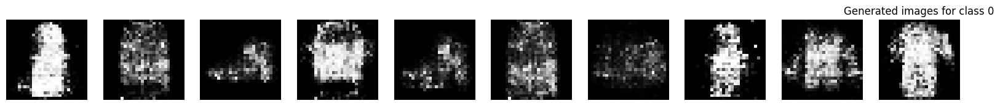

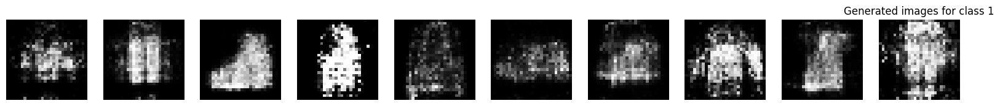

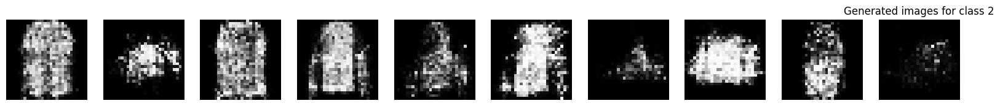

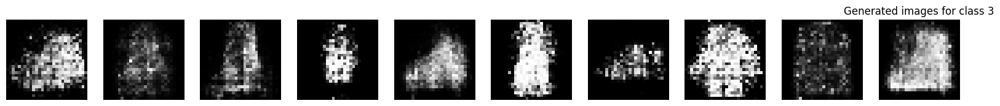

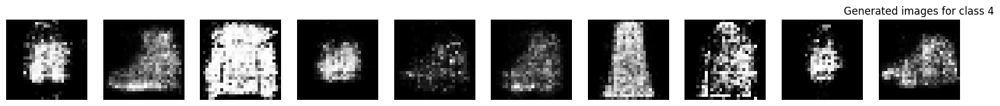

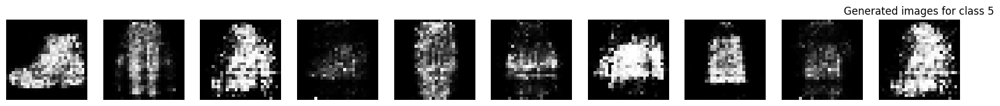

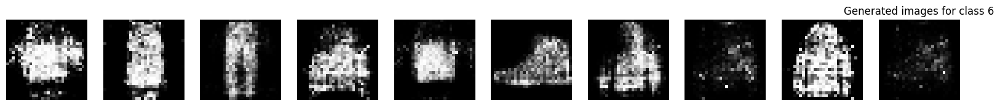

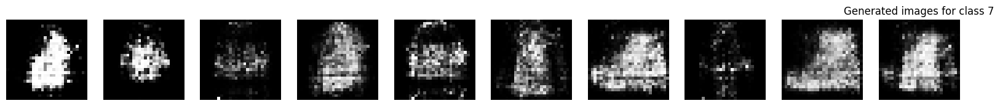

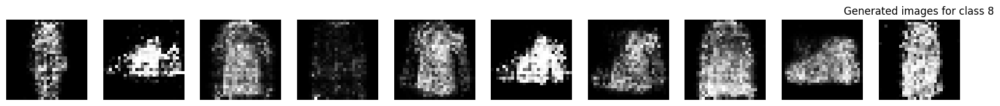

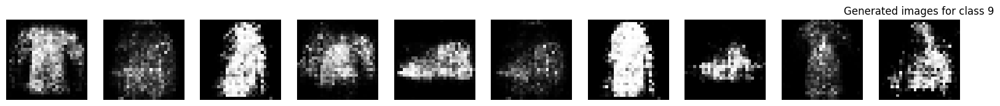

Epoch [37/50], Batch [100/938], D Loss: 0.6340, G Loss: 0.8033
Epoch [37/50], Batch [200/938], D Loss: 0.6405, G Loss: 0.8519
Epoch [37/50], Batch [300/938], D Loss: 0.6037, G Loss: 0.9722
Epoch [37/50], Batch [400/938], D Loss: 0.6012, G Loss: 0.9650
Epoch [37/50], Batch [500/938], D Loss: 0.6040, G Loss: 0.7856
Epoch [37/50], Batch [600/938], D Loss: 0.5684, G Loss: 0.7523
Epoch [37/50], Batch [700/938], D Loss: 0.6003, G Loss: 0.9464
Epoch [37/50], Batch [800/938], D Loss: 0.6412, G Loss: 0.8875
Epoch [37/50], Batch [900/938], D Loss: 0.6094, G Loss: 0.9592


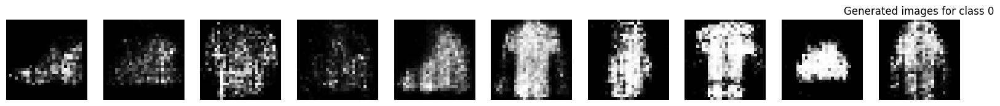

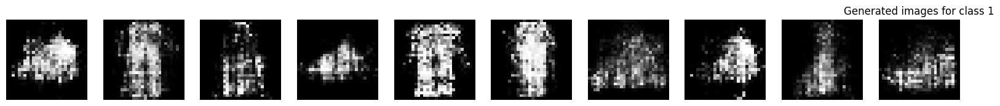

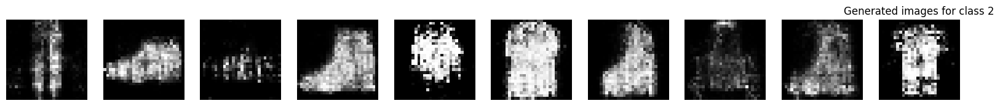

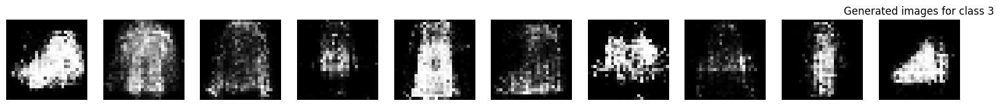

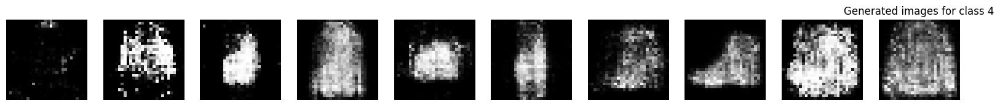

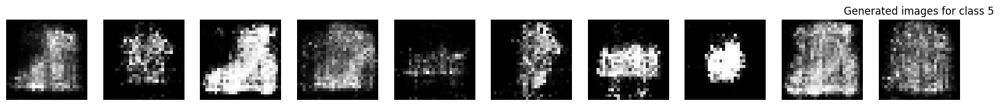

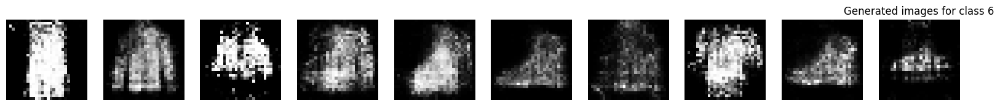

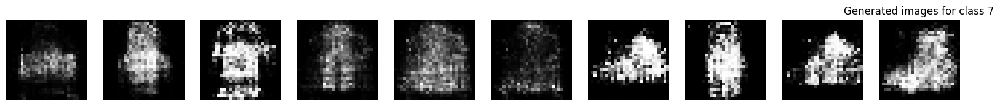

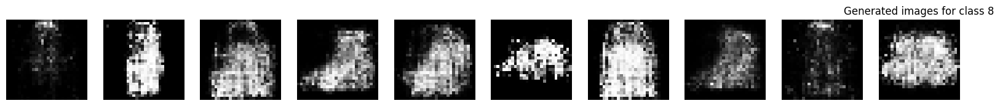

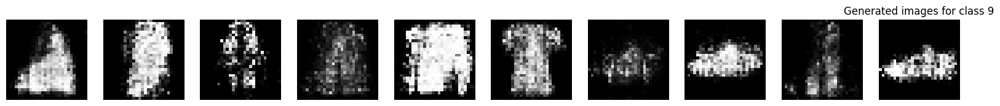

Epoch [38/50], Batch [100/938], D Loss: 0.6226, G Loss: 1.0459
Epoch [38/50], Batch [200/938], D Loss: 0.6100, G Loss: 0.9110
Epoch [38/50], Batch [300/938], D Loss: 0.6183, G Loss: 0.8560
Epoch [38/50], Batch [400/938], D Loss: 0.7410, G Loss: 0.5157
Epoch [38/50], Batch [500/938], D Loss: 0.5288, G Loss: 0.8983
Epoch [38/50], Batch [600/938], D Loss: 0.6191, G Loss: 0.7193
Epoch [38/50], Batch [700/938], D Loss: 0.5919, G Loss: 1.1422
Epoch [38/50], Batch [800/938], D Loss: 0.5940, G Loss: 0.8570
Epoch [38/50], Batch [900/938], D Loss: 0.6447, G Loss: 0.9306


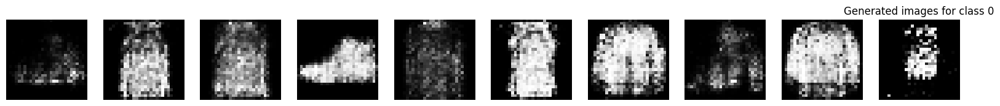

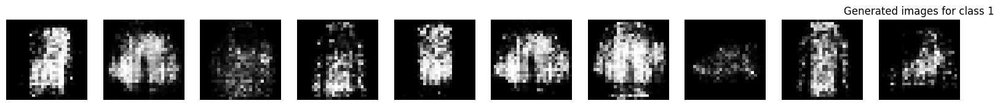

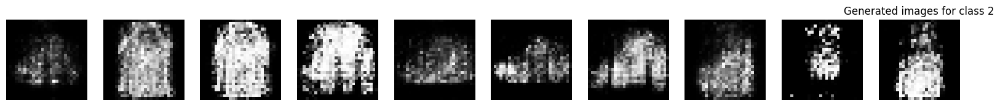

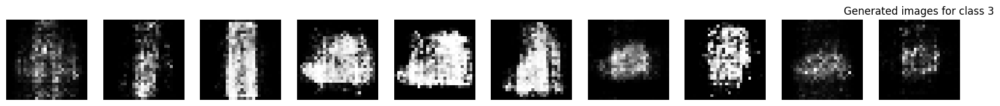

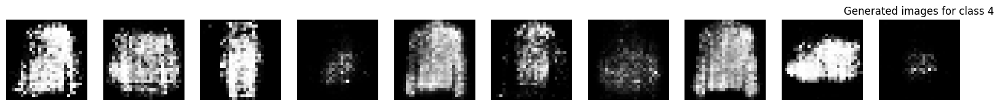

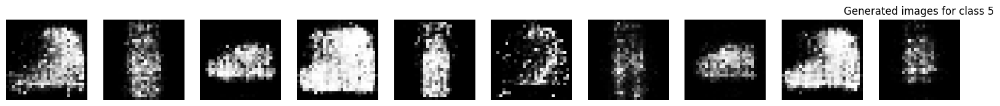

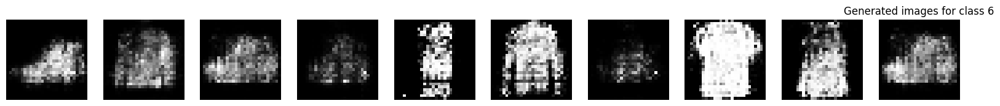

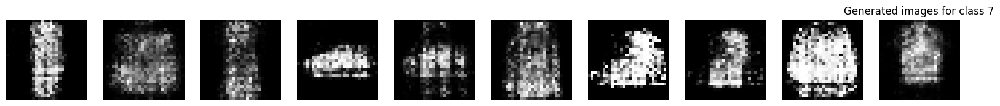

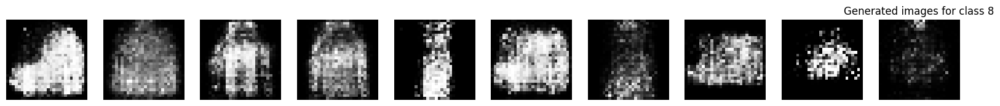

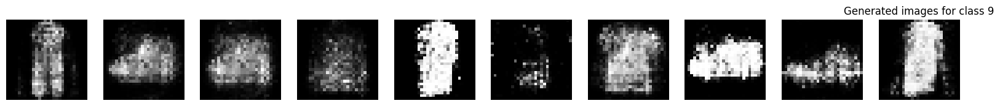

Epoch [39/50], Batch [100/938], D Loss: 0.6814, G Loss: 0.7924
Epoch [39/50], Batch [200/938], D Loss: 0.5845, G Loss: 0.6916
Epoch [39/50], Batch [300/938], D Loss: 0.5901, G Loss: 0.7882
Epoch [39/50], Batch [400/938], D Loss: 0.6398, G Loss: 0.6625
Epoch [39/50], Batch [500/938], D Loss: 0.6027, G Loss: 0.7260
Epoch [39/50], Batch [600/938], D Loss: 0.6214, G Loss: 0.9330
Epoch [39/50], Batch [700/938], D Loss: 0.6637, G Loss: 1.1357
Epoch [39/50], Batch [800/938], D Loss: 0.6722, G Loss: 1.2397
Epoch [39/50], Batch [900/938], D Loss: 0.6145, G Loss: 0.7894


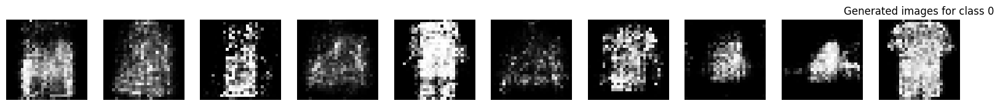

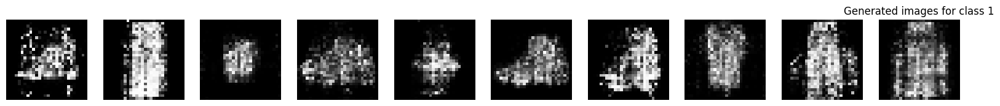

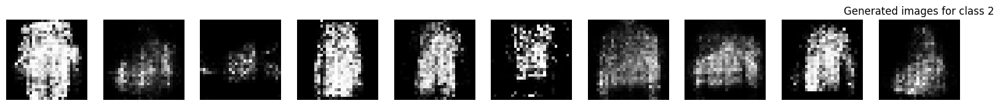

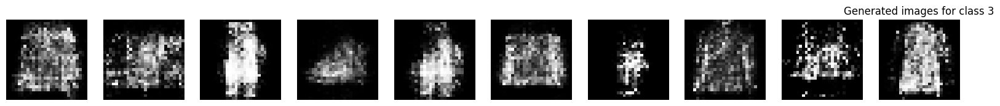

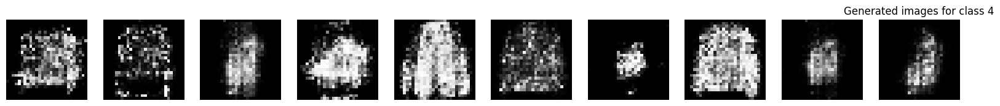

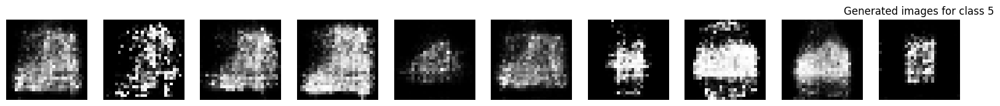

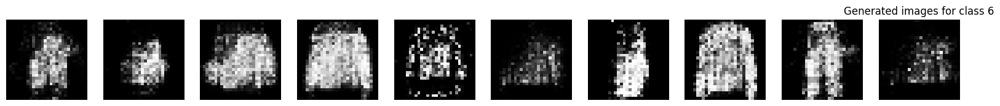

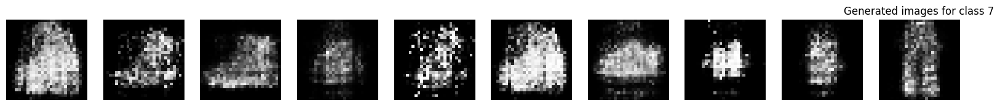

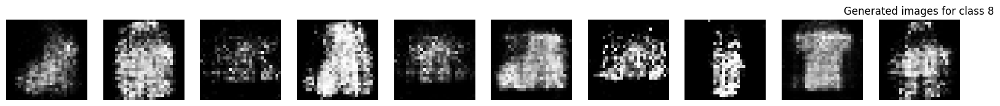

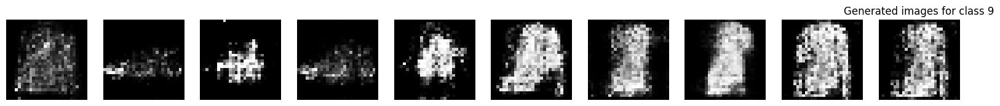

Epoch [40/50], Batch [100/938], D Loss: 0.6054, G Loss: 0.7855
Epoch [40/50], Batch [200/938], D Loss: 0.5902, G Loss: 0.9729
Epoch [40/50], Batch [300/938], D Loss: 0.6551, G Loss: 0.7802
Epoch [40/50], Batch [400/938], D Loss: 0.5965, G Loss: 0.7830
Epoch [40/50], Batch [500/938], D Loss: 0.5705, G Loss: 0.8216
Epoch [40/50], Batch [600/938], D Loss: 0.6171, G Loss: 0.7840
Epoch [40/50], Batch [700/938], D Loss: 0.5879, G Loss: 0.9030
Epoch [40/50], Batch [800/938], D Loss: 0.5939, G Loss: 0.7842
Epoch [40/50], Batch [900/938], D Loss: 0.7240, G Loss: 0.8418


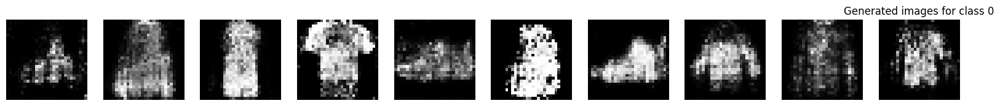

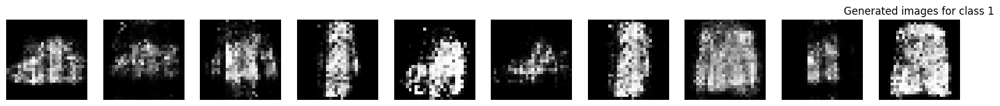

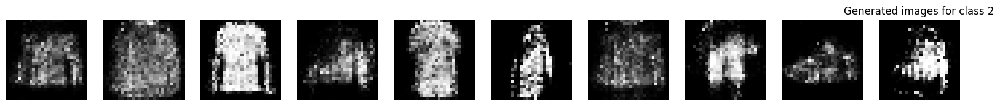

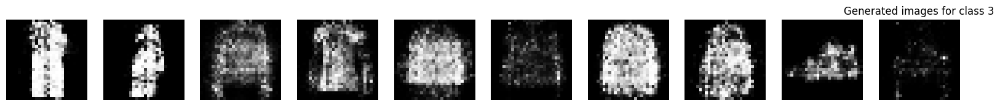

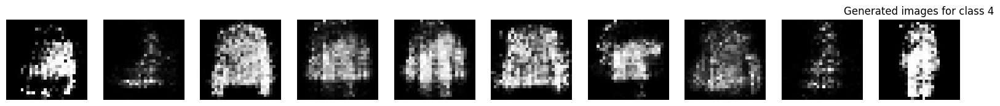

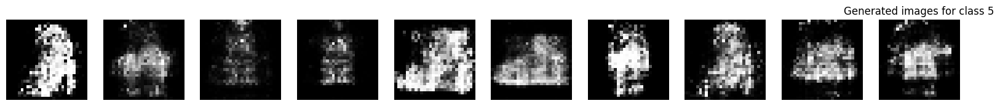

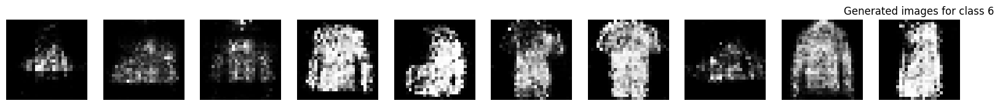

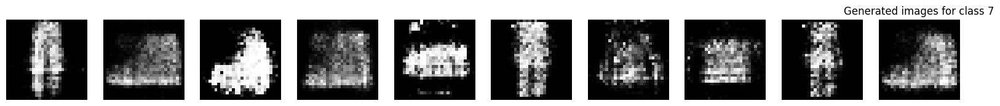

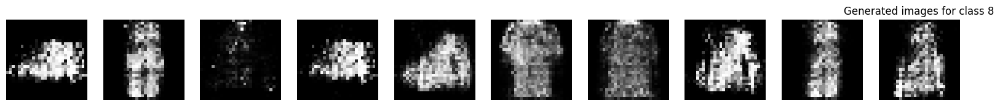

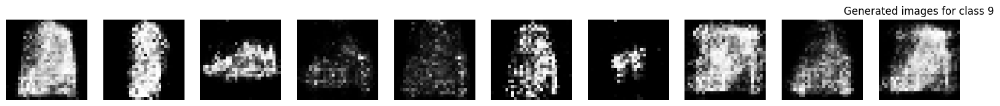

Epoch [41/50], Batch [100/938], D Loss: 0.5800, G Loss: 0.8449
Epoch [41/50], Batch [200/938], D Loss: 0.6462, G Loss: 0.8641
Epoch [41/50], Batch [300/938], D Loss: 0.6666, G Loss: 0.9144
Epoch [41/50], Batch [400/938], D Loss: 0.6318, G Loss: 0.7677
Epoch [41/50], Batch [500/938], D Loss: 0.5993, G Loss: 0.8611
Epoch [41/50], Batch [600/938], D Loss: 0.6799, G Loss: 1.0318
Epoch [41/50], Batch [700/938], D Loss: 0.6194, G Loss: 1.0187
Epoch [41/50], Batch [800/938], D Loss: 0.6023, G Loss: 1.1199
Epoch [41/50], Batch [900/938], D Loss: 0.5886, G Loss: 0.8559


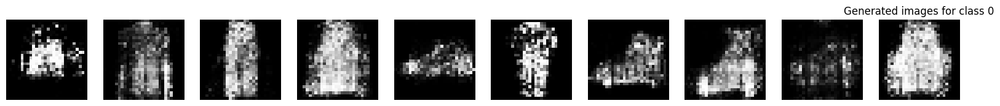

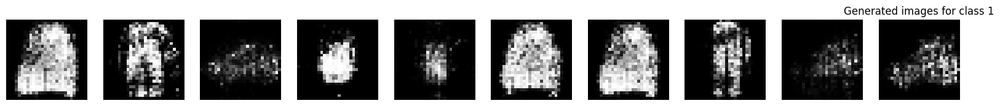

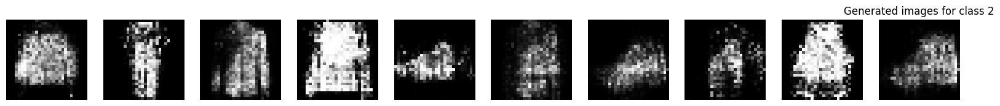

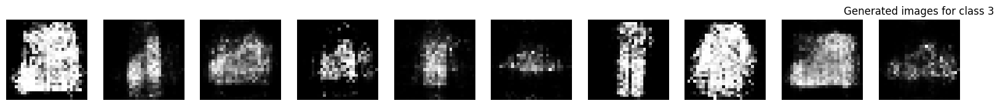

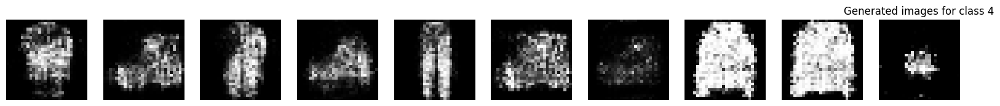

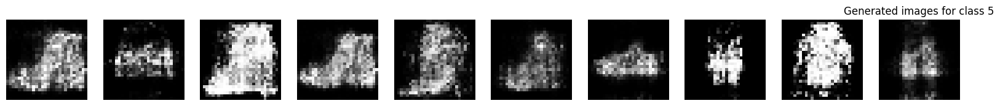

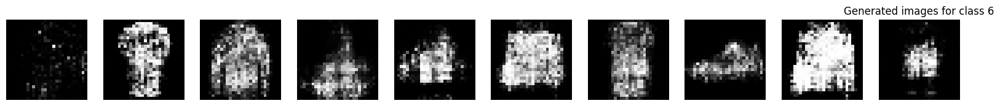

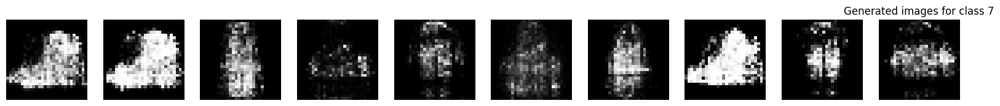

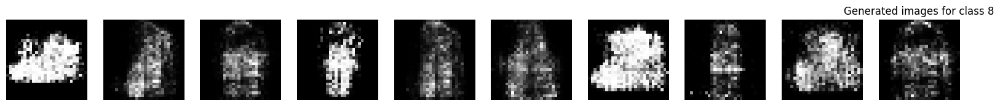

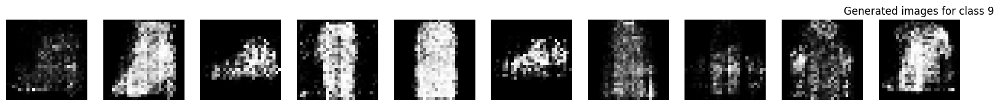

Epoch [42/50], Batch [100/938], D Loss: 0.5739, G Loss: 0.9678
Epoch [42/50], Batch [200/938], D Loss: 0.6371, G Loss: 0.9312
Epoch [42/50], Batch [300/938], D Loss: 0.5938, G Loss: 0.8837
Epoch [42/50], Batch [400/938], D Loss: 0.6106, G Loss: 1.0038
Epoch [42/50], Batch [500/938], D Loss: 0.6452, G Loss: 0.7979
Epoch [42/50], Batch [600/938], D Loss: 0.5635, G Loss: 0.7818
Epoch [42/50], Batch [700/938], D Loss: 0.5969, G Loss: 0.9629
Epoch [42/50], Batch [800/938], D Loss: 0.6301, G Loss: 0.9255
Epoch [42/50], Batch [900/938], D Loss: 0.5365, G Loss: 0.9613


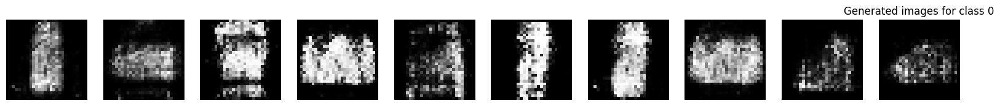

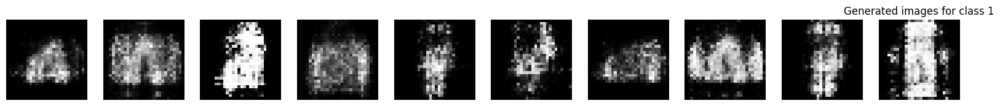

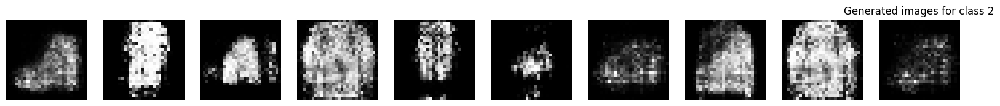

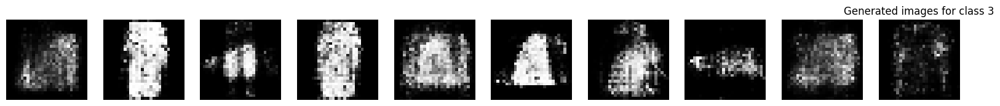

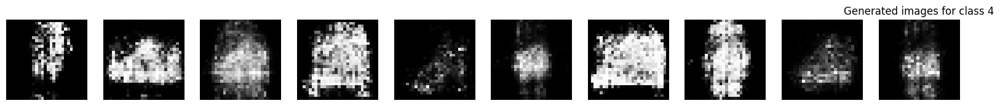

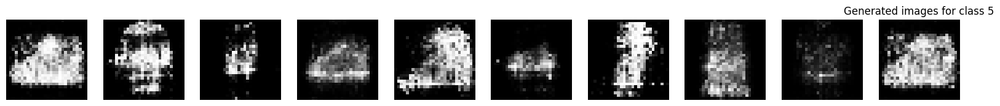

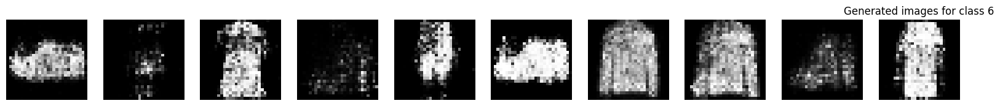

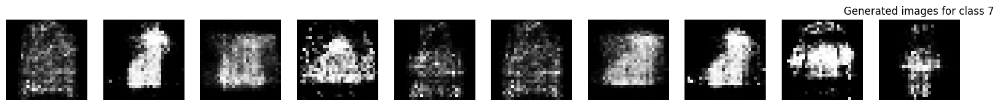

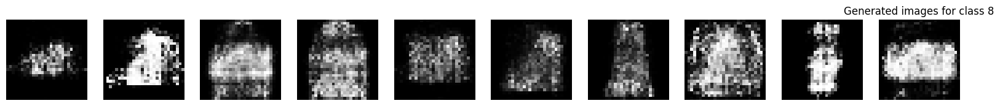

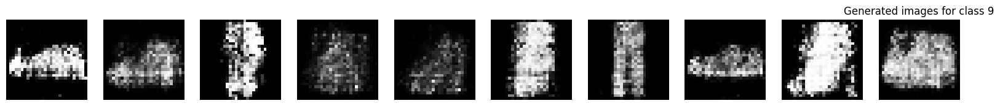

Epoch [43/50], Batch [100/938], D Loss: 0.6648, G Loss: 0.9058
Epoch [43/50], Batch [200/938], D Loss: 0.6418, G Loss: 0.9090
Epoch [43/50], Batch [300/938], D Loss: 0.5585, G Loss: 1.1322
Epoch [43/50], Batch [400/938], D Loss: 0.6155, G Loss: 0.9104
Epoch [43/50], Batch [500/938], D Loss: 0.6209, G Loss: 0.8007
Epoch [43/50], Batch [600/938], D Loss: 0.6192, G Loss: 0.8823
Epoch [43/50], Batch [700/938], D Loss: 0.5375, G Loss: 1.0487
Epoch [43/50], Batch [800/938], D Loss: 0.7044, G Loss: 0.6152
Epoch [43/50], Batch [900/938], D Loss: 0.6188, G Loss: 0.8503


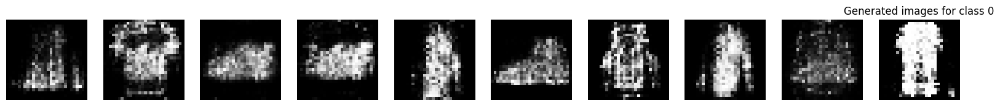

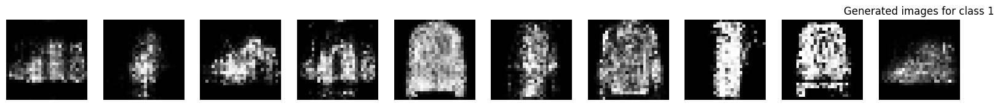

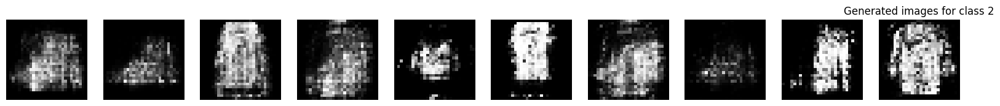

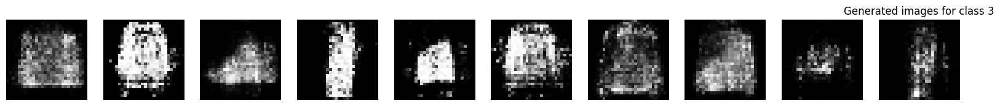

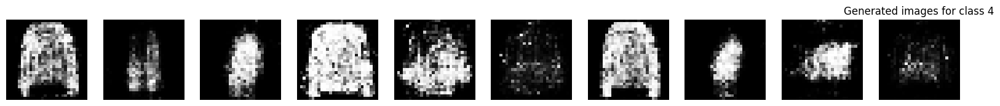

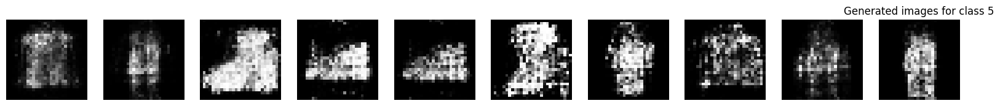

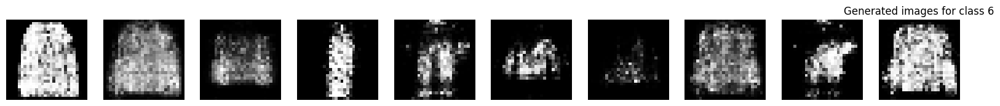

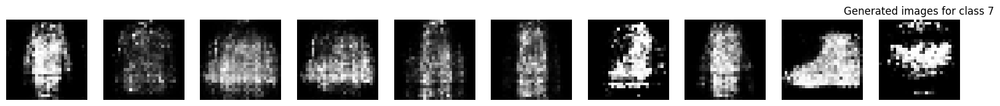

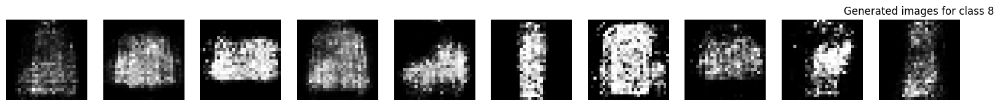

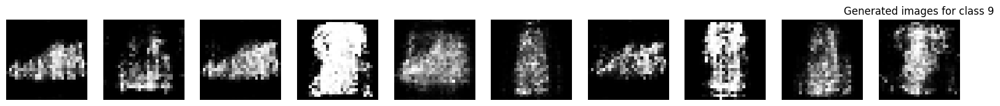

Epoch [44/50], Batch [100/938], D Loss: 0.6311, G Loss: 0.8903
Epoch [44/50], Batch [200/938], D Loss: 0.6175, G Loss: 0.8218
Epoch [44/50], Batch [300/938], D Loss: 0.6456, G Loss: 0.6897
Epoch [44/50], Batch [400/938], D Loss: 0.6250, G Loss: 0.9525
Epoch [44/50], Batch [500/938], D Loss: 0.5864, G Loss: 1.0345
Epoch [44/50], Batch [600/938], D Loss: 0.5965, G Loss: 0.7857
Epoch [44/50], Batch [700/938], D Loss: 0.6345, G Loss: 0.8786
Epoch [44/50], Batch [800/938], D Loss: 0.5869, G Loss: 0.9223
Epoch [44/50], Batch [900/938], D Loss: 0.5911, G Loss: 0.8327


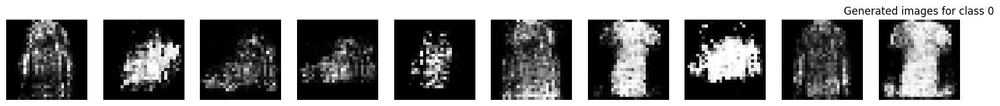

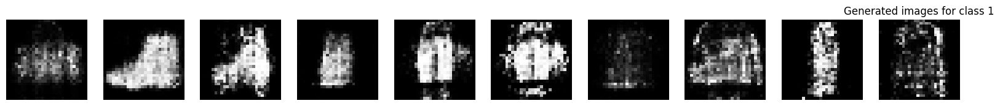

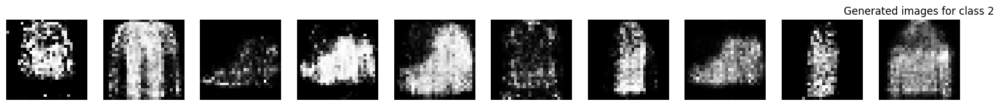

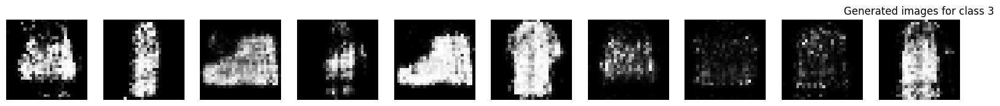

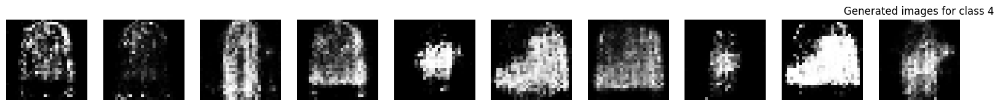

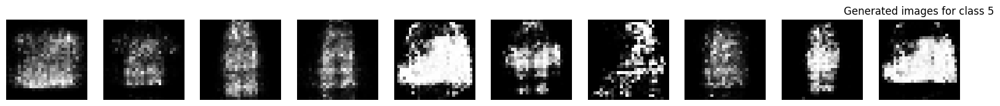

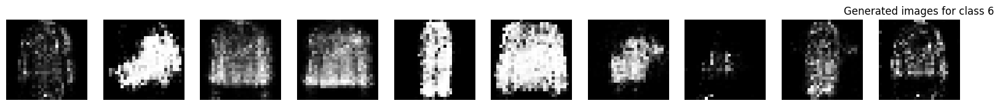

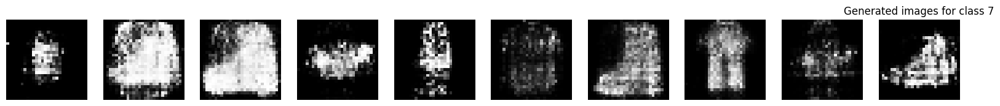

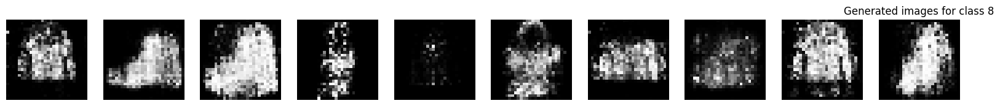

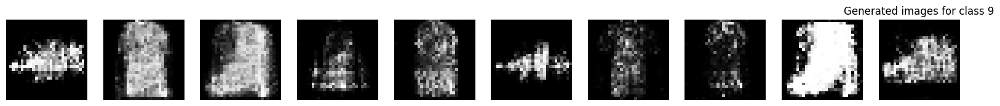

Epoch [45/50], Batch [100/938], D Loss: 0.6676, G Loss: 1.1420
Epoch [45/50], Batch [200/938], D Loss: 0.6022, G Loss: 0.9444
Epoch [45/50], Batch [300/938], D Loss: 0.6362, G Loss: 0.8877
Epoch [45/50], Batch [400/938], D Loss: 0.6040, G Loss: 1.1639
Epoch [45/50], Batch [500/938], D Loss: 0.5726, G Loss: 0.9928
Epoch [45/50], Batch [600/938], D Loss: 0.6238, G Loss: 0.9332
Epoch [45/50], Batch [700/938], D Loss: 0.6207, G Loss: 0.9745
Epoch [45/50], Batch [800/938], D Loss: 0.6199, G Loss: 1.0165
Epoch [45/50], Batch [900/938], D Loss: 0.7543, G Loss: 0.4419


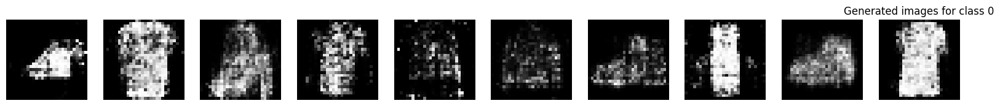

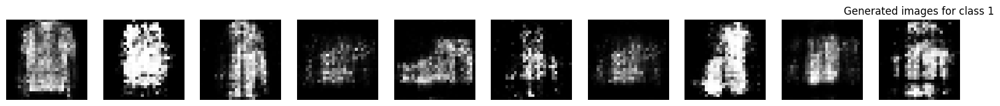

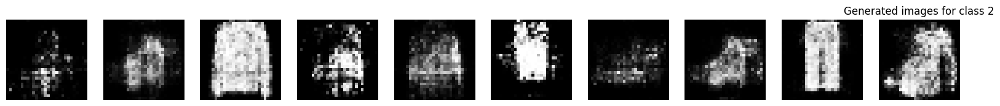

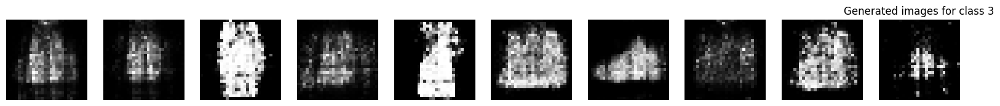

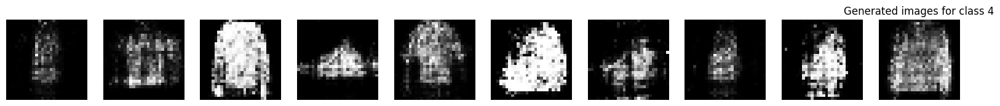

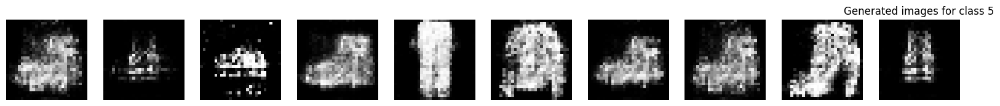

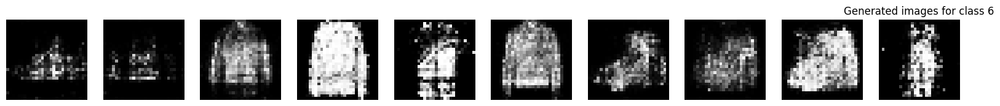

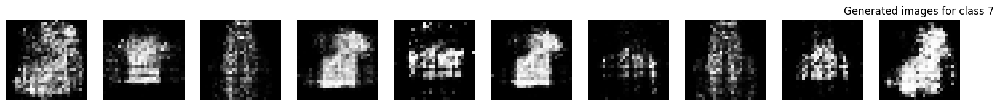

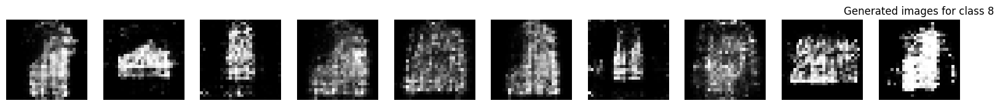

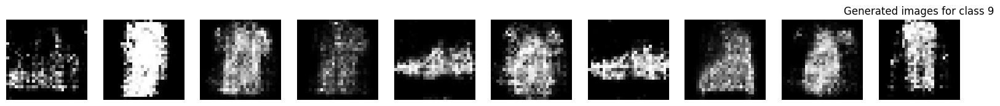

Epoch [46/50], Batch [100/938], D Loss: 0.6745, G Loss: 0.8604
Epoch [46/50], Batch [200/938], D Loss: 0.6501, G Loss: 1.1411
Epoch [46/50], Batch [300/938], D Loss: 0.6656, G Loss: 0.6053
Epoch [46/50], Batch [400/938], D Loss: 0.5712, G Loss: 1.0123
Epoch [46/50], Batch [500/938], D Loss: 0.6239, G Loss: 0.9415
Epoch [46/50], Batch [600/938], D Loss: 0.6528, G Loss: 0.9019
Epoch [46/50], Batch [700/938], D Loss: 0.6836, G Loss: 1.0709
Epoch [46/50], Batch [800/938], D Loss: 0.6441, G Loss: 0.8575
Epoch [46/50], Batch [900/938], D Loss: 0.5616, G Loss: 0.9049


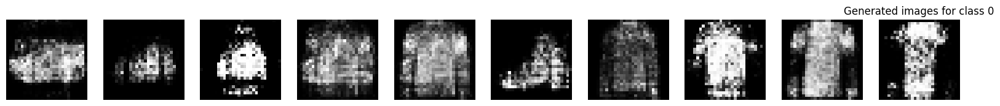

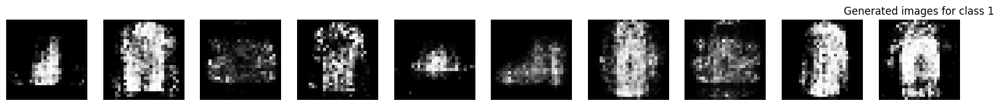

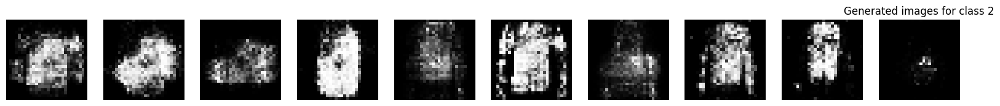

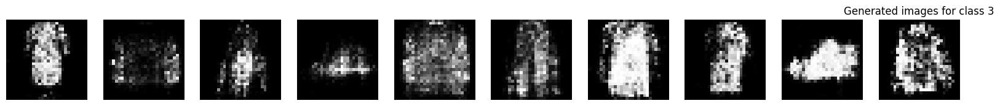

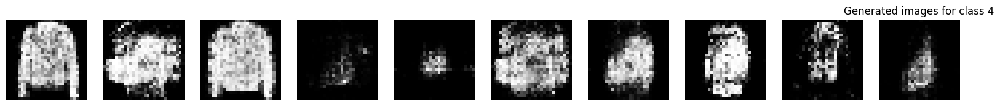

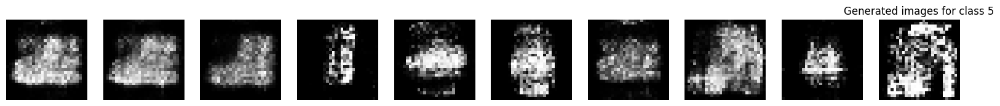

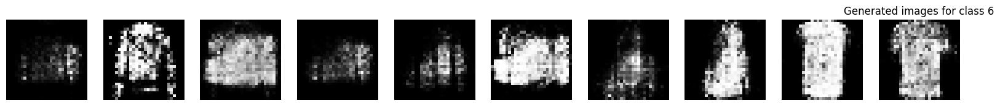

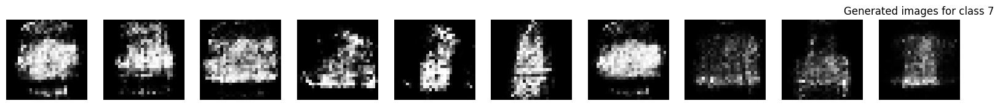

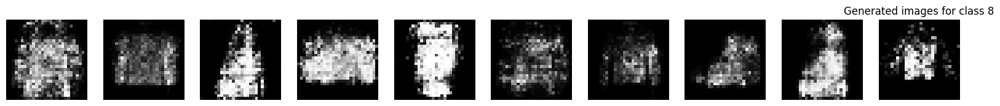

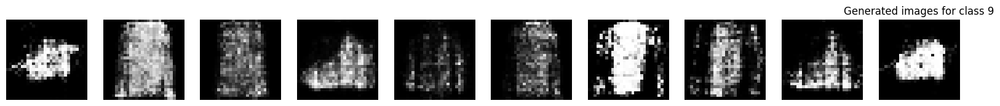

Epoch [47/50], Batch [100/938], D Loss: 0.6519, G Loss: 0.9421
Epoch [47/50], Batch [200/938], D Loss: 0.6048, G Loss: 0.9938
Epoch [47/50], Batch [300/938], D Loss: 0.6092, G Loss: 0.8110
Epoch [47/50], Batch [400/938], D Loss: 0.6129, G Loss: 0.9054
Epoch [47/50], Batch [500/938], D Loss: 0.6159, G Loss: 0.9293
Epoch [47/50], Batch [600/938], D Loss: 0.6646, G Loss: 0.9139
Epoch [47/50], Batch [700/938], D Loss: 0.6330, G Loss: 1.1663
Epoch [47/50], Batch [800/938], D Loss: 0.6086, G Loss: 0.7565
Epoch [47/50], Batch [900/938], D Loss: 0.5795, G Loss: 0.8168


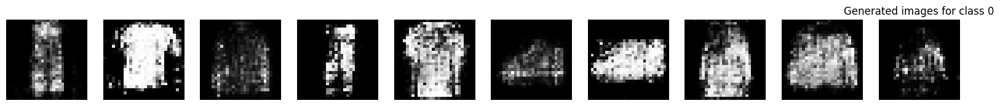

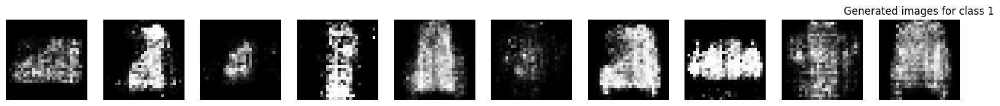

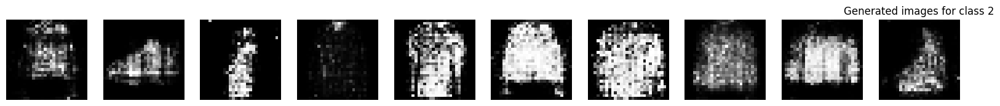

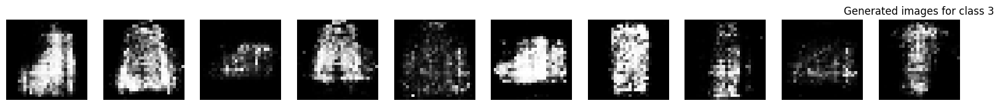

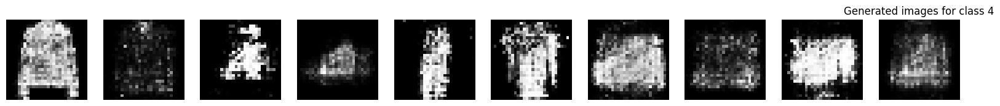

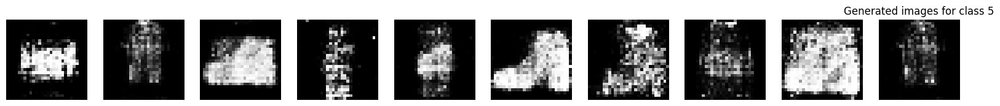

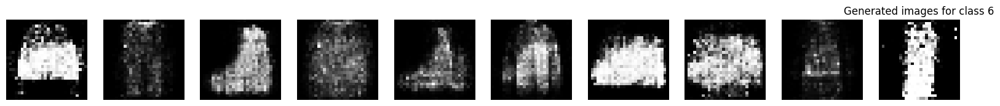

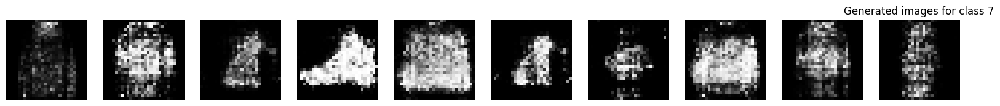

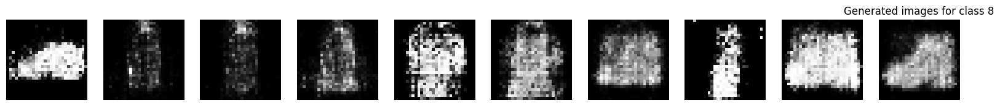

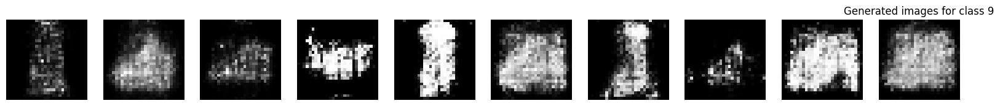

Epoch [48/50], Batch [100/938], D Loss: 0.5923, G Loss: 0.7838
Epoch [48/50], Batch [200/938], D Loss: 0.6601, G Loss: 0.8189
Epoch [48/50], Batch [300/938], D Loss: 0.6262, G Loss: 0.8641
Epoch [48/50], Batch [400/938], D Loss: 0.5929, G Loss: 1.0288
Epoch [48/50], Batch [500/938], D Loss: 0.6402, G Loss: 0.7276
Epoch [48/50], Batch [600/938], D Loss: 0.6535, G Loss: 0.8503
Epoch [48/50], Batch [700/938], D Loss: 0.5860, G Loss: 0.8389
Epoch [48/50], Batch [800/938], D Loss: 0.5860, G Loss: 1.0066
Epoch [48/50], Batch [900/938], D Loss: 0.6308, G Loss: 0.7953


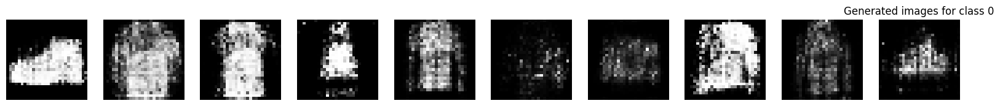

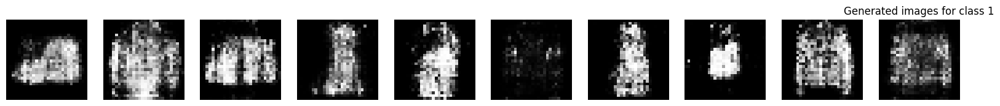

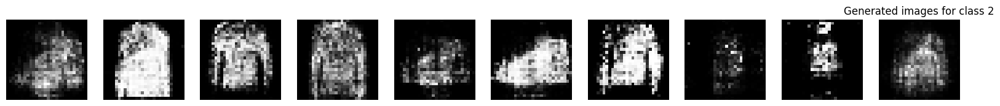

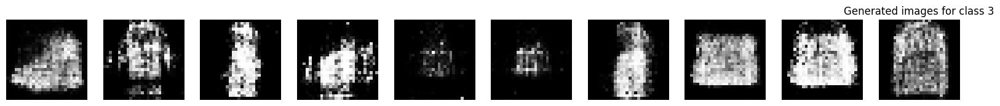

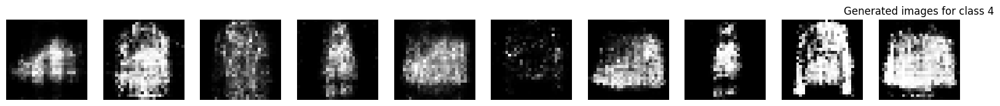

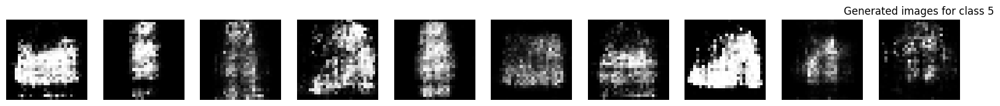

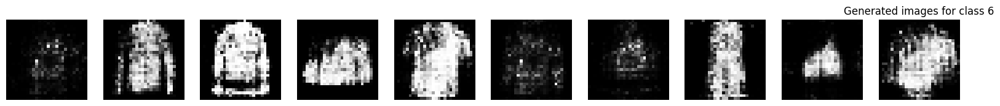

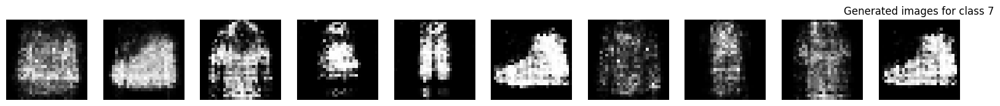

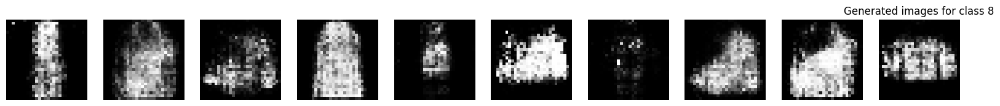

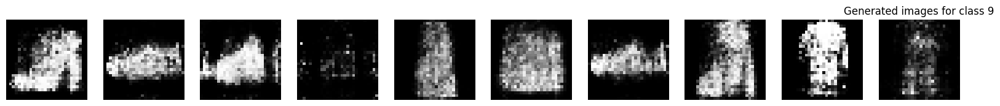

Epoch [49/50], Batch [100/938], D Loss: 0.6558, G Loss: 0.8688
Epoch [49/50], Batch [200/938], D Loss: 0.6057, G Loss: 0.9073
Epoch [49/50], Batch [300/938], D Loss: 0.5963, G Loss: 1.0012
Epoch [49/50], Batch [400/938], D Loss: 0.6144, G Loss: 0.9200
Epoch [49/50], Batch [500/938], D Loss: 0.6140, G Loss: 0.7688
Epoch [49/50], Batch [600/938], D Loss: 0.5978, G Loss: 0.8130
Epoch [49/50], Batch [700/938], D Loss: 0.5928, G Loss: 0.9219
Epoch [49/50], Batch [800/938], D Loss: 0.6212, G Loss: 0.9470
Epoch [49/50], Batch [900/938], D Loss: 0.5562, G Loss: 1.2474


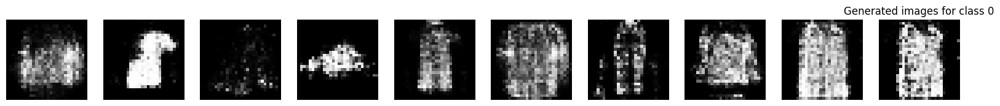

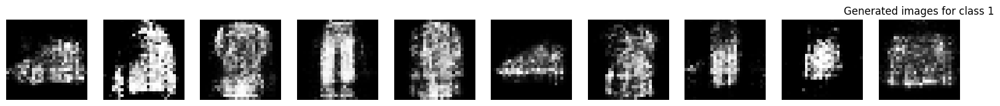

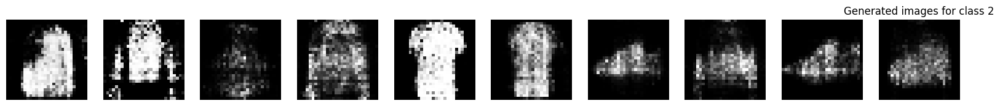

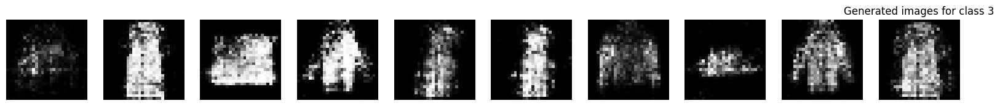

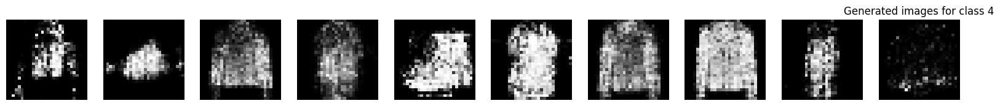

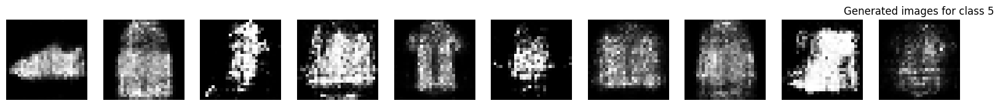

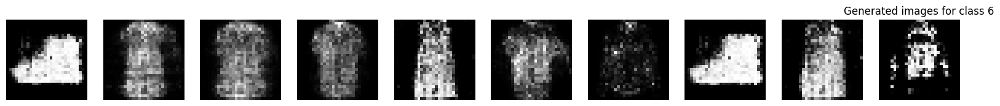

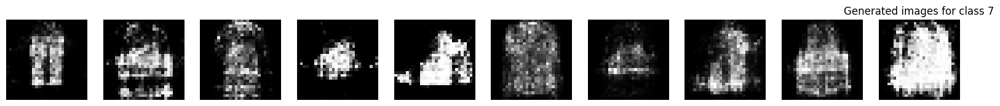

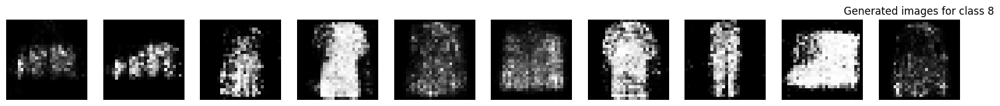

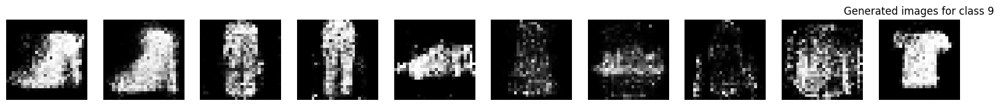

Epoch [50/50], Batch [100/938], D Loss: 0.6255, G Loss: 0.9551
Epoch [50/50], Batch [200/938], D Loss: 0.5730, G Loss: 0.9975
Epoch [50/50], Batch [300/938], D Loss: 0.6103, G Loss: 0.9430
Epoch [50/50], Batch [400/938], D Loss: 0.6512, G Loss: 1.1592
Epoch [50/50], Batch [500/938], D Loss: 0.6531, G Loss: 0.8637
Epoch [50/50], Batch [600/938], D Loss: 0.6734, G Loss: 0.7765
Epoch [50/50], Batch [700/938], D Loss: 0.6352, G Loss: 0.8250
Epoch [50/50], Batch [800/938], D Loss: 0.6134, G Loss: 0.8395
Epoch [50/50], Batch [900/938], D Loss: 0.6005, G Loss: 0.8879


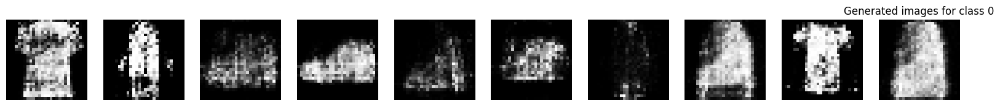

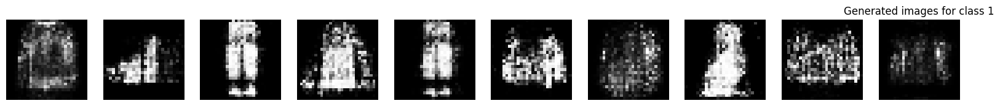

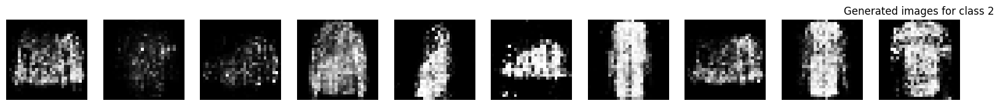

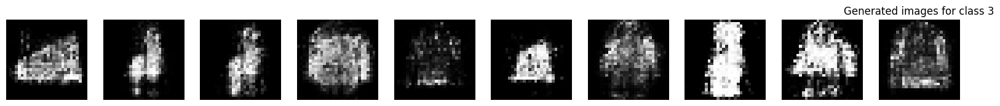

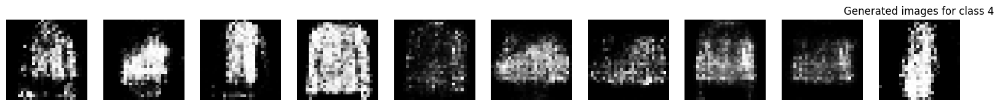

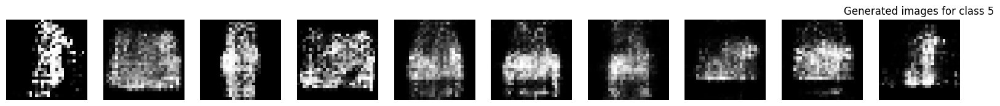

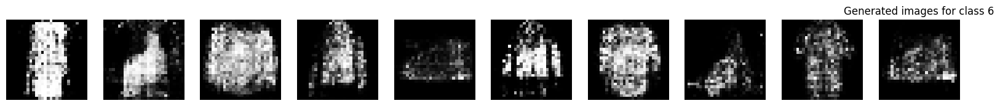

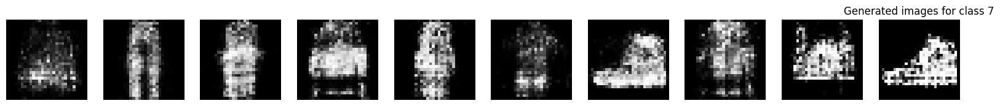

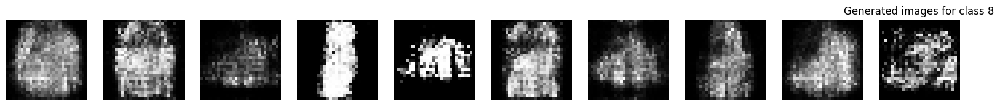

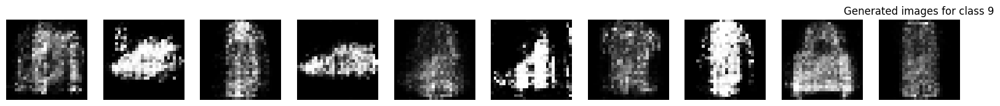

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# Hyperparameters
latent_dim = 100
num_classes = 10
image_size = 28 * 28
batch_size = 64
epochs = 50
lr = 0.0002
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Generator
class Generator(nn.Module):
    def __init__(self, latent_dim, num_classes, image_size):
        super(Generator, self).__init__()
        self.label_embedding = nn.Embedding(num_classes, num_classes)
        self.model = nn.Sequential(
            nn.Linear(latent_dim + num_classes, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, image_size),
            nn.Tanh(),
        )

    def forward(self, noise, labels):
        labels_embedded = self.label_embedding(labels)
        x = torch.cat((noise, labels_embedded), -1)
        return self.model(x)

# Discriminator
class Discriminator(nn.Module):
    def __init__(self, num_classes, image_size):
        super(Discriminator, self).__init__()
        self.label_embedding = nn.Embedding(num_classes, num_classes)
        self.model = nn.Sequential(
            nn.Linear(image_size + num_classes, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, images, labels):
        labels_embedded = self.label_embedding(labels)
        x = torch.cat((images, labels_embedded), -1)
        return self.model(x)

# Initialize models
generator = Generator(latent_dim, num_classes, image_size).to(device)
discriminator = Discriminator(num_classes, image_size).to(device)

# Loss and optimizers
adversarial_loss = nn.BCELoss()
g_optimizer = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
d_optimizer = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

# Data loading
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])
data = datasets.FashionMNIST(root="./data", train=True, transform=transform, download=True)
data_loader = DataLoader(data, batch_size=batch_size, shuffle=True)

# Training
for epoch in range(epochs):
    for i, (imgs, labels) in enumerate(data_loader):
        batch_size = imgs.size(0)

        # Real images
        real_imgs = imgs.view(batch_size, -1).to(device)
        labels = labels.to(device)
        real_validity = torch.ones(batch_size, 1).to(device)
        fake_validity = torch.zeros(batch_size, 1).to(device)

        # Train Generator
        z = torch.randn(batch_size, latent_dim).to(device)
        gen_labels = torch.randint(0, num_classes, (batch_size,)).to(device)
        gen_imgs = generator(z, gen_labels)

        g_loss = adversarial_loss(discriminator(gen_imgs, gen_labels), real_validity)
        g_optimizer.zero_grad()
        g_loss.backward()
        g_optimizer.step()

        # Train Discriminator
        real_loss = adversarial_loss(discriminator(real_imgs, labels), real_validity)
        fake_loss = adversarial_loss(discriminator(gen_imgs.detach(), gen_labels), fake_validity)
        d_loss = (real_loss + fake_loss) / 2

        d_optimizer.zero_grad()
        d_loss.backward()
        d_optimizer.step()



        # HIỂN THỊ EPOCH, BATCH, VÀ LOSS CỦA DISCRIMINATOR VÀ GENERATOR SAU MỖI 100 BATCH
        #-------------------------WRITE YOUR CODE HERE-------------------------------------#
        if (i + 1) % 100 == 0:
          print(f"Epoch [{epoch + 1}/{epochs}], Batch [{i + 1}/{len(data_loader)}], "
                f"D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")

        #------------------------- YOUR CODE ENDS HERE-------------------------------------#


    #TẠO VÀ HIỂN THỊ ẢNH SAU MỖI EPOCH
    #-------------------------WRITE YOUR CODE HERE-------------------------------------#
    with torch.no_grad():
        # Generate images for each class
        num_images_per_class = 10  # Number of images to generate for each class
        for label in range(num_classes):
            # Create noise vector and labels for the current class
            noise = torch.randn(num_images_per_class, latent_dim).to(device)
            labels = torch.full((num_images_per_class,), label, dtype=torch.long).to(device)

            # Generate images
            gen_imgs = generator(noise, labels).cpu()

            # Display images
            fig, axs = plt.subplots(1, num_images_per_class, figsize=(20, 2))
            for j, img in enumerate(gen_imgs):
                img = img.view(28, 28).detach().numpy()
                axs[j].imshow(img, cmap='gray')
                axs[j].axis('off')
            plt.title(f'Generated images for class {label}')
            plt.show()
    #------------------------- YOUR CODE ENDS HERE-------------------------------------#


In [ ]:
#VIẾT CODE ĐỂ KẾT NỐI VỚI GOOGLE DRIVE VÀ LƯU MÔ HÌNH GENERATOR VÀ DISCRIMINATOR VÀO THƯ MỤC COLAB-MODELS CỦA GOOGLE DRIVE TƯƠNG ỨNG (TẠO THƯ MỤC NẾU CẦN)
#-------------------------WRITE YOUR CODE HERE-------------------------------------#
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Create the 'COLAB-MODELS' directory if it doesn't exist
models_dir = '/content/drive/My Drive/COLAB-MODELS'
if not os.path.exists(models_dir):
    os.makedirs(models_dir)

# Save the generator model
torch.save(generator.state_dict(), os.path.join(models_dir, 'generator.pth'))

# Save the discriminator model
torch.save(discriminator.state_dict(), os.path.join(models_dir, 'discriminator.pth'))
#------------------------- YOUR CODE ENDS HERE-------------------------------------#


Mounted at /content/drive
